# Setup & I/O

### Import packages

In [1]:
%matplotlib inline

from __future__ import print_function
import os, sys
from collections import Counter, defaultdict
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import time
import math

from scipy.misc import imresize
from skimage.transform import resize
from sklearn.preprocessing import StandardScaler

In [2]:
from matplotlib.pyplot import rcParams
rcParams['figure.figsize'] = (12,8)

In [3]:
%%time
DATA_DIR = '~/Downloads/CS230 Project/'

df_train_meta = pd.read_csv(DATA_DIR + 'training_set_metadata.csv')
print('{} training examples with {} metadata columns'.format(*df_train_meta.shape))
print('Columns and datatypes:')
print(df_train_meta.dtypes)

print()

df_train = pd.read_csv(DATA_DIR + 'training_set.csv')
print('{} time-series points with {} columns'.format(*df_train.shape))
print('Columns and datatypes:')
print(df_train.dtypes)

7848 training examples with 12 metadata columns
Columns and datatypes:
object_id               int64
ra                    float64
decl                  float64
gal_l                 float64
gal_b                 float64
ddf                     int64
hostgal_specz         float64
hostgal_photoz        float64
hostgal_photoz_err    float64
distmod               float64
mwebv                 float64
target                  int64
dtype: object

1421705 time-series points with 6 columns
Columns and datatypes:
object_id      int64
mjd          float64
passband       int64
flux         float64
flux_err     float64
detected       int64
dtype: object
CPU times: user 1.24 s, sys: 163 ms, total: 1.4 s
Wall time: 1.45 s


In [4]:
n_classes = len(df_train_meta.target.unique())
classes = np.array(sorted(df_train_meta.target.unique()))
print('There are {} classes.'.format(n_classes))

There are 14 classes.


### Training / dev set split

In [5]:
# Due to the small dataset size, we choose a 75/25 train/dev split.

np.random.seed(1)
training_split = 0.75
m = len(df_train_meta)
m_train = int(training_split*m)
m_dev = m - m_train
shuffle = np.random.permutation(m)
df_train_meta, df_dev_meta = df_train_meta.loc[sorted(shuffle[:m_train])], df_train_meta.loc[sorted(shuffle[m_train:])]

assert(len(df_train_meta) == m_train)
assert(len(df_dev_meta) == m_dev)

df_train, df_dev = df_train[df_train.object_id.isin(df_train_meta.object_id)], df_train[df_train.object_id.isin(df_dev_meta.object_id)]
# make sure every class is represented in both the training and dev sets
assert(len(df_train_meta.target.unique()) == n_classes)
assert(len(df_dev_meta.target.unique()) == n_classes)

In [79]:
print(m_train, m_dev)

5886 1962


## Evaluation

In [6]:
from sklearn.metrics import confusion_matrix

def weighted_accuracy(actuals, preds):
    '''Calculates the evaluation metric of equal-class-weighted accuracy'''
    cm = confusion_matrix(actuals, preds, classes)
    # normalize confusion matrix, so that summing over predicted classes equals 1
    cm = cm.astype('float') / np.sum(cm, axis=1, keepdims=True)
    return np.trace(cm) / len(cm)

In [7]:
import seaborn as sns

def plot_confusion_matrix(actuals, preds):
    '''Plots the confusion matrix, normalized to be a recall (not precision) metric.'''
    cm = confusion_matrix(actuals, preds, classes)
    # normalize confusion matrix, so that summing over predicted classes equals 1
    cm = cm.astype('float') / np.sum(cm, axis=1, keepdims=True)

    fig, ax = plt.subplots(figsize=(9,7))
    sns.heatmap(cm, xticklabels=classes, yticklabels=classes, cmap='Blues', annot=np.around(cm, 2), lw=0.5,
               vmin=0, vmax=1)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    ax.set_aspect('equal')
    ax.set_title('Weighted accuracy: {:.2%}'.format(weighted_accuracy(actuals, preds)))

# PyTorch

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms, datasets

### Data Processing

In [9]:
import warnings

In [10]:
%%time
# FLUX TIME SERIES PREPROCESSING
n_timepoints = df_train.groupby('object_id')['flux'].count().max()
n_passbands = len(df_train.passband.unique())
data = np.zeros((m_train, n_passbands, n_timepoints))
idx = 0
for object_id, df1 in df_train.groupby('object_id'):
    # pivot on passband
    df2 = df1.pivot(index='mjd', columns='passband', values='flux')
    # fill in missing data using linear interpolation
    arr1 = np.array(df2.interpolate('index', limit_direction='both'))
    # resize the image to n_passbands
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        arr2 = resize(arr1.T, (n_passbands, n_timepoints))
    data[idx, :, :] = arr2
    idx += 1

CPU times: user 54.4 s, sys: 611 ms, total: 55 s
Wall time: 58.8 s


In [11]:
%%time

# perform the same data pre-processing on the dev dataset
data_dev = np.zeros((m_dev, n_passbands, n_timepoints))
idx = 0
for object_id, df1 in df_dev.groupby('object_id'):
    df2 = df1.pivot(index='mjd', columns='passband', values='flux')
    arr1 = np.array(df2.interpolate('index', limit_direction='both'))
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        arr2 = resize(arr1.T, (n_passbands, n_timepoints))
    data_dev[idx, :, :] = arr2
    idx += 1

CPU times: user 17.7 s, sys: 183 ms, total: 17.9 s
Wall time: 19.2 s


In [12]:
%%time
include_time_series_points = 0

# Derive some simple features, like min, max, etc from the time series fluxes
ts_simple_features = df_train.groupby('object_id')[['flux']].agg(['min', 'max', 'mean', 'std', 'median', 'skew'])
ts_simple_features.columns = ts_simple_features.columns.droplevel(0)
for i in xrange(include_time_series_points):
    ts_simple_features[str(i)] = df_train.groupby('object_id')[['flux']].nth(i)

# Join with metadata
X = df_train_meta.set_index('object_id').drop('target', axis=1) \
    .join(ts_simple_features, how='inner')
assert(len(df_train_meta) == len(X))

# Convert to np arrays
X = np.array(X.fillna(0))
y = np.array(df_train_meta.iloc[:, -1])

# Scale to zero mean and unit variance
scaler = StandardScaler()
X = scaler.fit_transform(X)


# Compute same features for dev set
ts_simple_features_dev = df_dev.groupby('object_id')[['flux']].agg(['min', 'max', 'mean', 'std', 'median', 'skew'])
ts_simple_features_dev.columns = ts_simple_features_dev.columns.droplevel(0)
for i in xrange(include_time_series_points):
    ts_simple_features_dev[str(i)] = df_dev.groupby('object_id')[['flux']].nth(i)

X_dev = df_dev_meta.set_index('object_id').drop('target', axis=1) \
    .join(ts_simple_features_dev, how='inner')
assert(len(df_dev_meta) == len(X_dev))

X_dev = np.array(X_dev.fillna(0))
y_dev = np.array(df_dev_meta.iloc[:, -1])

X_dev = scaler.transform(X_dev)

CPU times: user 2.28 s, sys: 102 ms, total: 2.38 s
Wall time: 2.58 s


### Helper functions

In [14]:
def count_parameters(model, only_trainable=True):
    if only_trainable:
        return sum(p.numel() for p in model.parameters() if p.requires_grad)
    else:
        return sum(p.numel() for p in model.parameters())

def print_summary(model):
    print('Number of trainable parameters:', count_parameters(model))
    print(model)

In [19]:
%%time

# define some helper variables
class_label_to_idx = {j:i for i,j in enumerate(classes)}
w = torch.tensor([1./i[1] for i in sorted(Counter(y).items())])

# convert all required data into PyTorch tensors
data_tensor = torch.Tensor(data)
metadata_tensor = torch.Tensor(X)
targets_as_idx = torch.tensor([class_label_to_idx[i] for i in y])

data_dev_tensor = torch.Tensor(data_dev)
metadata_dev_tensor = torch.Tensor(X_dev)
targets_as_idx_dev = torch.tensor([class_label_to_idx[i] for i in y_dev])

CPU times: user 55.2 ms, sys: 32.1 ms, total: 87.3 ms
Wall time: 89 ms


In [81]:
def evaluate_model(model, criterion, inputs, targets):
    '''Evaluates the model (finds the loss and plots the confusion matrix) 
       on a given set of inputs and expected targets.'''
    outputs = model(inputs)
    loss = criterion(outputs, targets).item()
    
    y_pred = classes[torch.max(outputs, 1)[1]]
    plot_confusion_matrix(classes[targets], y_pred)
    plt.show()
    
    return loss

def train_model(model, mini_batch_size=128, save_models=True, n_epochs=2000, print_frequency=100,
               lr=0.01):
    '''Trains a given model'''
    # Find model name, used for saved model files.
    modelName = type(model).__name__
    
    # define loss function and optimizer
    criterion = nn.CrossEntropyLoss(weight=w)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    batch_loss, train_loss, dev_loss = [], [], []
    
    # See what the scores are before training
    # Here we don't need to train, so the code is wrapped in torch.no_grad()
    with torch.no_grad():
        L = evaluate_model(model, criterion, (data_tensor, metadata_tensor), targets_as_idx)
        print('Training loss before training: {}'.format(L))
        train_loss.append(L)

        L = evaluate_model(model, criterion, (data_dev_tensor, metadata_dev_tensor), targets_as_idx_dev)
        print('Dev loss before training: {}'.format(L))
        dev_loss.append(L)
        
    # iterate over epochs
    for epoch in range(n_epochs):
        # select random sample of training data
        ids = np.random.choice(len(df_train_meta), size=mini_batch_size, replace=True)

        inputs = (data_tensor[ids, :, :], metadata_tensor[ids, :])
        targets = targets_as_idx[ids]

        model.zero_grad()
        outputs = model(inputs)

        # evaluate loss and backprop
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        batch_loss.append(loss.item())

        # every print_frequency epochs, print the loss and evaluate the model on training and dev data
        if epoch % print_frequency == (print_frequency-1):
            with torch.no_grad():
                # training loss
                L = evaluate_model(model, criterion, (data_tensor, metadata_tensor), targets_as_idx)
                print('Training loss at epoch {}: {}'.format(epoch+1, L))
                train_loss.append(L)
        
                # dev loss
                L = evaluate_model(model, criterion, (data_dev_tensor, metadata_dev_tensor), targets_as_idx_dev)
                print('Dev loss at epoch {}: {}'.format(epoch+1, L))
                dev_loss.append(L)

            if save_models:
                torch.save(model.state_dict(), 'models/{}_epoch_{}.model'.format(modelName, epoch+1))
    
    # After training, plot the loss (training and dev) as a function of epoch
    plt.plot(batch_loss, label='Batch Loss')
    xs = range(0, n_epochs+1, print_frequency)
    plt.plot(xs, train_loss, label='Training Loss')
    plt.plot(xs, dev_loss, label='Dev Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Cross Entropy Loss')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

### Logistic Regression

In [32]:
class LogisticNet(nn.Module):
    def __init__(self, n_features, n_classes):
        super(LogisticNet, self).__init__()
        self.fc = nn.Linear(n_features, n_classes)

    def forward(self, x):
        _, x = x
        x = self.fc(x)
        return x


model = LogisticNet(X.shape[1], n_classes)
print_summary(model)

Number of trainable parameters: 238
LogisticNet(
  (fc): Linear(in_features=16, out_features=14, bias=True)
)


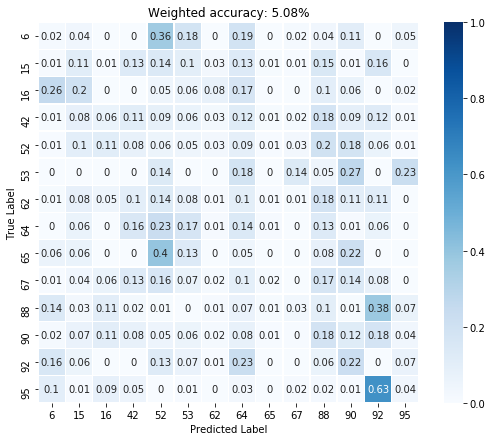

Training loss before training: 2.92650222778


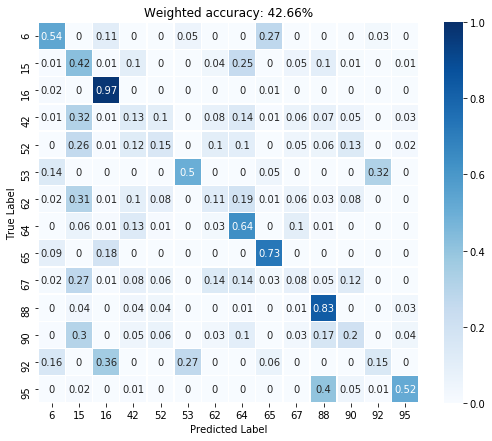

Training loss at epoch 100: 1.70426416397


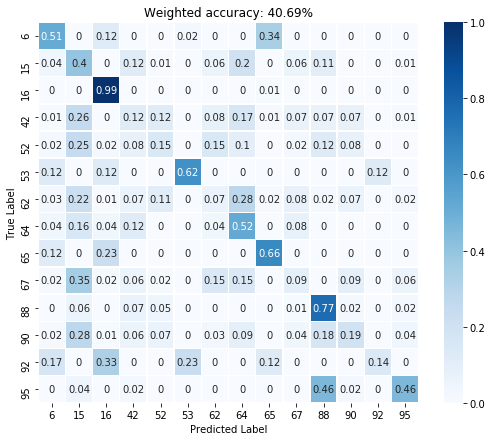

Dev loss at epoch 100: 1.69925355911


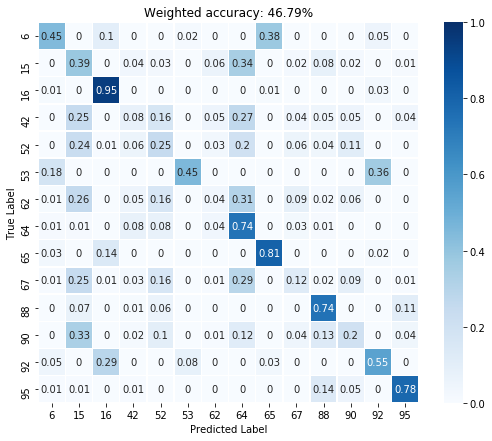

Training loss at epoch 200: 1.50936162472


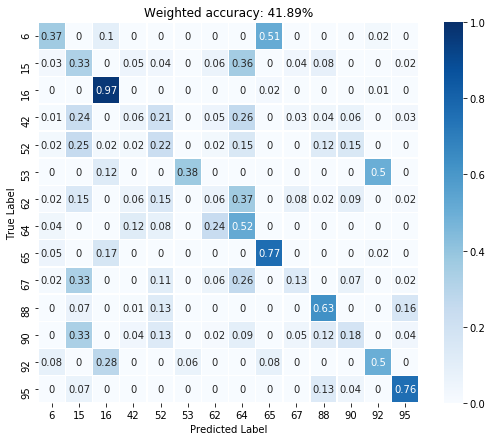

Dev loss at epoch 200: 1.5388764143


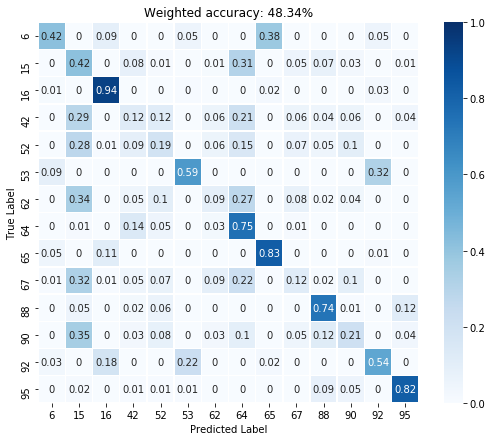

Training loss at epoch 300: 1.44145071507


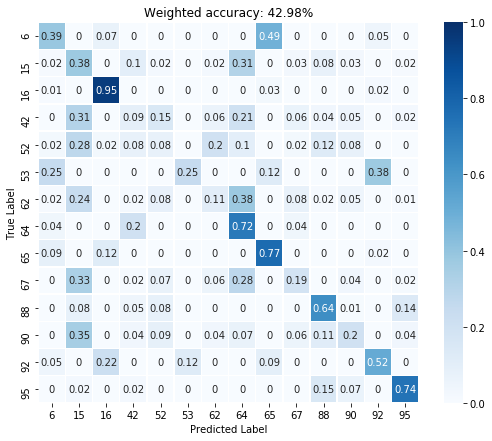

Dev loss at epoch 300: 1.53682363033


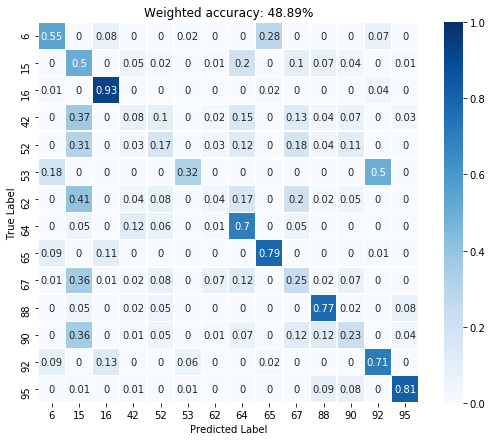

Training loss at epoch 400: 1.39900374413


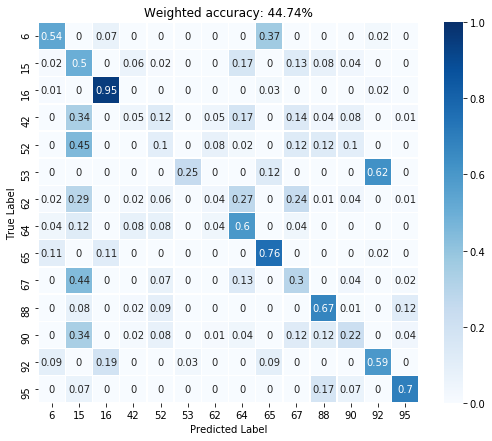

Dev loss at epoch 400: 1.44769537449


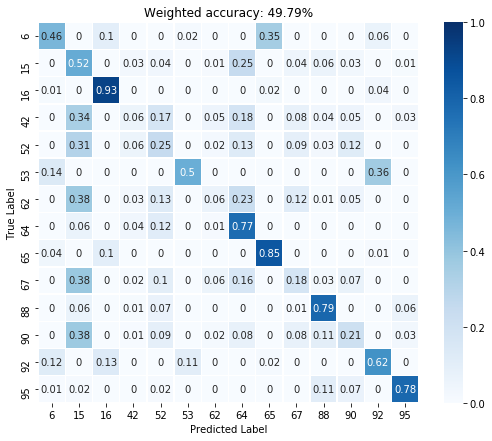

Training loss at epoch 500: 1.36370706558


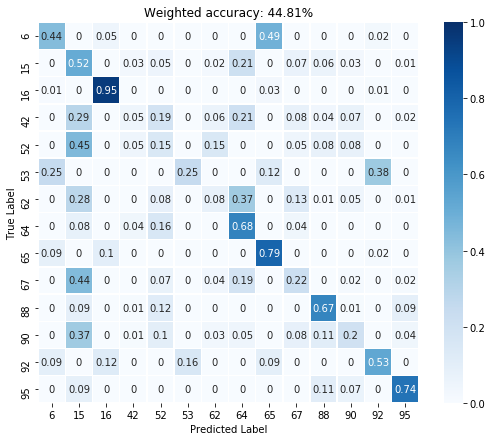

Dev loss at epoch 500: 1.40672874451


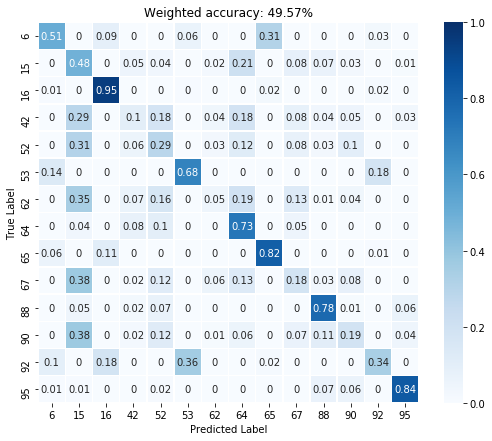

Training loss at epoch 600: 1.34094429016


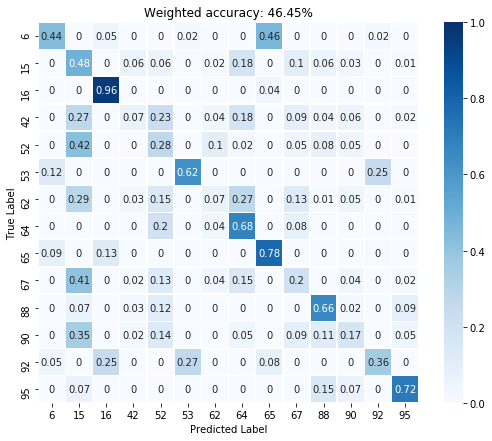

Dev loss at epoch 600: 1.41260313988


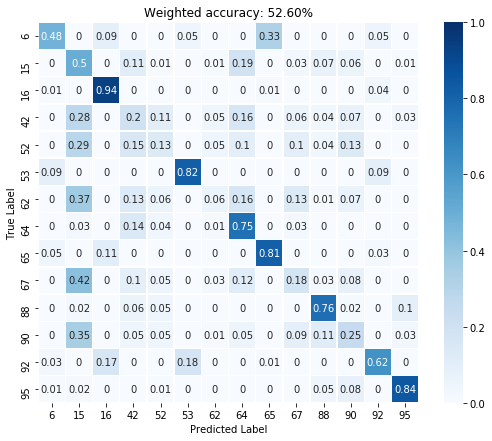

Training loss at epoch 700: 1.31715285778


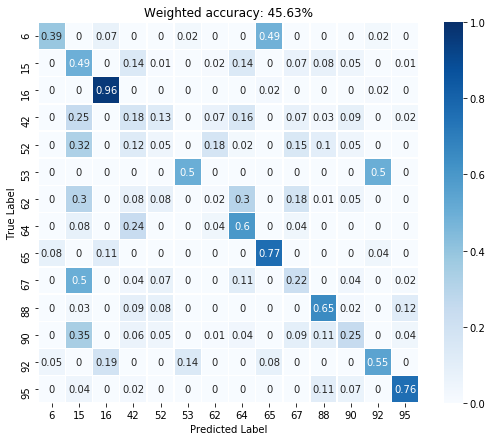

Dev loss at epoch 700: 1.36767184734


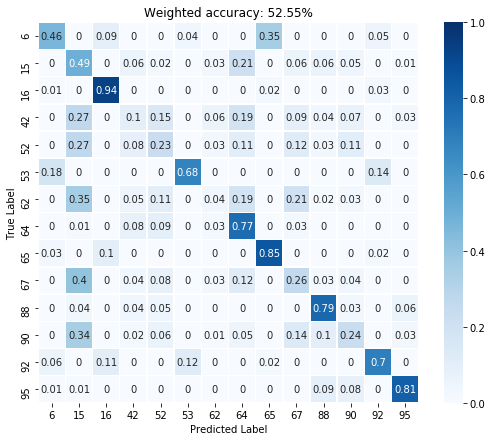

Training loss at epoch 800: 1.3049236536


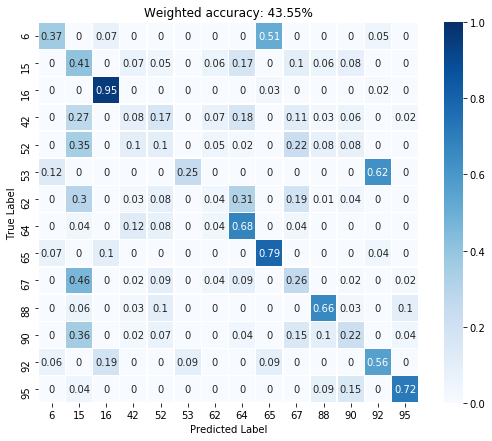

Dev loss at epoch 800: 1.37636041641


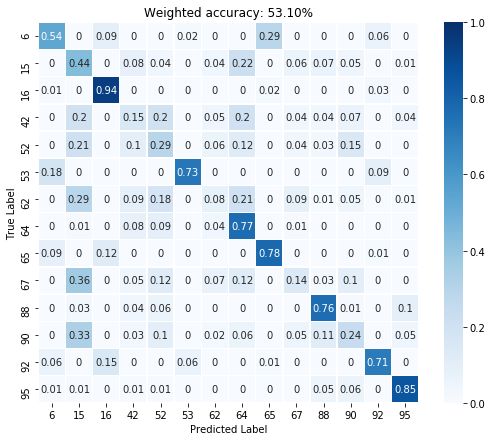

Training loss at epoch 900: 1.29378473759


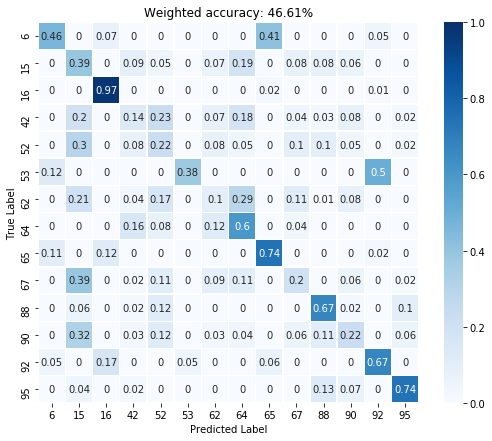

Dev loss at epoch 900: 1.36778080463


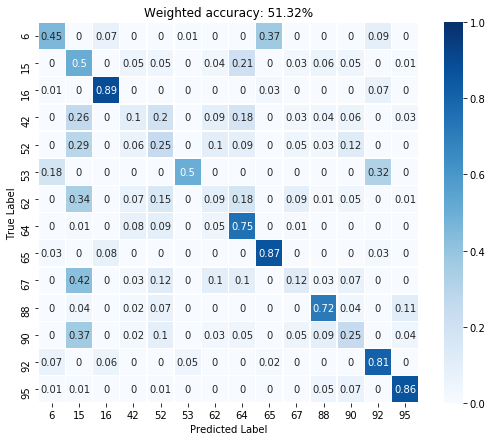

Training loss at epoch 1000: 1.29962360859


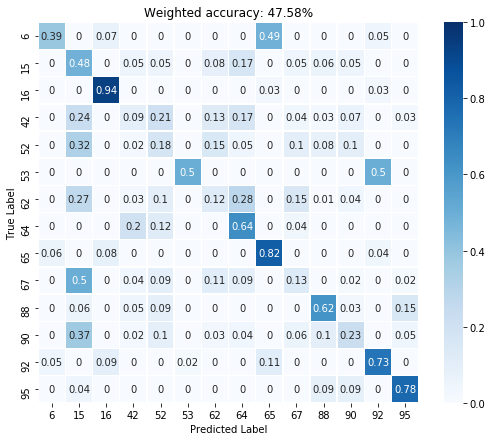

Dev loss at epoch 1000: 1.33322584629


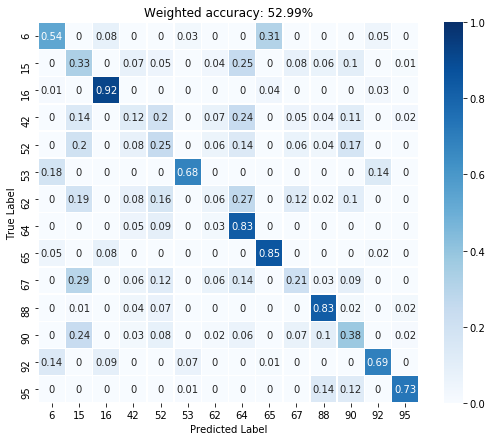

Training loss at epoch 1100: 1.28112053871


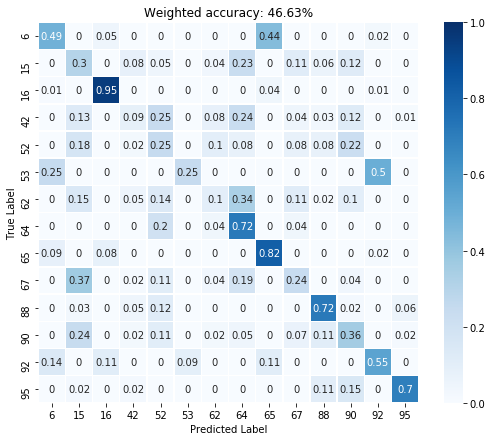

Dev loss at epoch 1100: 1.35709476471


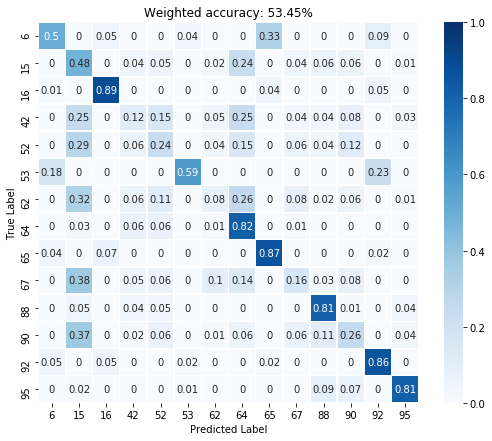

Training loss at epoch 1200: 1.28684329987


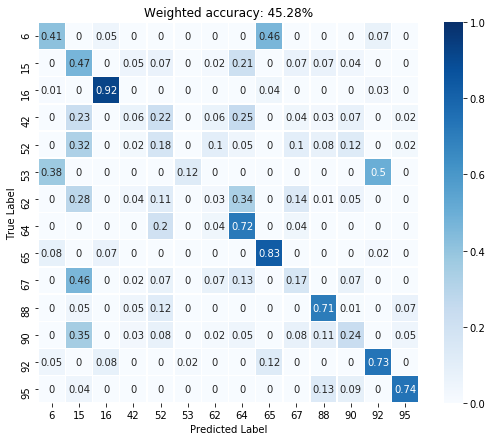

Dev loss at epoch 1200: 1.39719569683


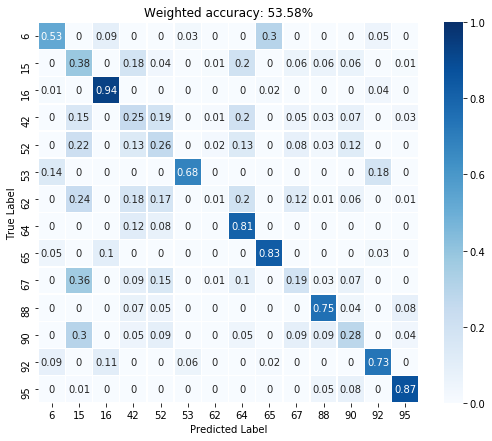

Training loss at epoch 1300: 1.2661460638


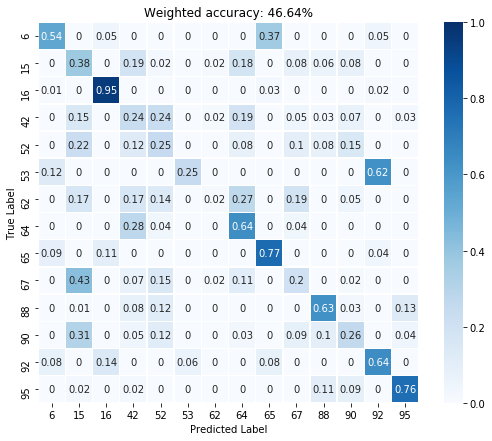

Dev loss at epoch 1300: 1.34579575062


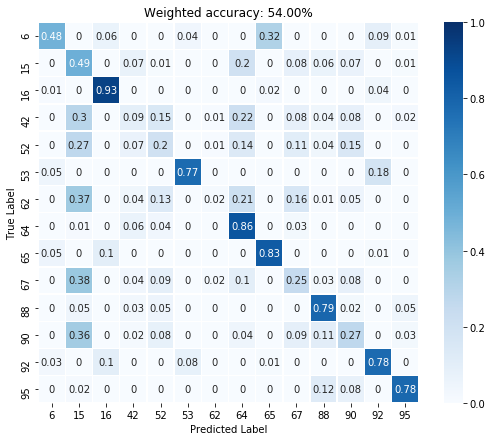

Training loss at epoch 1400: 1.26114761829


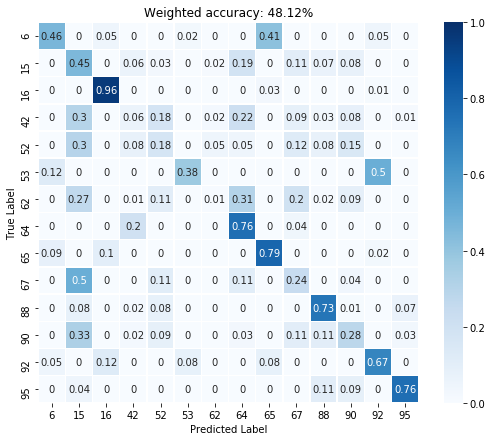

Dev loss at epoch 1400: 1.31061911583


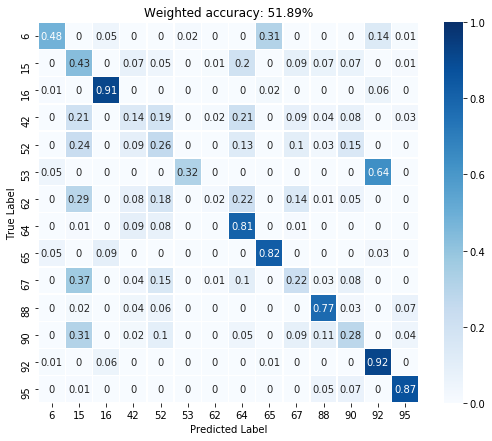

Training loss at epoch 1500: 1.27698373795


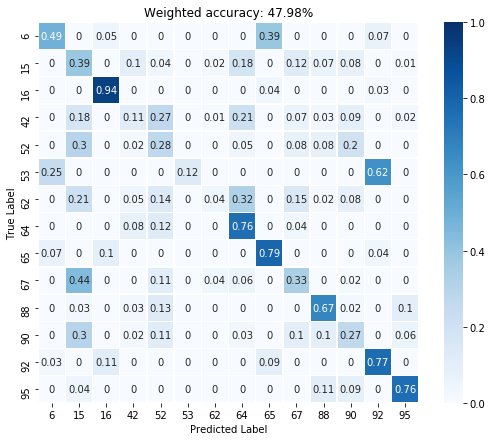

Dev loss at epoch 1500: 1.38232088089


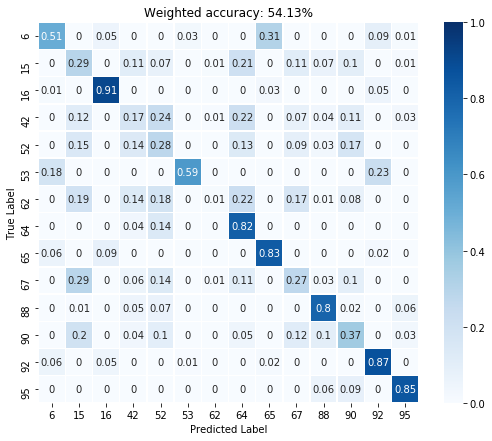

Training loss at epoch 1600: 1.26399242878


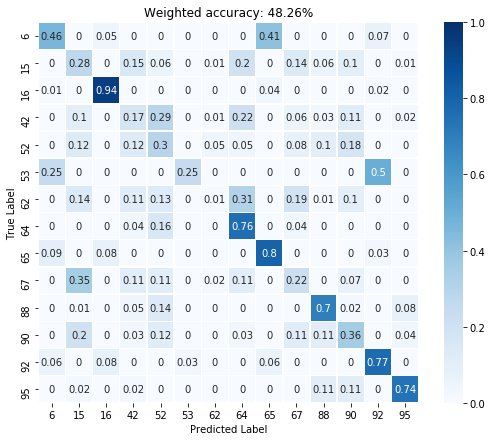

Dev loss at epoch 1600: 1.34983372688


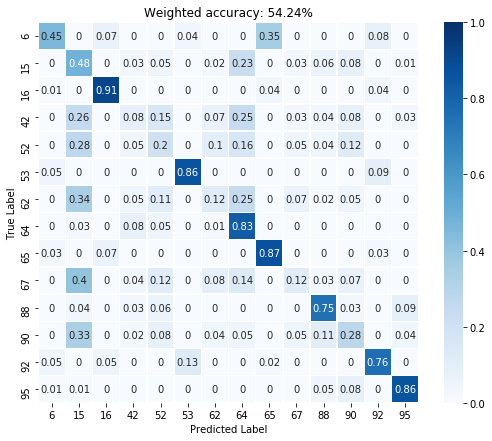

Training loss at epoch 1700: 1.2472704649


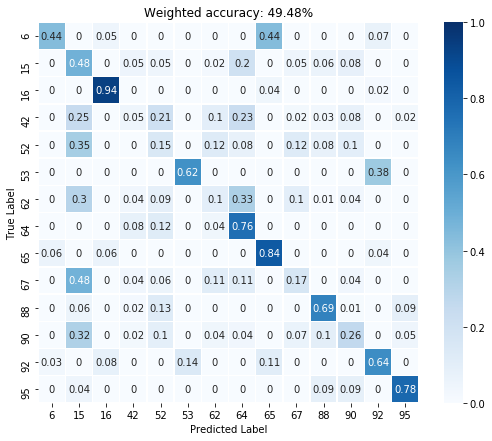

Dev loss at epoch 1700: 1.28480470181


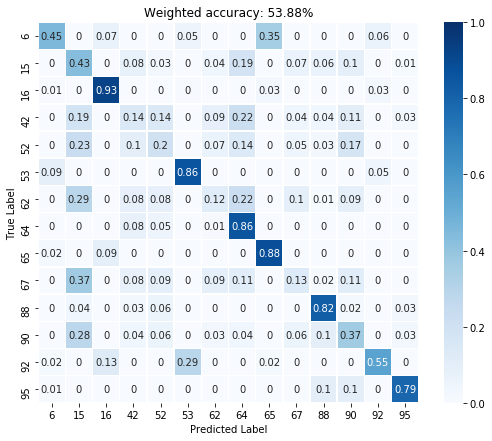

Training loss at epoch 1800: 1.24229323864


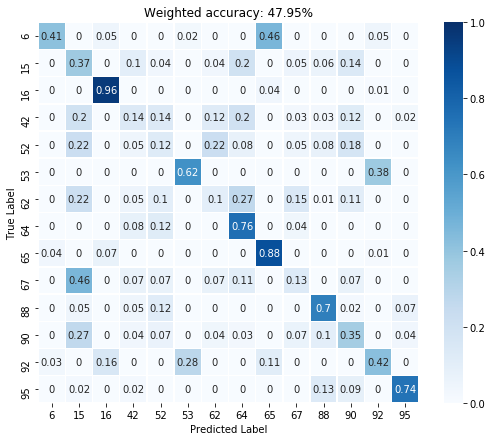

Dev loss at epoch 1800: 1.29598927498


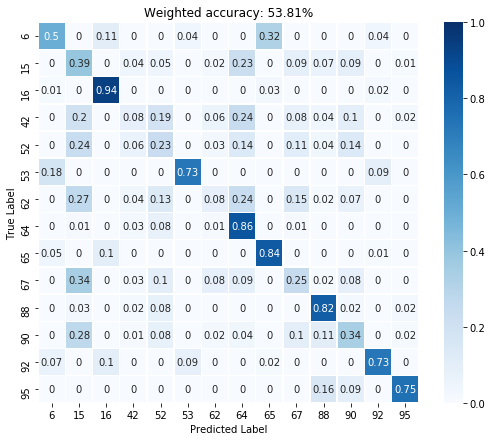

Training loss at epoch 1900: 1.23735058308


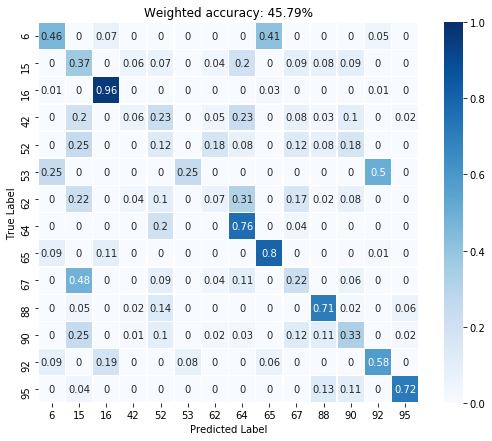

Dev loss at epoch 1900: 1.30678415298


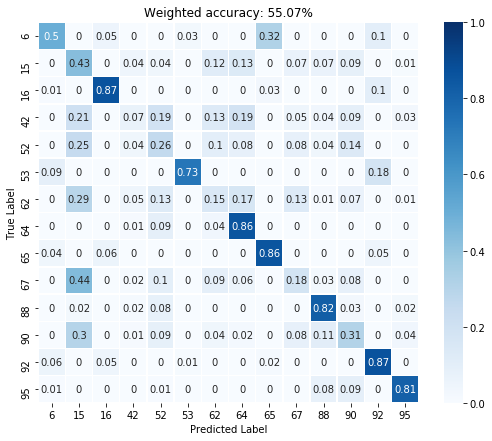

Training loss at epoch 2000: 1.23613679409


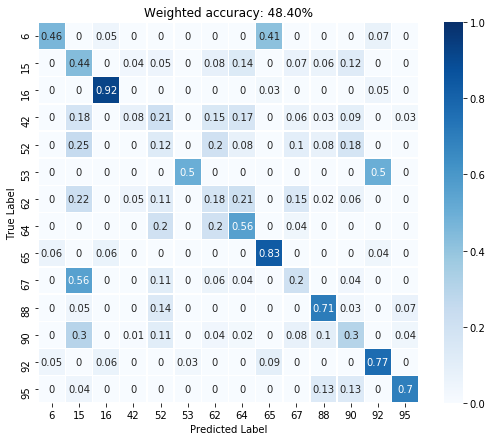

Dev loss at epoch 2000: 1.2925440073


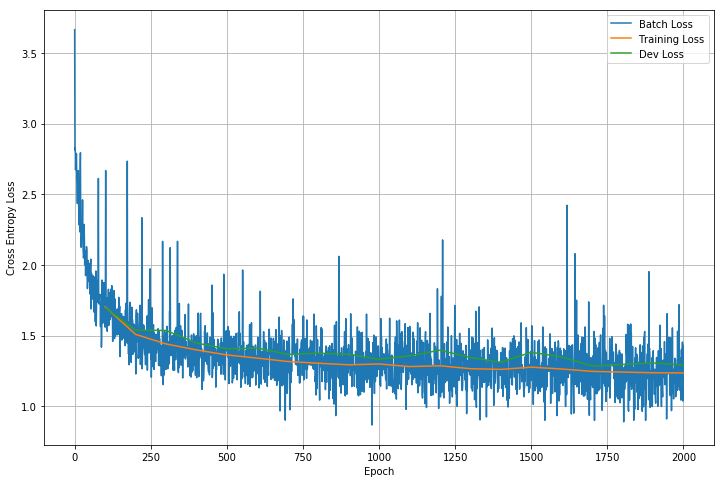

CPU times: user 50.6 s, sys: 2.19 s, total: 52.8 s
Wall time: 54.1 s


In [63]:
%%time
model = LogisticNet(X.shape[1], n_classes)
train_model(model)

### Big CNN

In [69]:
# https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py
class BigCNN(nn.Module):
    def __init__(self, n_passbands, n_classes):
        super(BigCNN, self).__init__()
                
        self.features = nn.Sequential(
            # size 352
            nn.Conv1d(n_passbands, 16, kernel_size=3, padding=1),
            nn.BatchNorm1d(16), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 176
            nn.Conv1d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 88
            nn.Conv1d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64), nn.ReLU(inplace=True),
            nn.Conv1d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 44
            nn.Conv1d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128), nn.ReLU(inplace=True),
            nn.Conv1d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 22
            nn.Conv1d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128), nn.ReLU(inplace=True),
            nn.Conv1d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 11
        )
        
        self.classifier = nn.Sequential(
            nn.Linear(128 * 11, 256),
            nn.ReLU(True),
            nn.Dropout(p=0.1),
            nn.Linear(256, 64),
            nn.ReLU(True),
            nn.Dropout(p=0.1),
            nn.Linear(64, n_classes),
        )

        self._initialize_weights()

    def forward(self, x):
        x, _ = x
        x = self.features(x)
        # reshape to (batch_size, num_flattened_features)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)

model = BigCNN(n_passbands, n_classes)
print_summary(model)

Number of trainable parameters: 572414
BigCNN(
  (features): Sequential(
    (0): Conv1d(6, 16, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv1d(16, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (5): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace)
    (7): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (9): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace)
    (11): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (12): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace)
    (14): MaxPool1d(kernel_size=

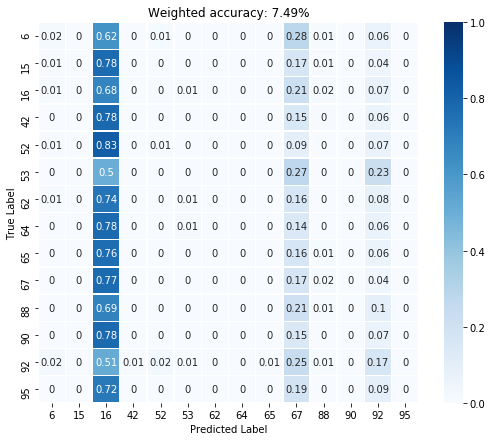

Training loss before training: 2.63885641098


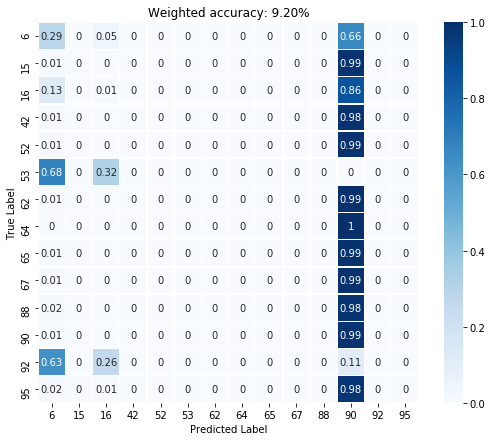

Training loss at epoch 10: 2.65766572952


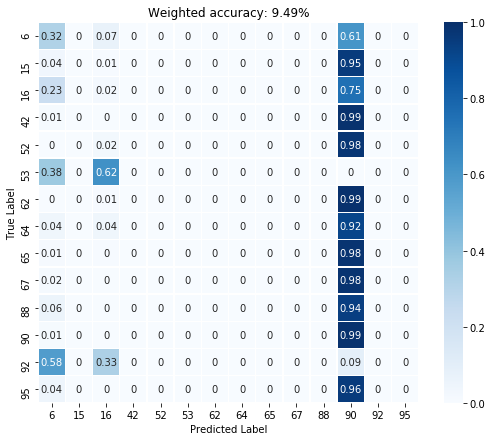

Dev loss at epoch 10: 3.00616312027


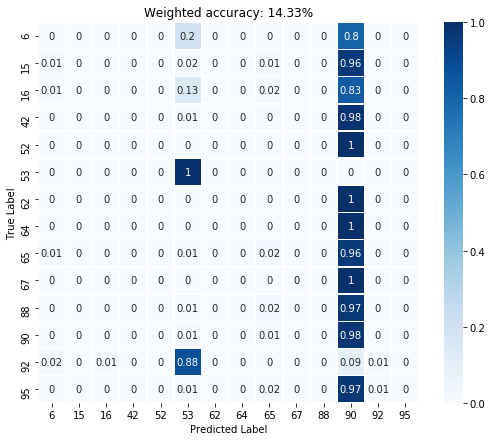

Training loss at epoch 20: 2.49520277977


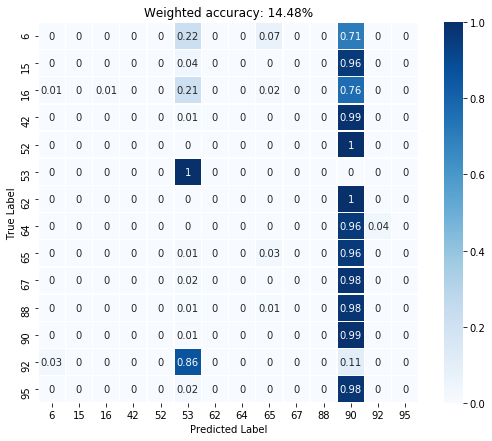

Dev loss at epoch 20: 2.45901155472


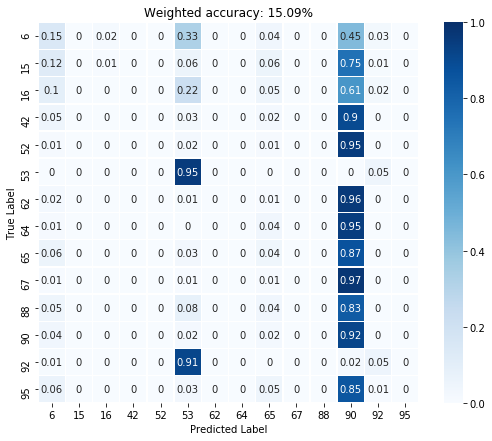

Training loss at epoch 30: 2.39774608612


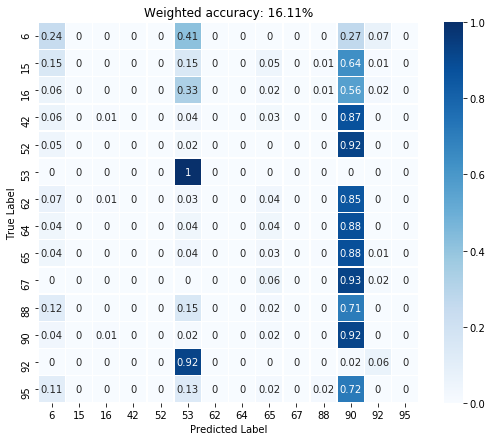

Dev loss at epoch 30: 2.3557946682


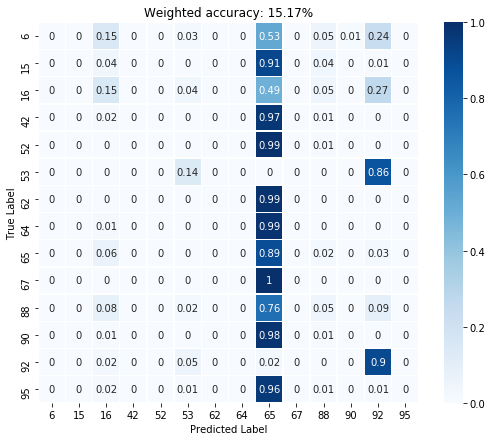

Training loss at epoch 40: 2.4038374424


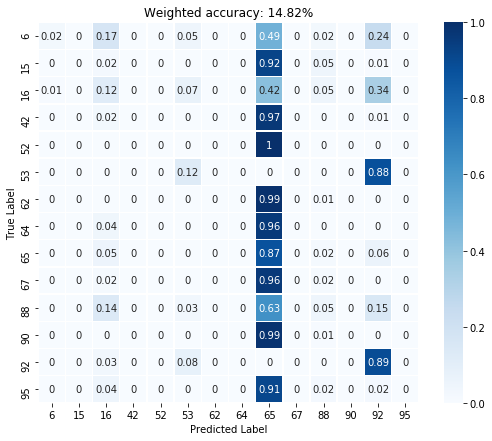

Dev loss at epoch 40: 2.39523649216


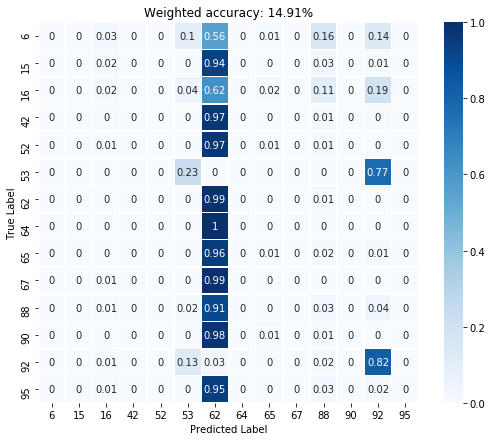

Training loss at epoch 50: 2.3730070591


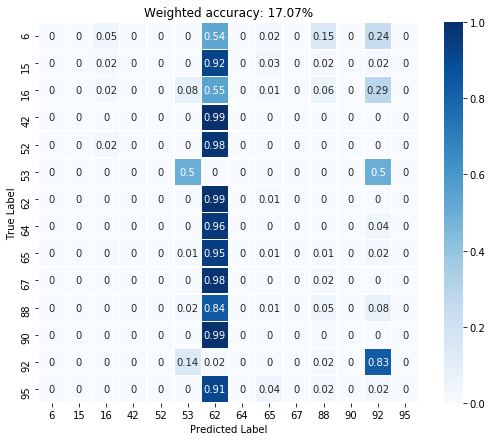

Dev loss at epoch 50: 2.31890487671


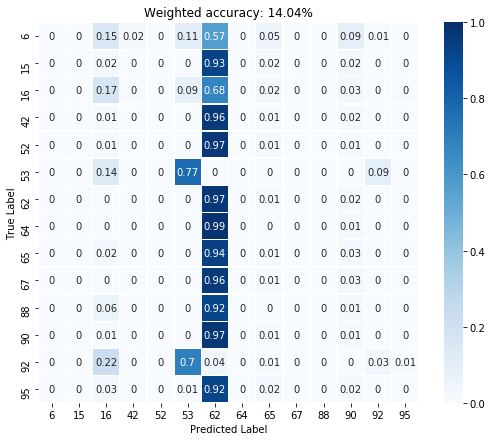

Training loss at epoch 60: 2.40306687355


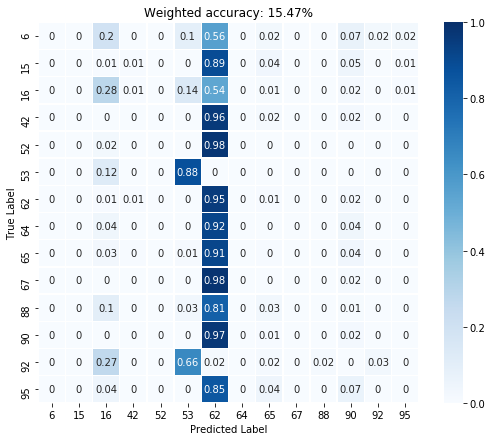

Dev loss at epoch 60: 2.3733124733


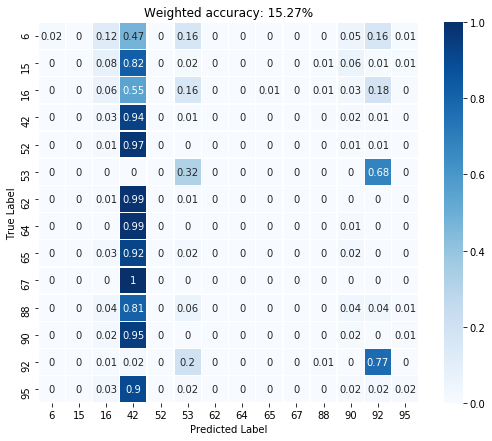

Training loss at epoch 70: 2.34043860435


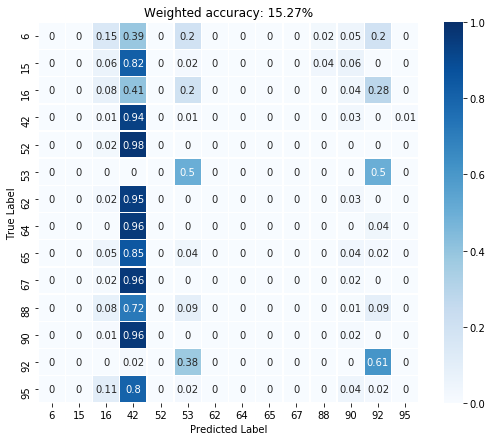

Dev loss at epoch 70: 2.29022240639


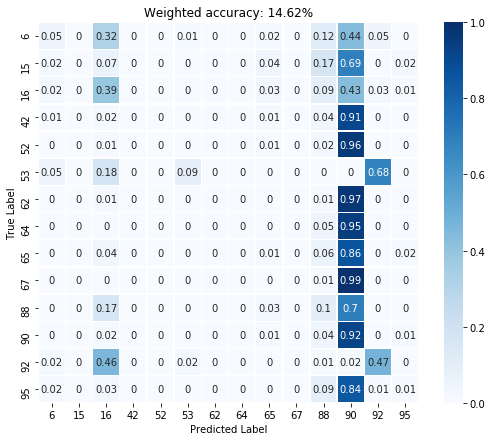

Training loss at epoch 80: 2.37371110916


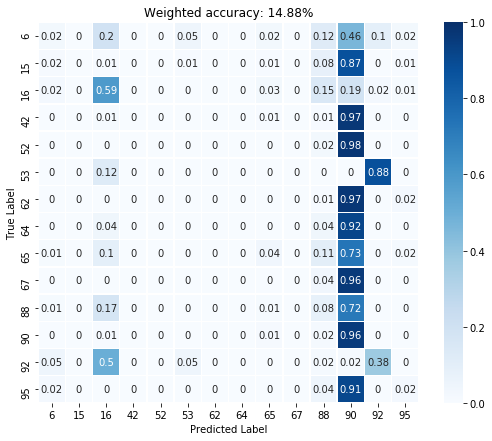

Dev loss at epoch 80: 2.38973522186


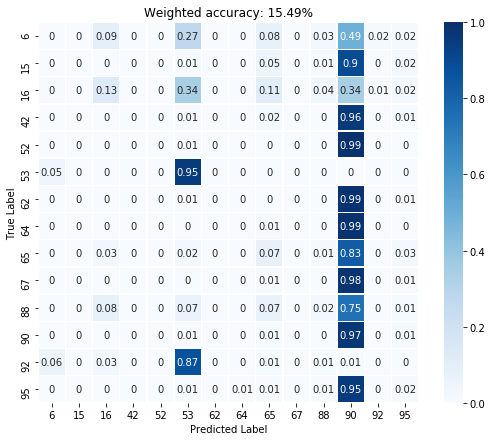

Training loss at epoch 90: 2.37605190277


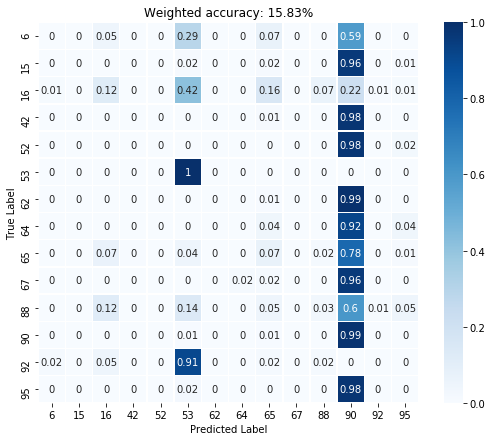

Dev loss at epoch 90: 2.30258965492


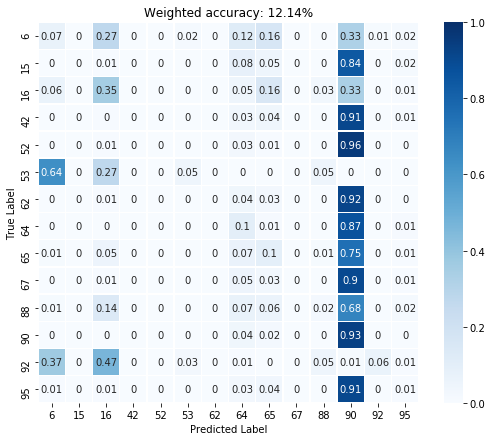

Training loss at epoch 100: 2.37090396881


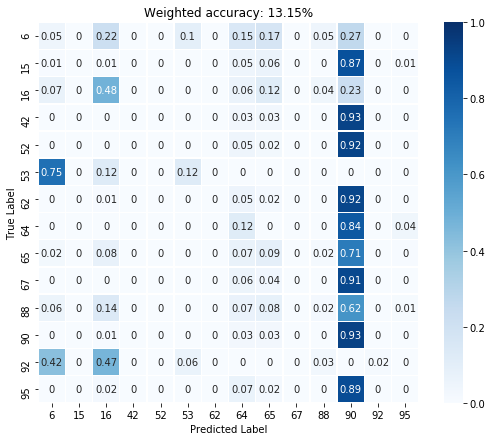

Dev loss at epoch 100: 2.33349132538


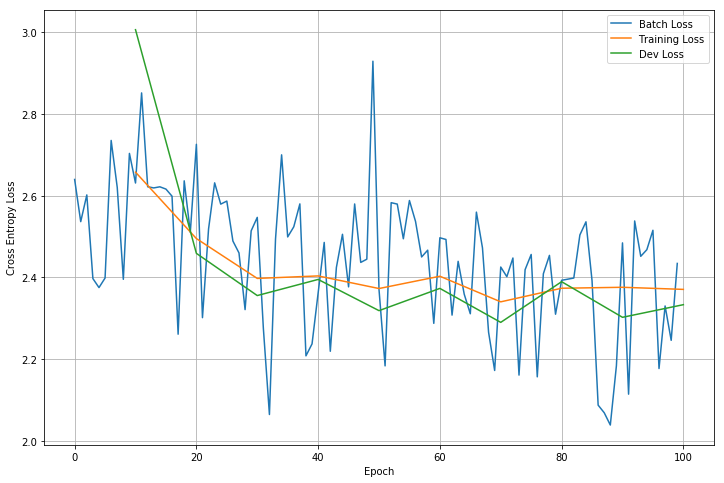

CPU times: user 4min 53s, sys: 35 s, total: 5min 28s
Wall time: 3min 34s


In [70]:
%%time
model = BigCNN(n_passbands, n_classes)
train_model(model, n_epochs=100, print_frequency=10)

### Small CNN

In [71]:
# https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py
class CNN(nn.Module):
    def __init__(self, n_passbands, n_classes):
        super(CNN, self).__init__()
                
        self.features = nn.Sequential(
            # size 352
            nn.Conv1d(n_passbands, 16, kernel_size=3, padding=1),
            nn.BatchNorm1d(16), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 176
            nn.Conv1d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 88
            nn.Conv1d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 44
            nn.Conv1d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 22
            nn.Conv1d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 11
        )
        
        self.classifier = nn.Sequential(
            nn.Linear(32*11, n_classes),
        )

        self._initialize_weights()

    def forward(self, x):
        x, _ = x
        x = self.features(x)
        # reshape to (batch_size, num_flattened_features)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)
                
model = CNN(n_passbands, n_classes)
print_summary(model)

Number of trainable parameters: 16414
CNN(
  (features): Sequential(
    (0): Conv1d(6, 16, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv1d(16, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (5): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace)
    (7): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv1d(32, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (9): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace)
    (11): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv1d(32, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (13): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, t

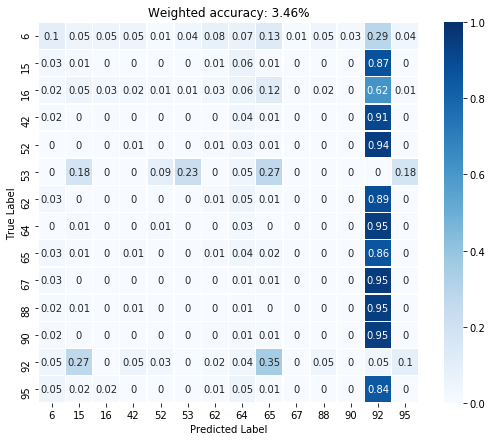

Training loss before training: 2.64382529259


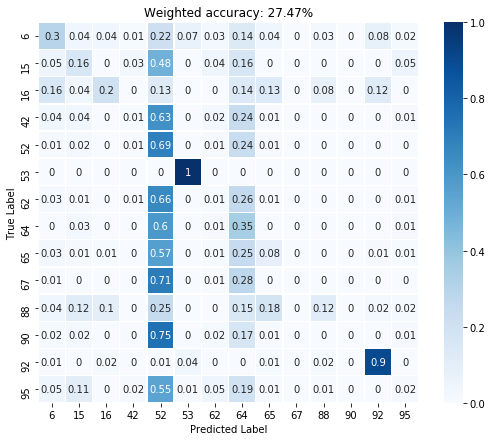

Training loss at epoch 100: 2.05014276505


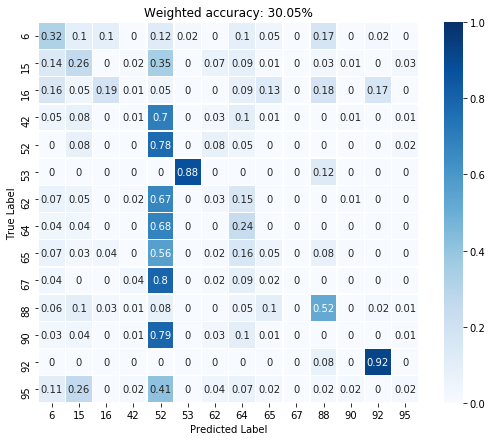

Dev loss at epoch 100: 1.95010006428


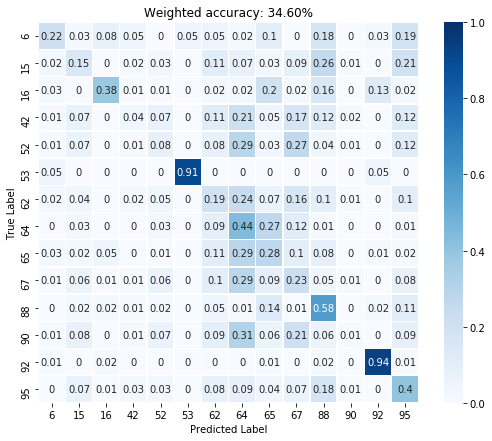

Training loss at epoch 200: 1.9618076086


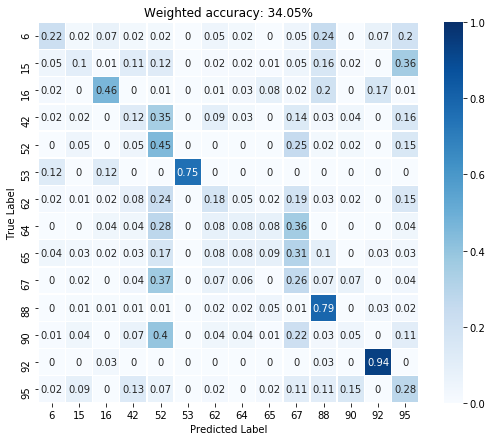

Dev loss at epoch 200: 1.86644864082


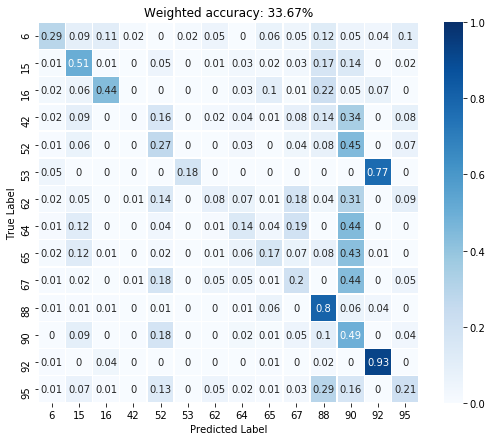

Training loss at epoch 300: 1.96466803551


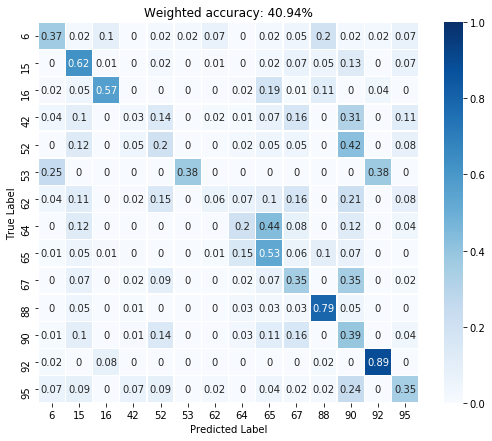

Dev loss at epoch 300: 1.81288337708


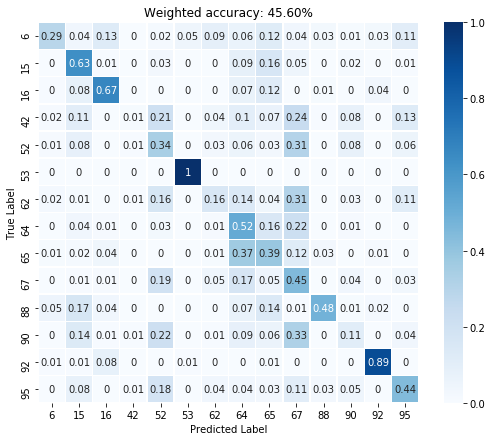

Training loss at epoch 400: 1.59474182129


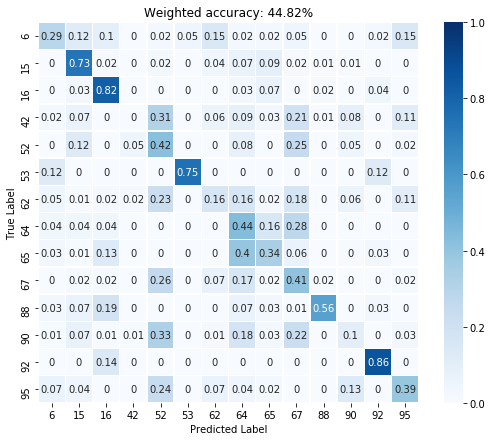

Dev loss at epoch 400: 1.64452064037


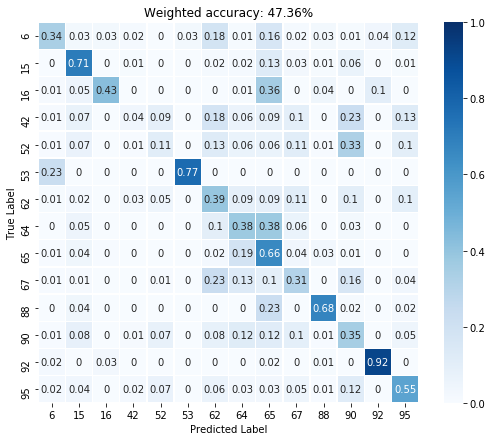

Training loss at epoch 500: 1.50577521324


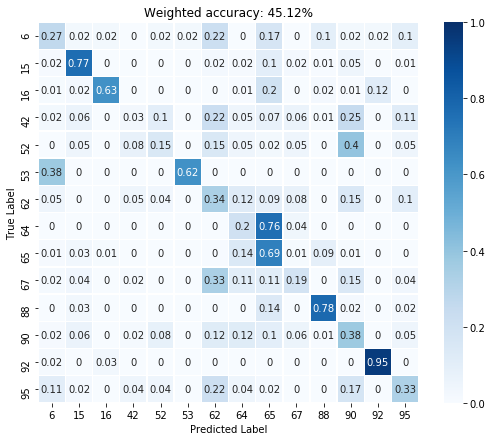

Dev loss at epoch 500: 1.57338607311


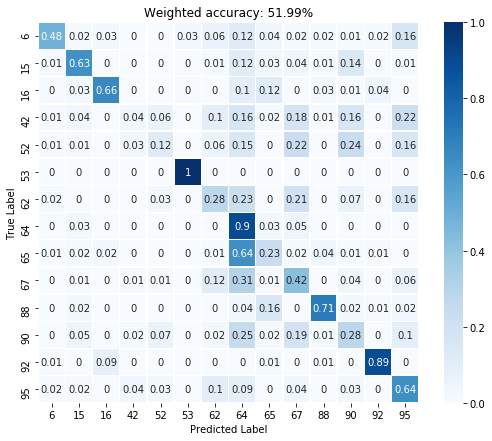

Training loss at epoch 600: 1.37229204178


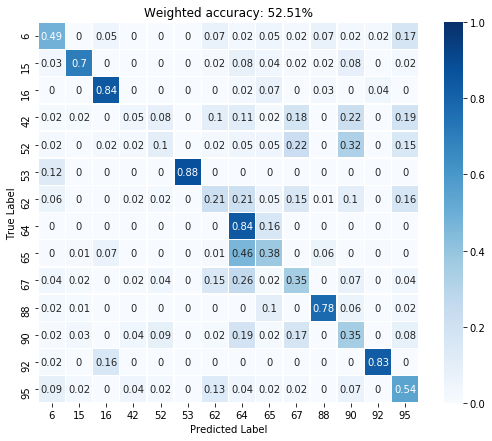

Dev loss at epoch 600: 1.38331639767


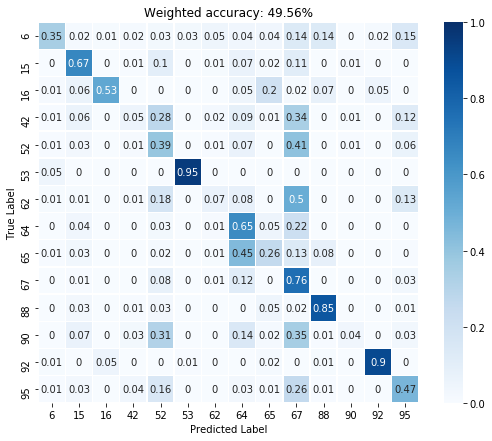

Training loss at epoch 700: 1.44481527805


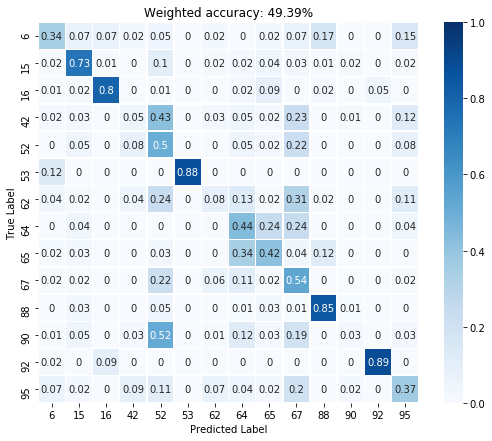

Dev loss at epoch 700: 1.43544411659


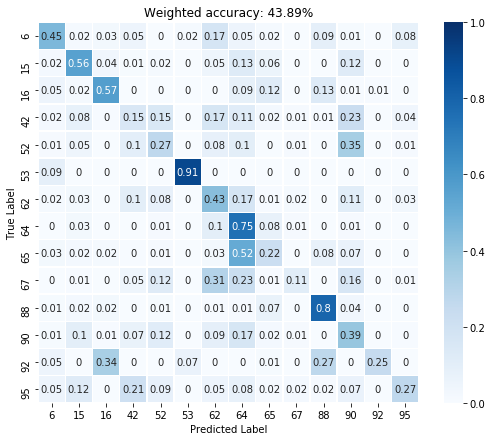

Training loss at epoch 800: 1.64095664024


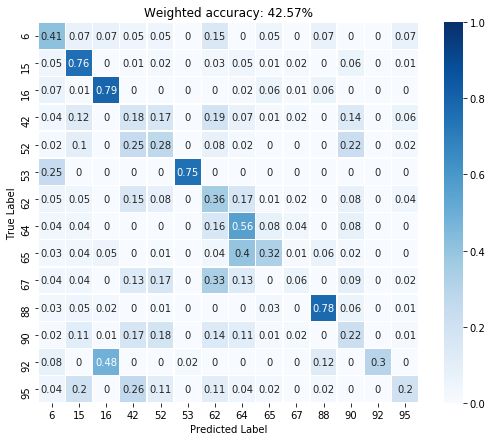

Dev loss at epoch 800: 1.67793011665


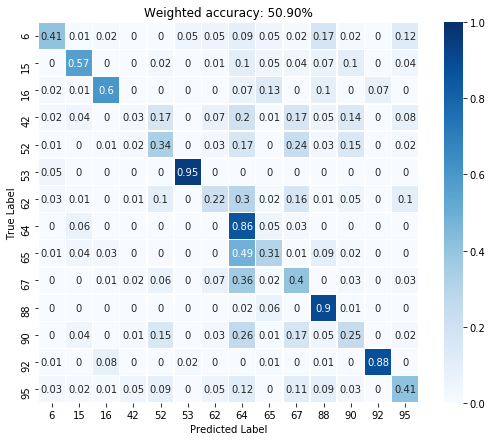

Training loss at epoch 900: 1.41715335846


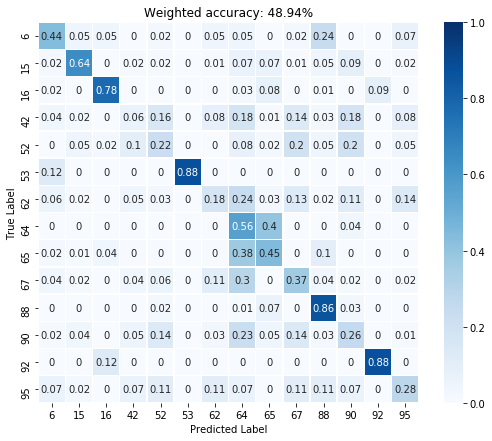

Dev loss at epoch 900: 1.44171476364


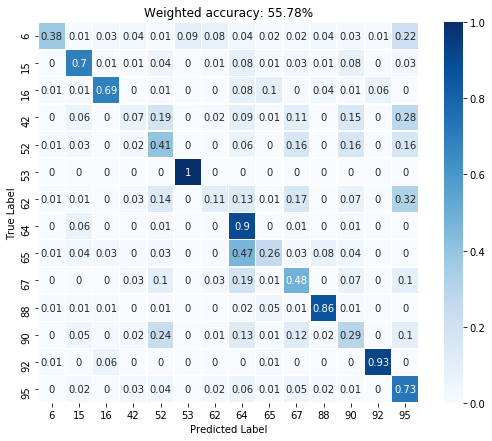

Training loss at epoch 1000: 1.3436216116


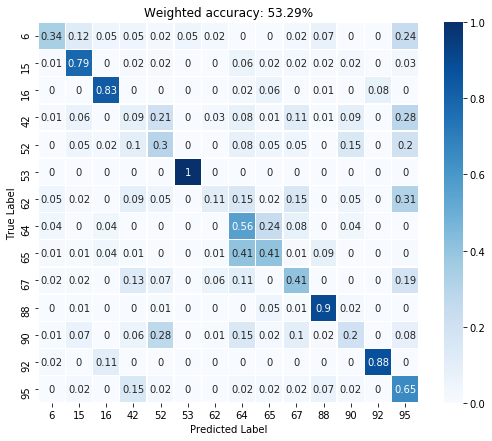

Dev loss at epoch 1000: 1.37050676346


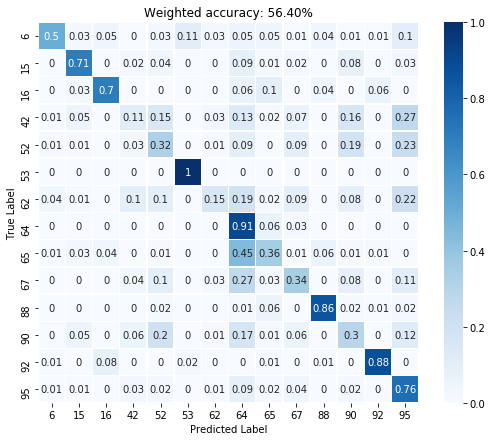

Training loss at epoch 1100: 1.26053380966


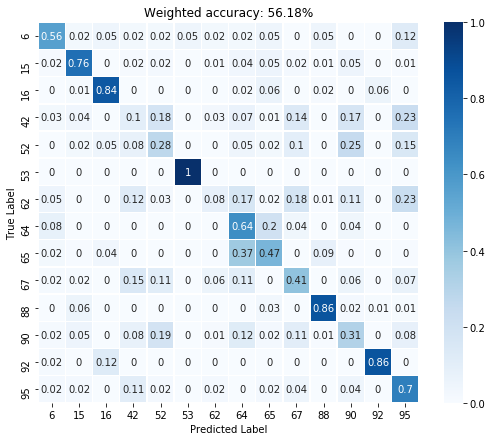

Dev loss at epoch 1100: 1.28771829605


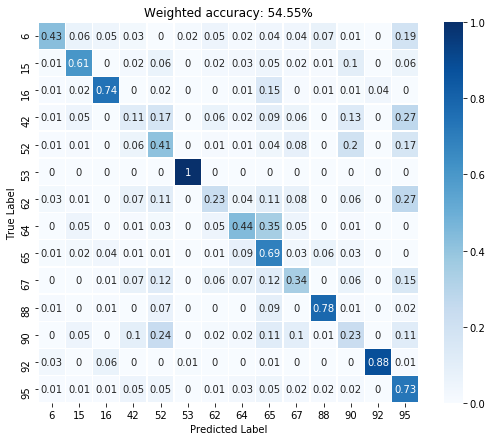

Training loss at epoch 1200: 1.36231565475


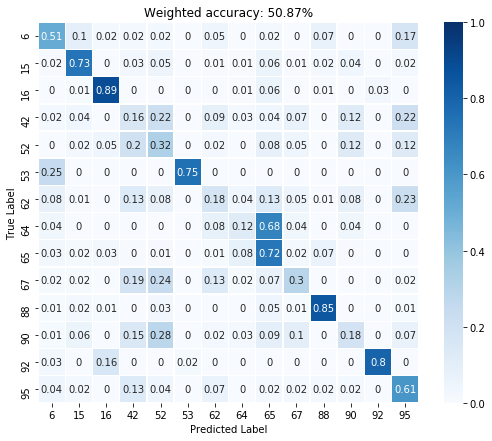

Dev loss at epoch 1200: 1.39224517345


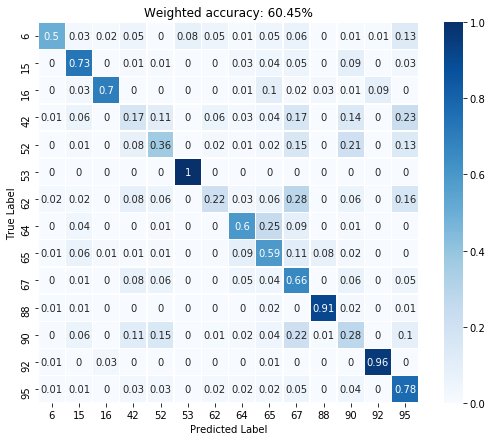

Training loss at epoch 1300: 1.14515459538


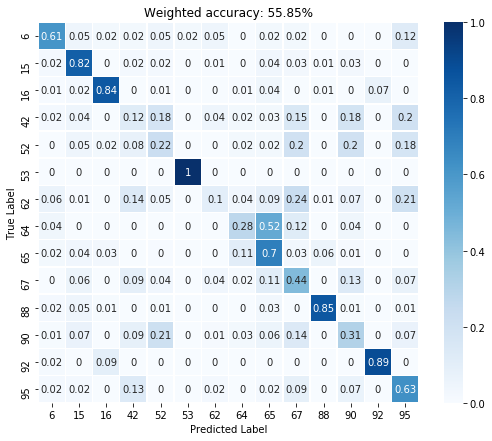

Dev loss at epoch 1300: 1.33115530014


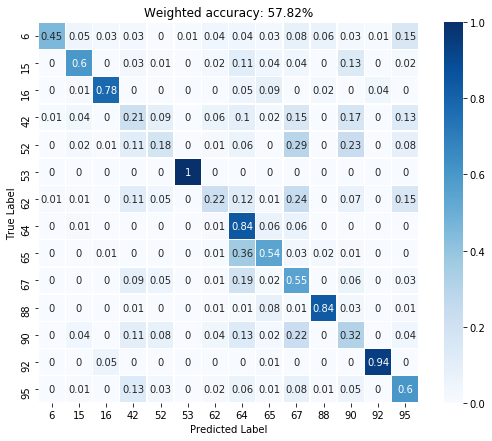

Training loss at epoch 1400: 1.22305464745


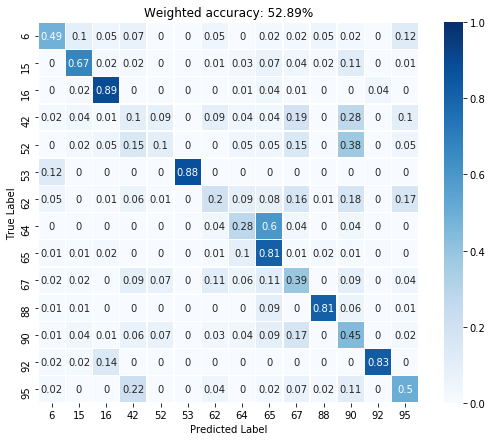

Dev loss at epoch 1400: 1.43668580055


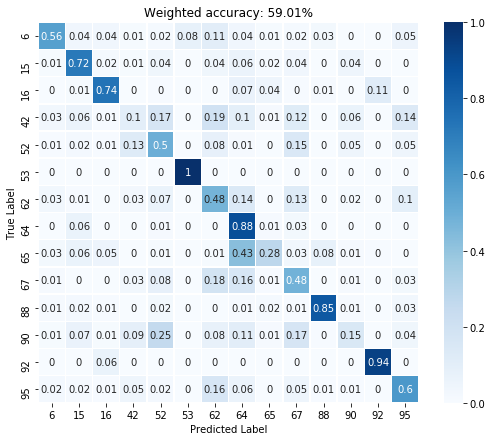

Training loss at epoch 1500: 1.20769965649


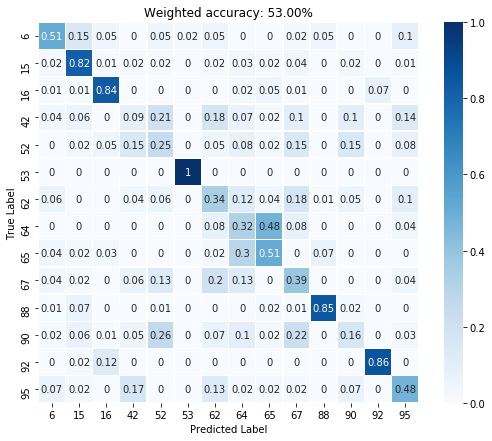

Dev loss at epoch 1500: 1.37435805798


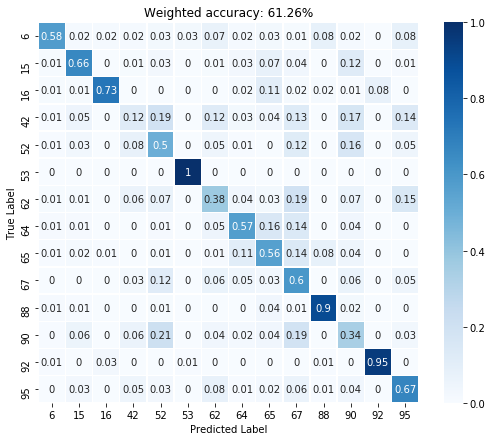

Training loss at epoch 1600: 1.12957262993


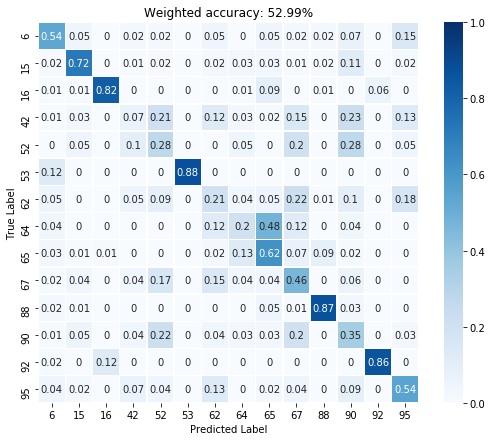

Dev loss at epoch 1600: 1.29685711861


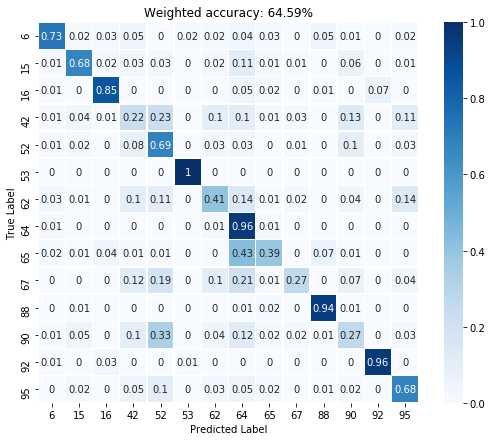

Training loss at epoch 1700: 1.02602171898


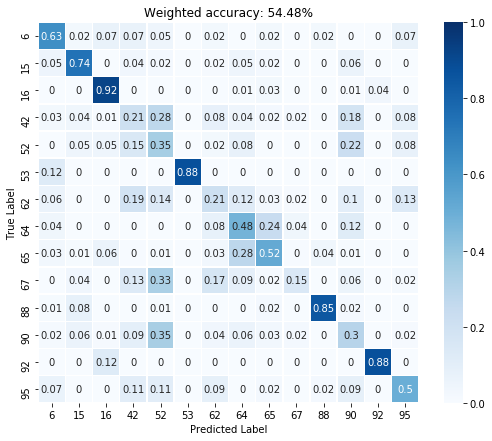

Dev loss at epoch 1700: 1.36307704449


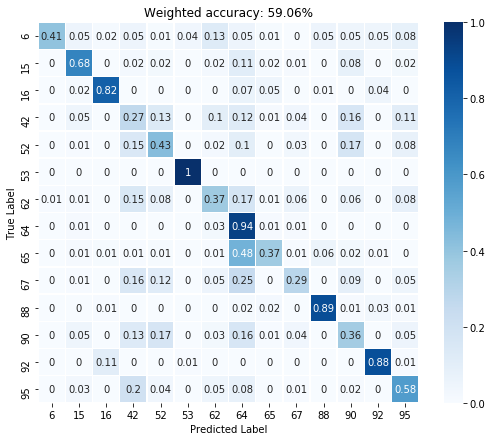

Training loss at epoch 1800: 1.12341153622


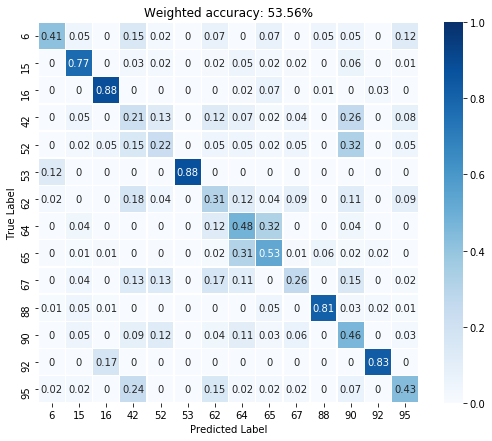

Dev loss at epoch 1800: 1.42762517929


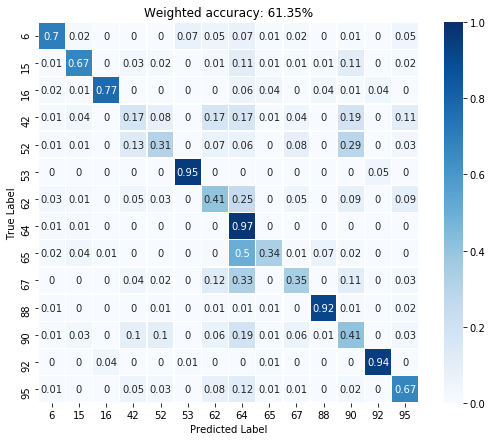

Training loss at epoch 1900: 1.1322876215


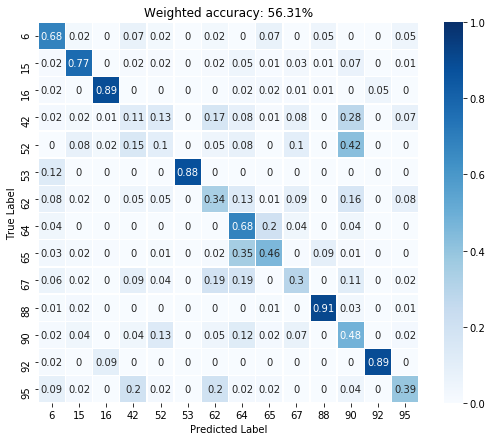

Dev loss at epoch 1900: 1.31229031086


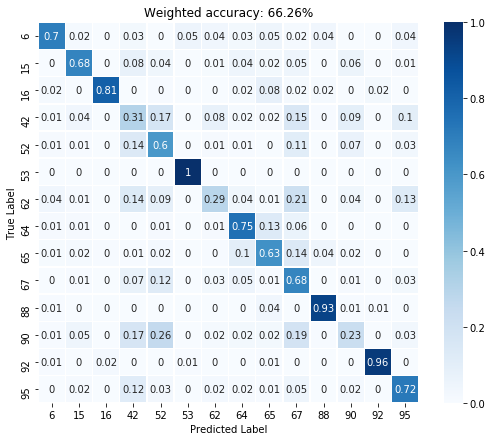

Training loss at epoch 2000: 0.991705358028


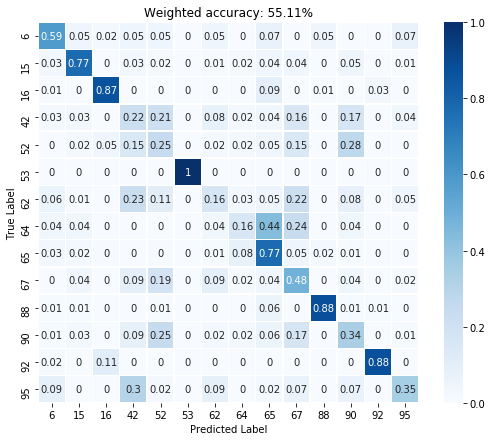

Dev loss at epoch 2000: 1.34720253944


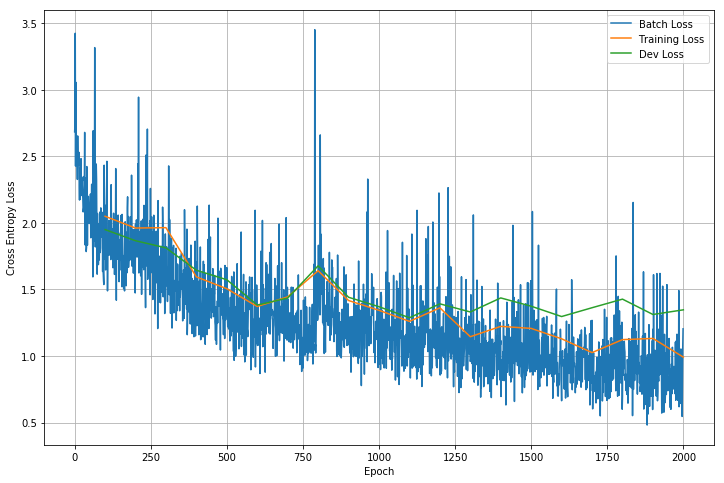

CPU times: user 13min 33s, sys: 1min 18s, total: 14min 51s
Wall time: 7min 25s


In [72]:
%%time
model = CNN(n_passbands, n_classes)
train_model(model)

#### Hyperparam tuning

Training with learning rate: 1e-06


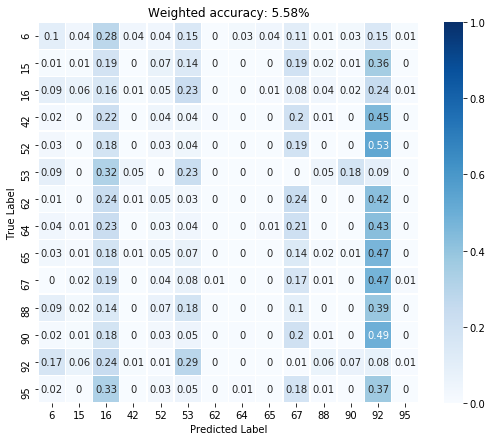

Training loss before training: 2.62325191498


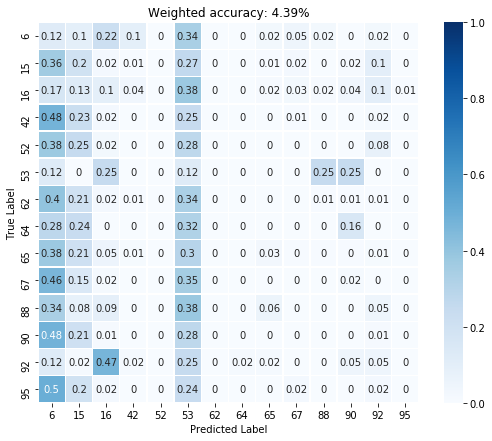

Dev loss before training: 2.6297082901


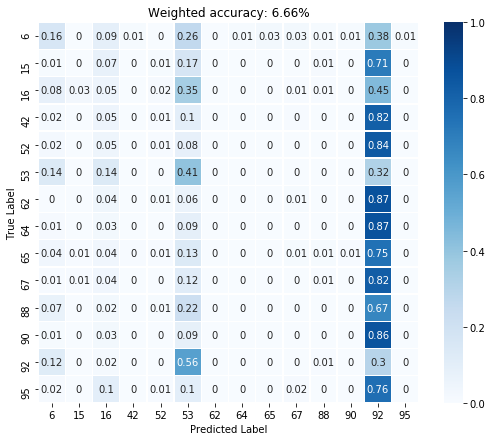

Training loss at epoch 1000: 2.59677290916


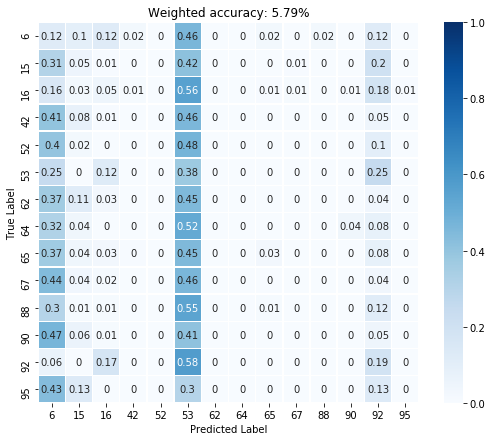

Dev loss at epoch 1000: 2.58045887947


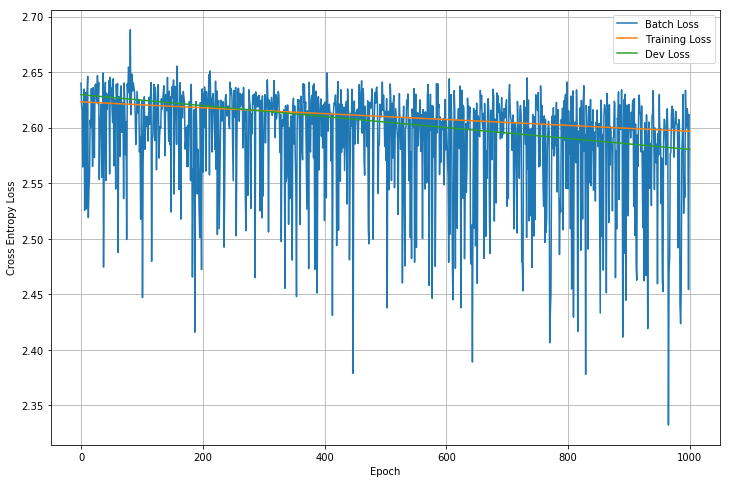

Training with learning rate: 1e-05


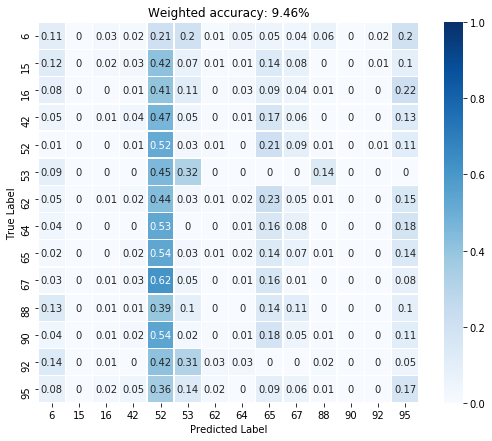

Training loss before training: 2.63485336304


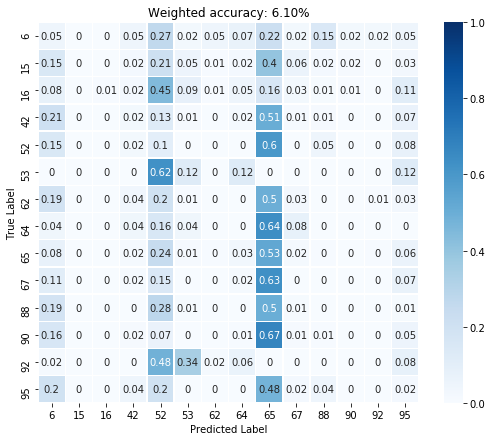

Dev loss before training: 2.63346552849


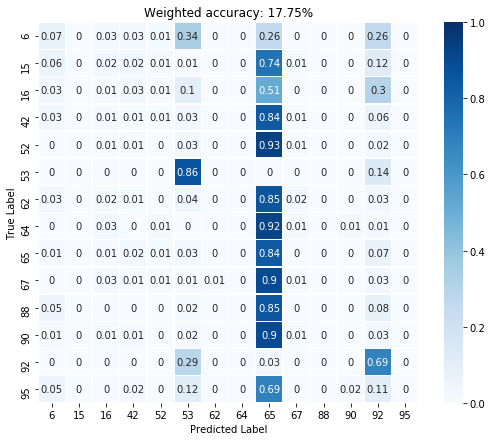

Training loss at epoch 1000: 2.54202103615


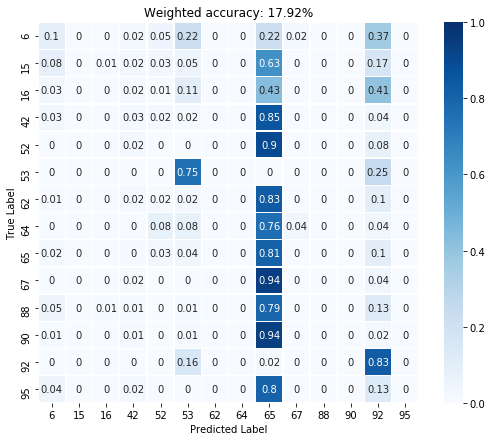

Dev loss at epoch 1000: 2.43286919594


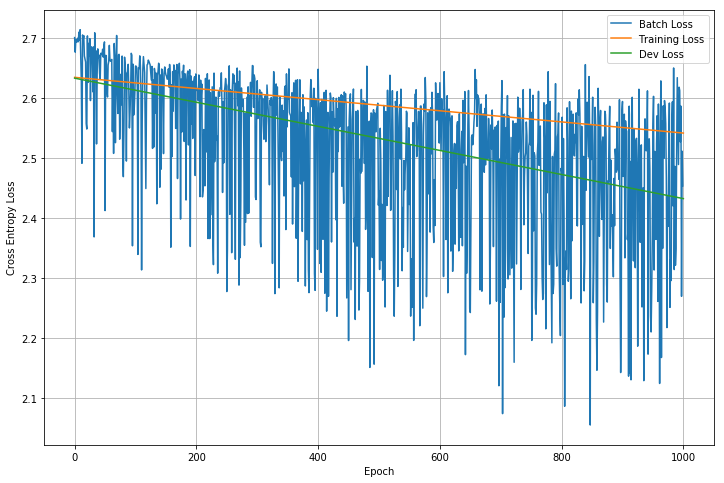

Training with learning rate: 0.0001


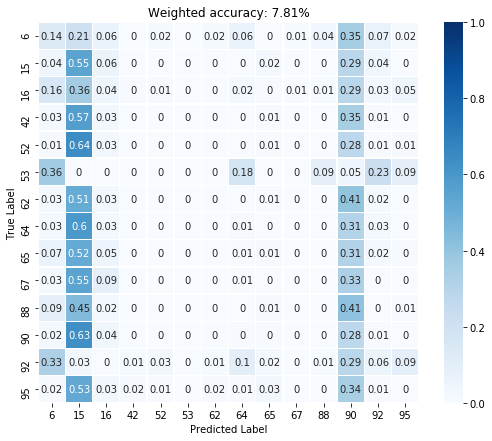

Training loss before training: 2.66035580635


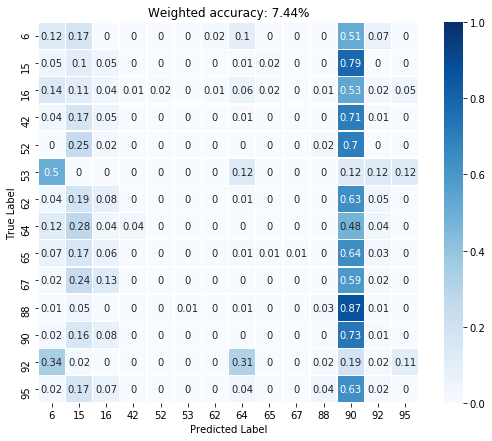

Dev loss before training: 2.66442799568


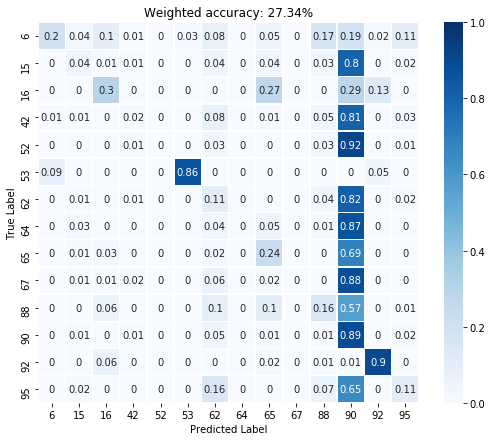

Training loss at epoch 1000: 2.14985752106


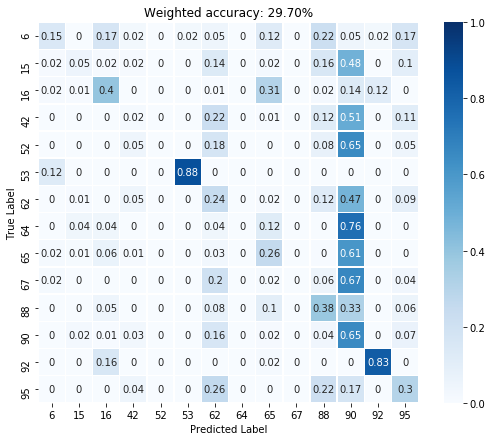

Dev loss at epoch 1000: 2.1137714386


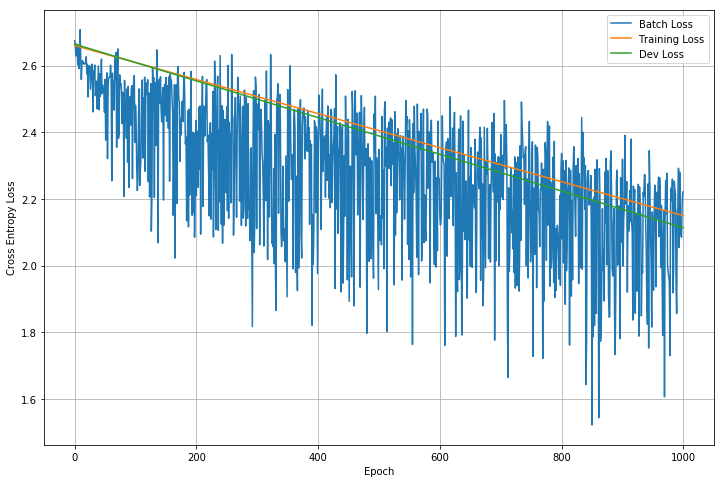

Training with learning rate: 0.001


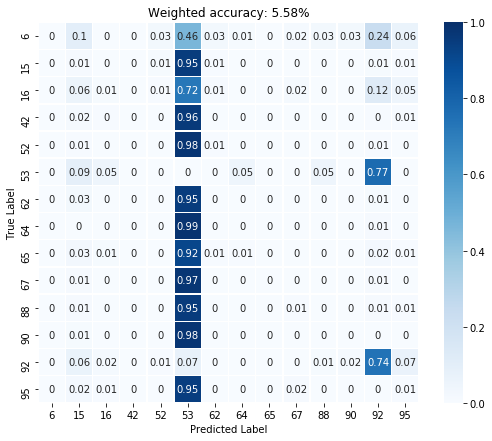

Training loss before training: 2.64400649071


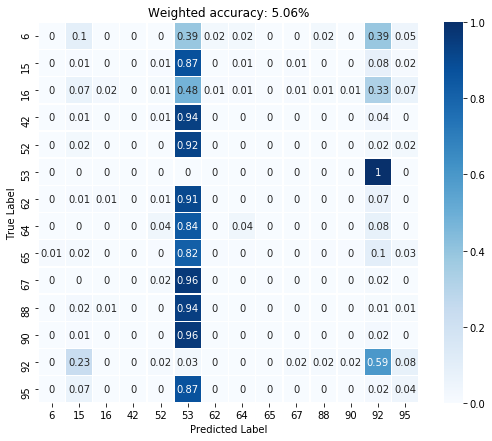

Dev loss before training: 2.67164063454


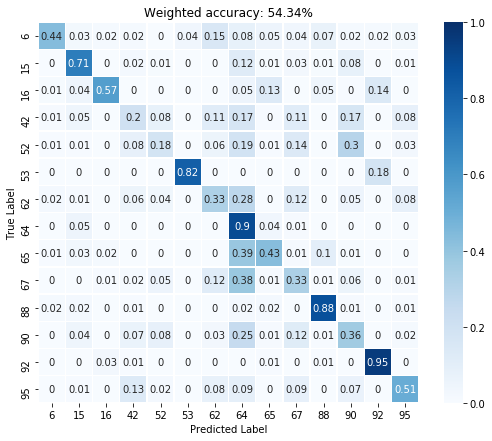

Training loss at epoch 1000: 1.3572729826


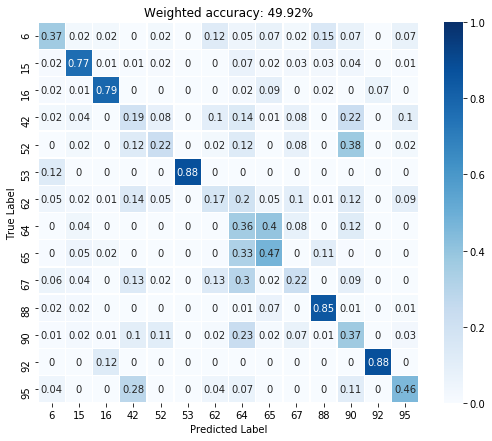

Dev loss at epoch 1000: 1.33427560329


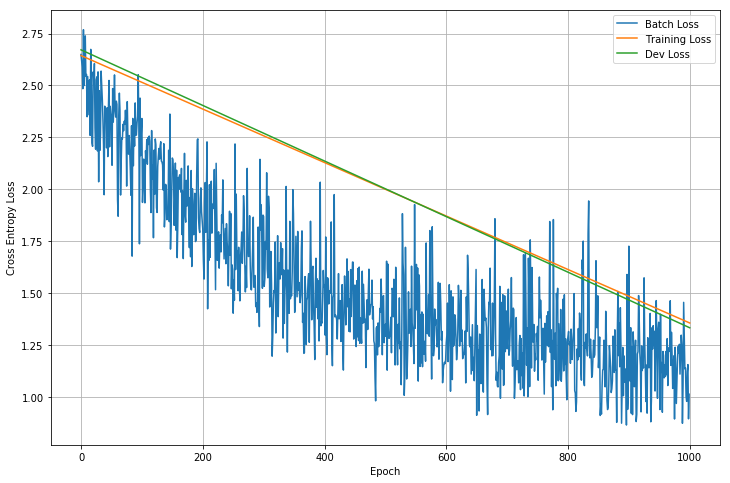

Training with learning rate: 0.01


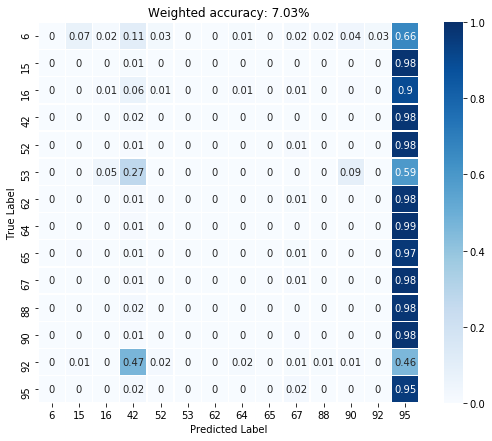

Training loss before training: 2.67612862587


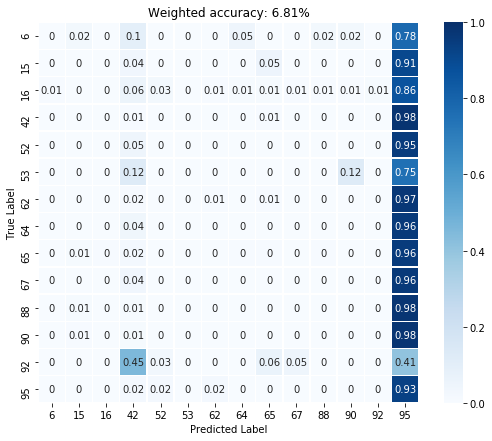

Dev loss before training: 2.69362998009


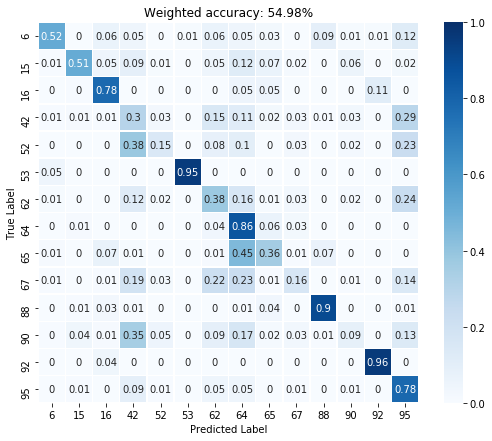

Training loss at epoch 1000: 1.27105772495


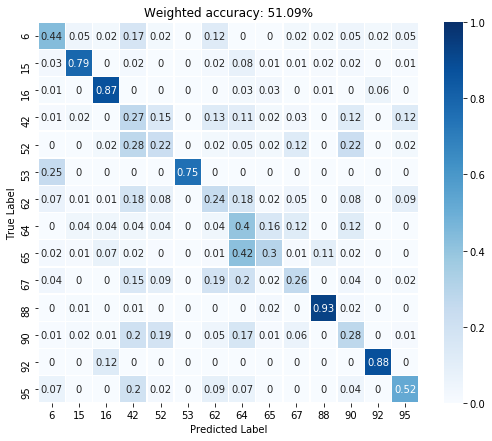

Dev loss at epoch 1000: 1.37660944462


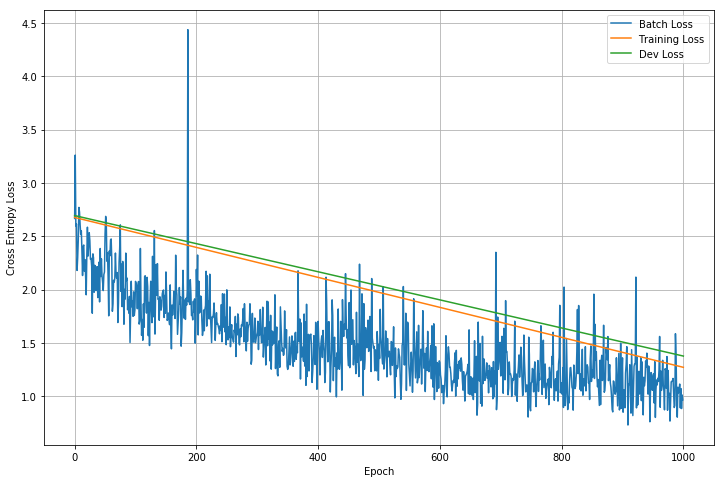

Training with learning rate: 0.1


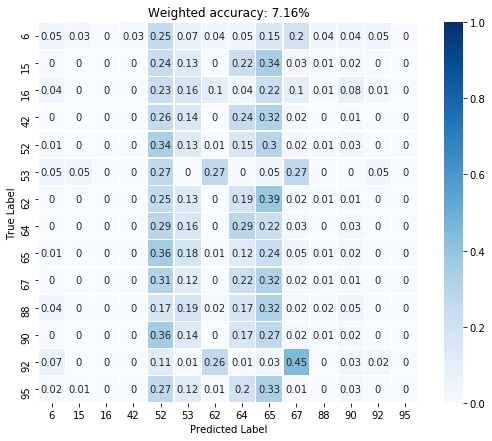

Training loss before training: 2.6470117569


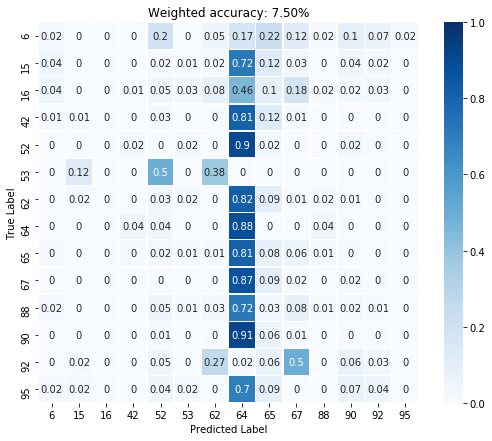

Dev loss before training: 2.75185680389


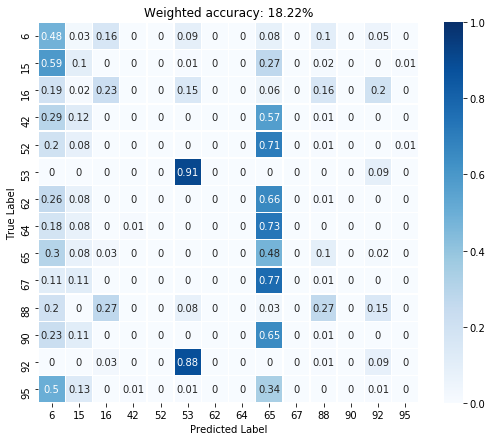

Training loss at epoch 1000: 2.1437702179


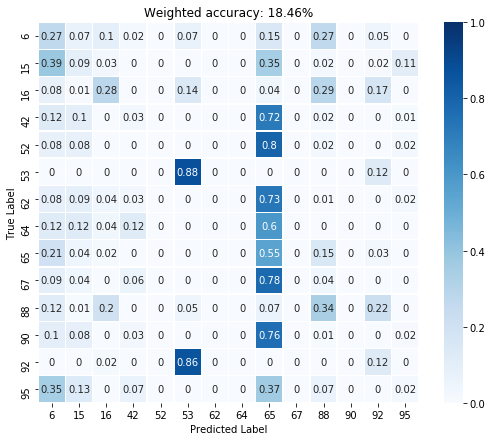

Dev loss at epoch 1000: 2.11715888977


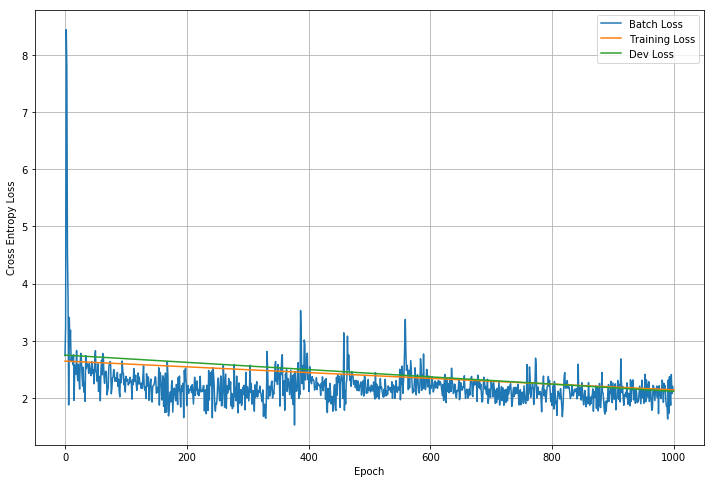

Training with learning rate: 1.0


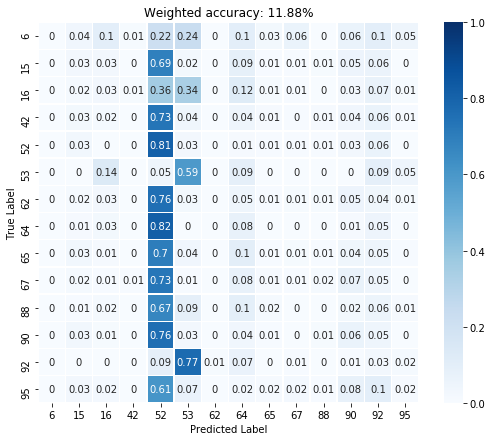

Training loss before training: 2.62201070786


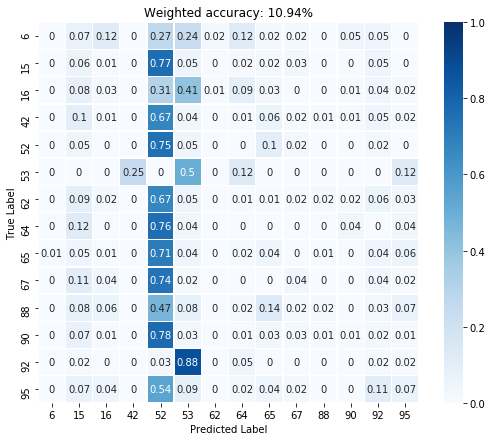

Dev loss before training: 2.62716555595


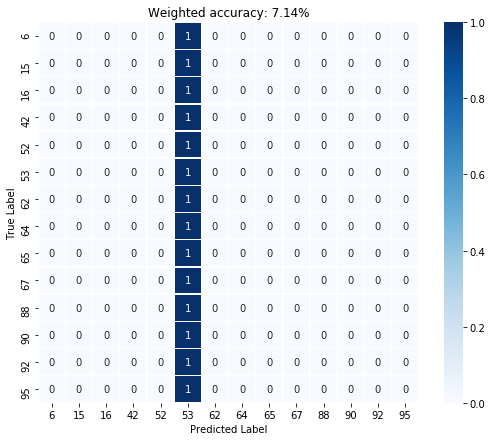

Training loss at epoch 1000: 2.67852163315


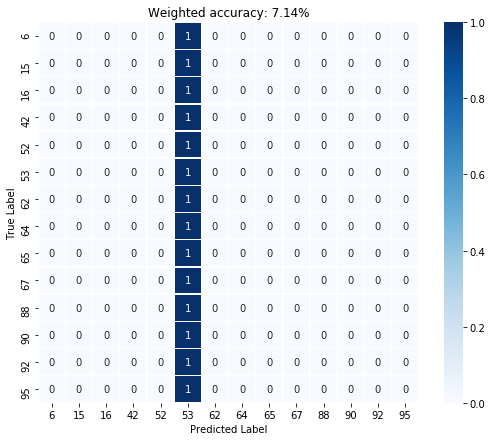

Dev loss at epoch 1000: 2.68360829353


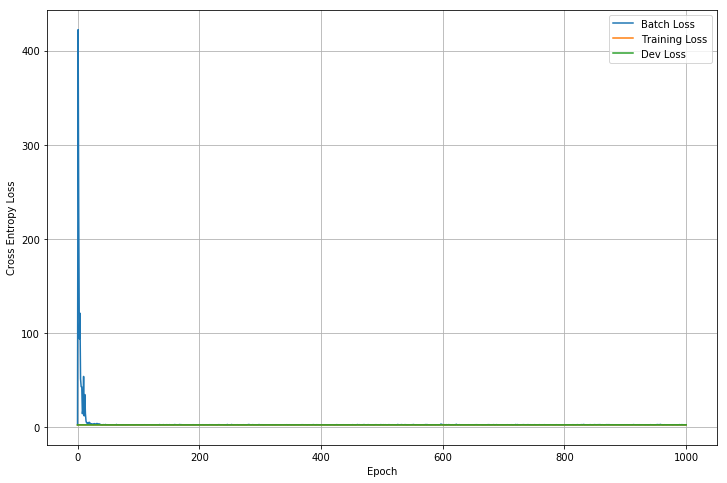

Training with learning rate: 10.0


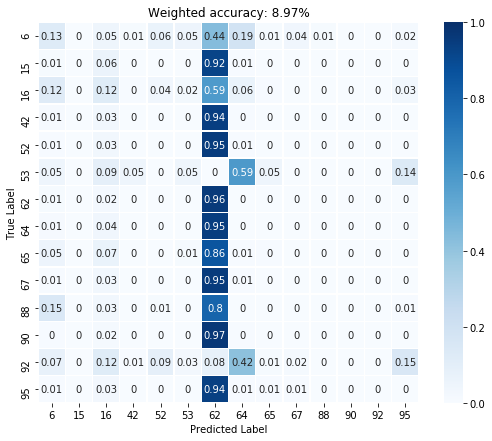

Training loss before training: 2.64384770393


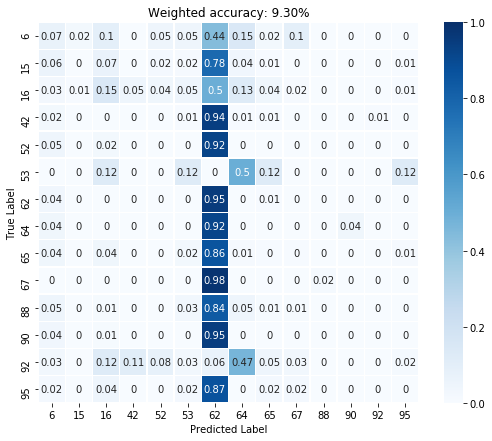

Dev loss before training: 2.68372058868


KeyboardInterrupt: 

In [84]:
%%time
for lr in np.logspace(-6, 1, 8):
    print('Training with learning rate:', lr)
    model = CNN(n_passbands, n_classes)
    train_model(model, lr=lr, save_models=False, n_epochs=1000, print_frequency=1000)

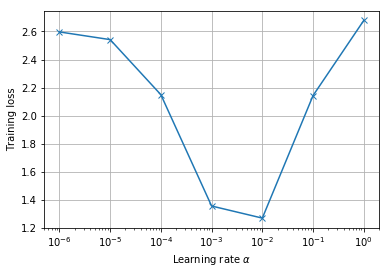

In [90]:
training_losses = [2.59677290916,2.54202103615,2.14985752106,1.3572729826,1.27105772495,2.1437702179,2.67852163315]
plt.figure(figsize=(6,4))
plt.semilogx(np.logspace(-6, 0, 7), training_losses, '-x')
plt.xlabel(r'Learning rate $\alpha$')
plt.ylabel('Training loss')
plt.grid()
plt.show()

### Small CNN with metadata

In [73]:
# https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py
class CNNWithMetadata(nn.Module):
    def __init__(self, n_passbands, n_classes, n_metadata_features):
        super(CNNWithMetadata, self).__init__()
                
        self.features = nn.Sequential(
            # size 352
            nn.Conv1d(n_passbands, 16, kernel_size=3, padding=1),
            nn.BatchNorm1d(16), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 176
            nn.Conv1d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 88
            nn.Conv1d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 44
            nn.Conv1d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 22
            nn.Conv1d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32), nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=2, stride=2),
            # size 11
        )
        
        self.classifier = nn.Sequential(
#             nn.Linear(32 * 11, 256),
#             nn.ReLU(True),
#             nn.Dropout(p=0.1),
#             nn.Linear(256, 64),
#             nn.ReLU(True),
#             nn.Dropout(p=0.1),
            nn.Linear(32*11 + n_metadata_features, n_classes),
        )

        self._initialize_weights()

    def forward(self, x):
        x, meta_x = x
        
        x = self.features(x)
        # reshape to (batch_size, num_flattened_features)
        x = x.view(x.size(0), -1)
        # concatenate with metadata
        x = torch.cat((x, meta_x), 1)
        x = self.classifier(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)

model = CNNWithMetadata(n_passbands, n_classes, X.shape[1])
print_summary(model)

Number of trainable parameters: 16638
CNNWithMetadata(
  (features): Sequential(
    (0): Conv1d(6, 16, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv1d(16, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (5): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace)
    (7): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv1d(32, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (9): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace)
    (11): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv1d(32, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (13): BatchNorm1d(32, eps=1e-05, momentum=0.1, af

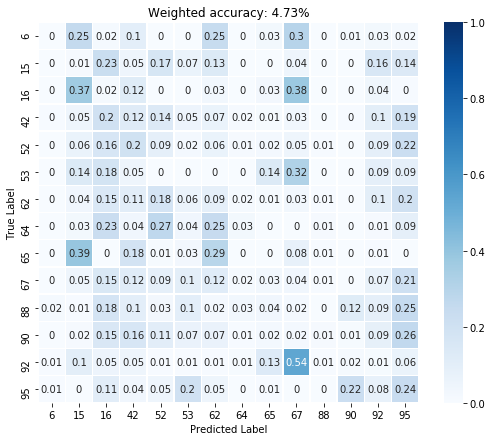

Training loss before training: 2.65082216263


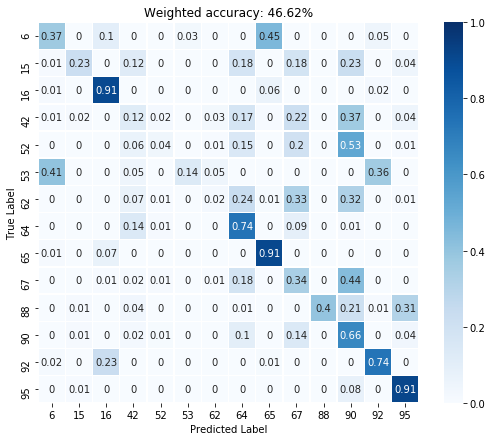

Training loss at epoch 100: 1.55190050602


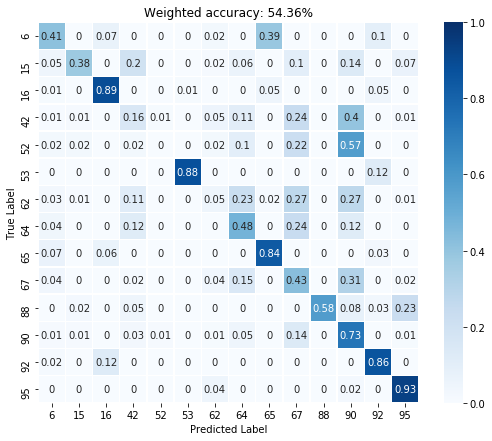

Dev loss at epoch 100: 1.38513946533


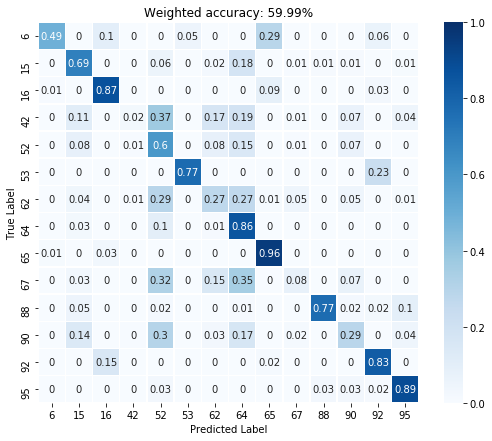

Training loss at epoch 200: 1.1974105835


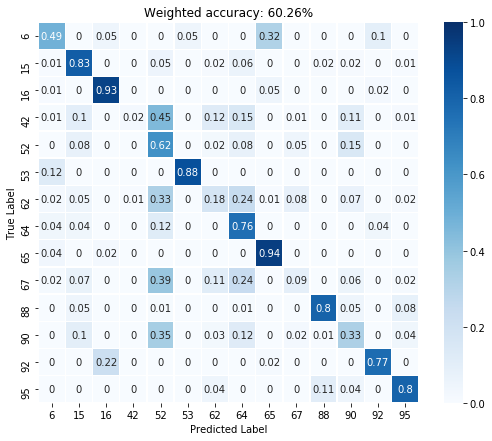

Dev loss at epoch 200: 1.22028648853


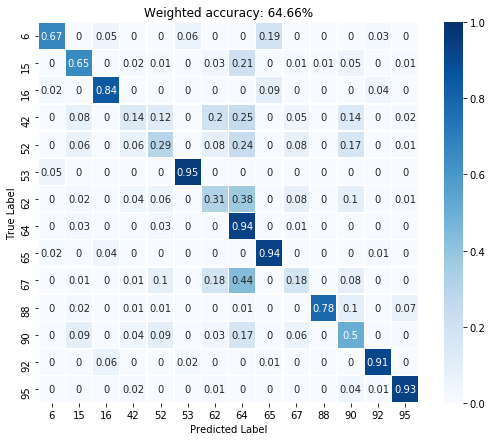

Training loss at epoch 300: 1.0189448595


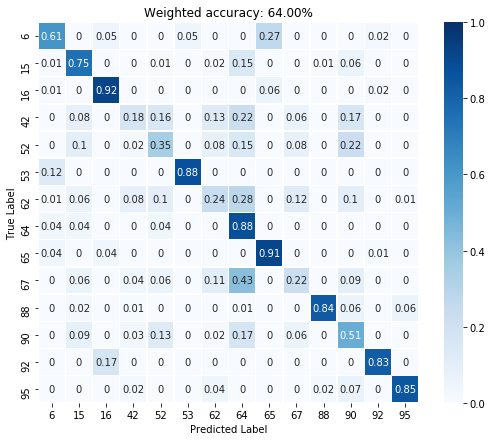

Dev loss at epoch 300: 1.06307554245


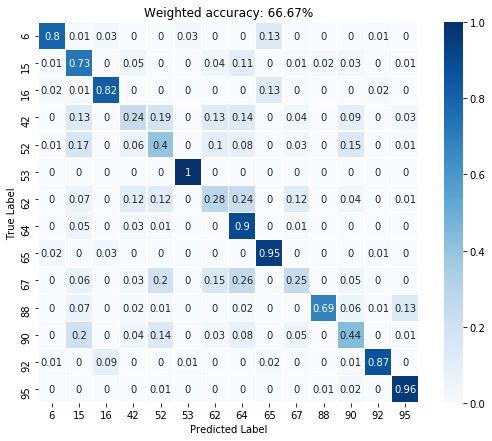

Training loss at epoch 400: 0.985097050667


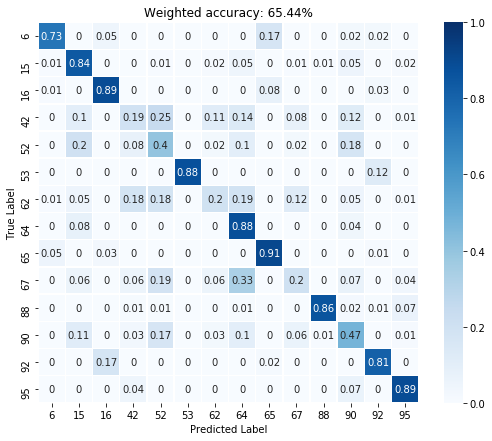

Dev loss at epoch 400: 1.01081490517


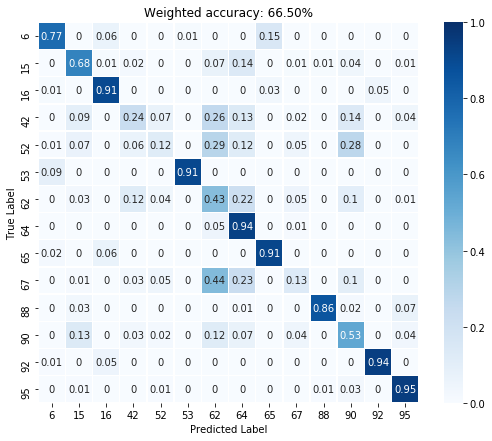

Training loss at epoch 500: 0.930061280727


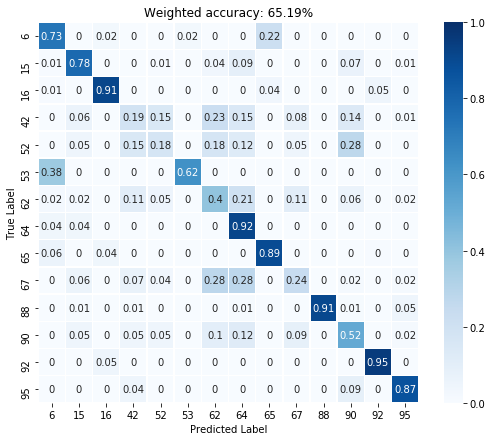

Dev loss at epoch 500: 0.947124183178


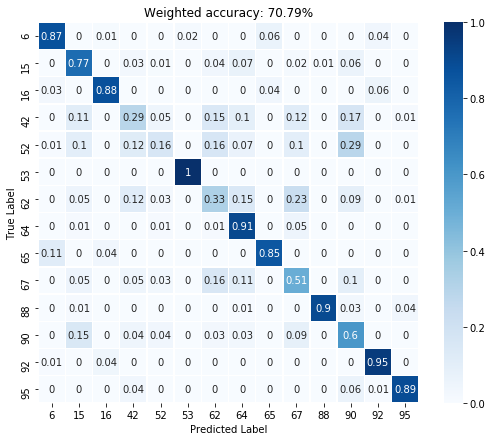

Training loss at epoch 600: 0.865985691547


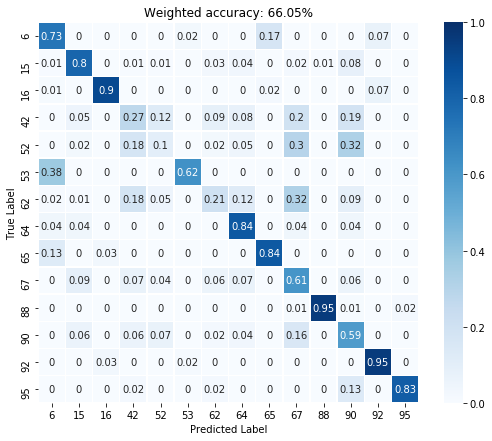

Dev loss at epoch 600: 0.945588469505


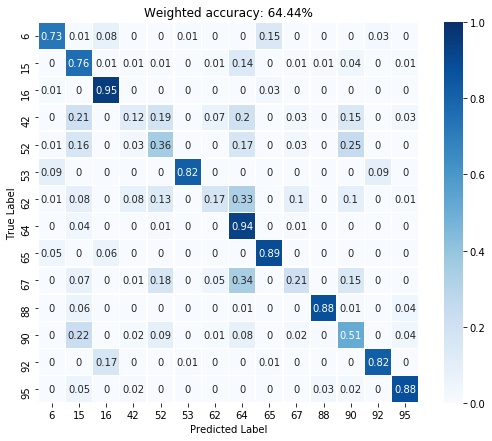

Training loss at epoch 700: 1.02465355396


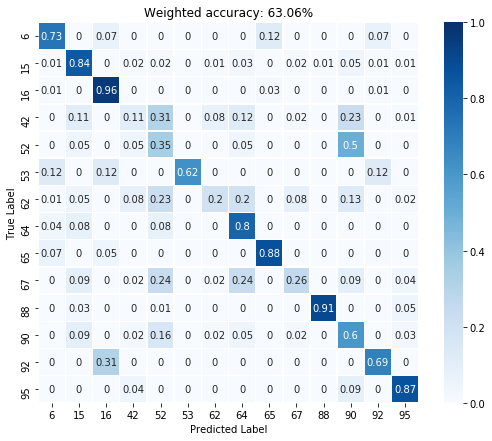

Dev loss at epoch 700: 1.15168762207


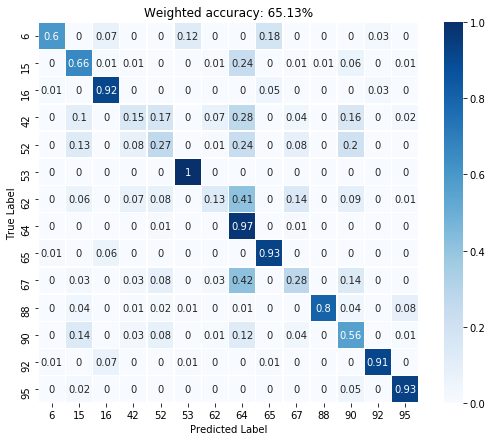

Training loss at epoch 800: 0.98802447319


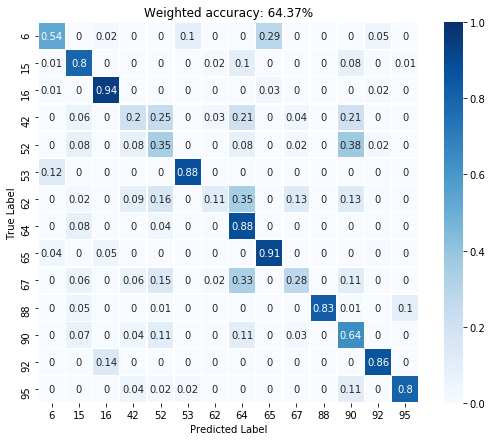

Dev loss at epoch 800: 0.991571784019


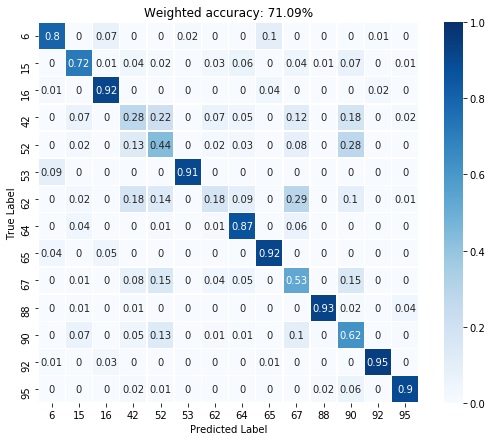

Training loss at epoch 900: 0.829419791698


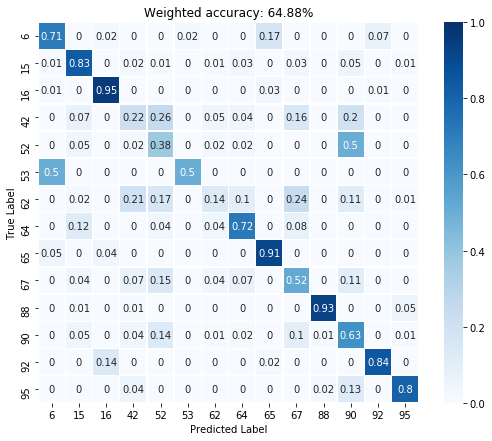

Dev loss at epoch 900: 0.981458365917


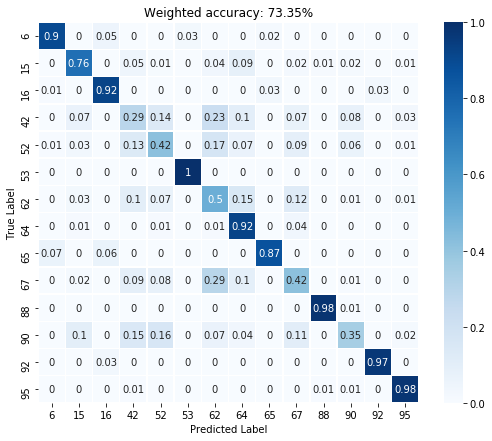

Training loss at epoch 1000: 0.756432235241


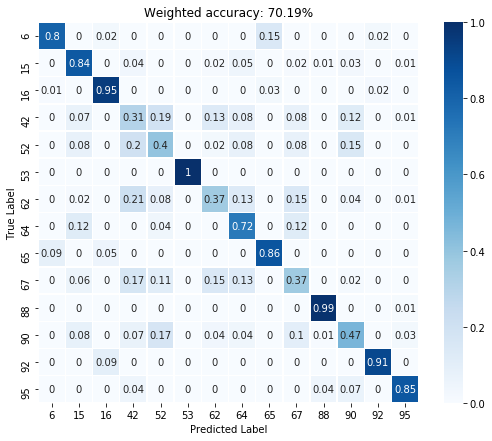

Dev loss at epoch 1000: 0.847423791885


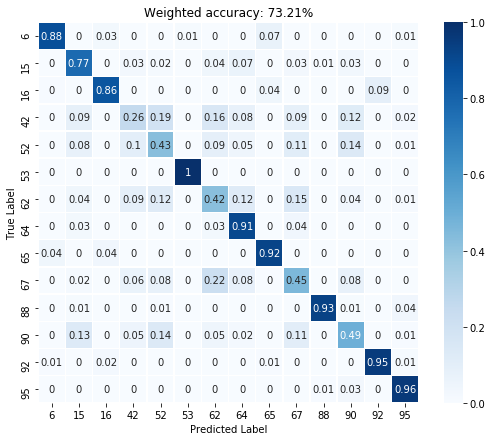

Training loss at epoch 1100: 0.743835091591


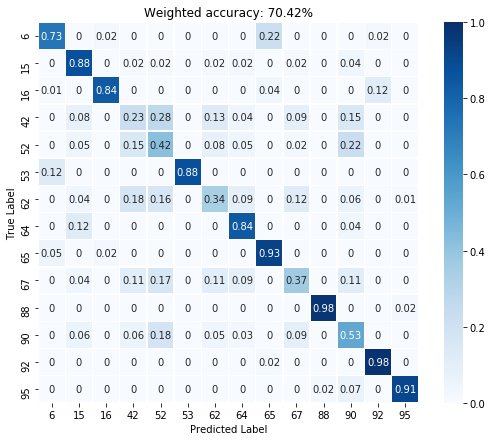

Dev loss at epoch 1100: 0.869829654694


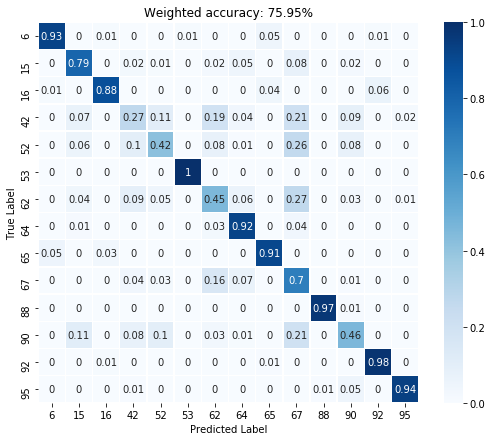

Training loss at epoch 1200: 0.688573420048


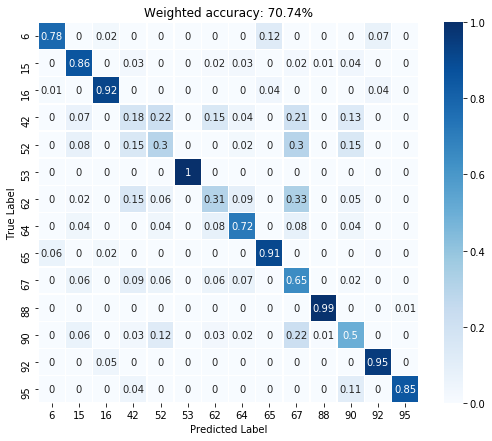

Dev loss at epoch 1200: 0.815871298313


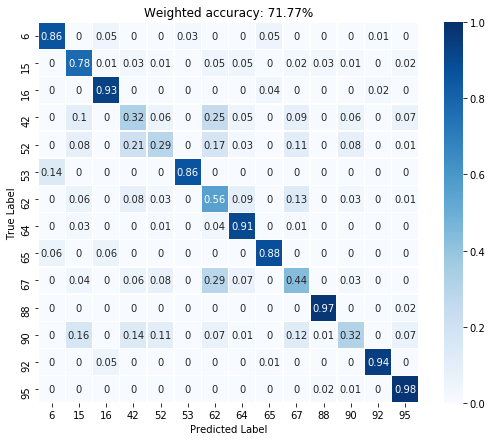

Training loss at epoch 1300: 0.794632315636


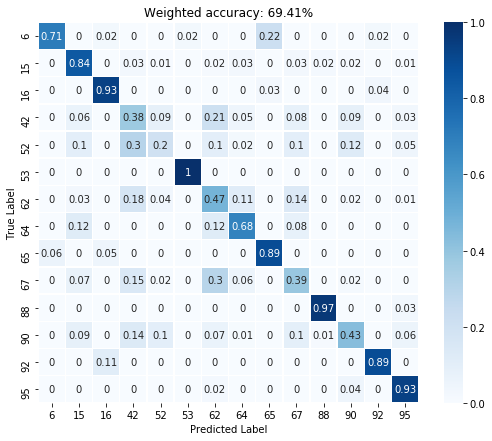

Dev loss at epoch 1300: 0.873988628387


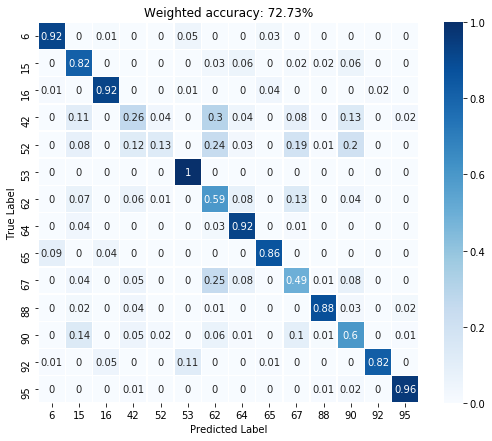

Training loss at epoch 1400: 0.788896620274


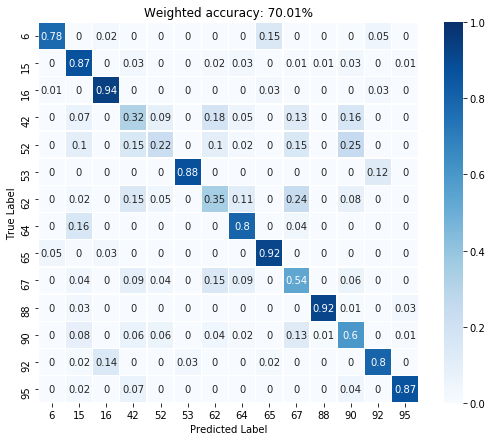

Dev loss at epoch 1400: 0.886939406395


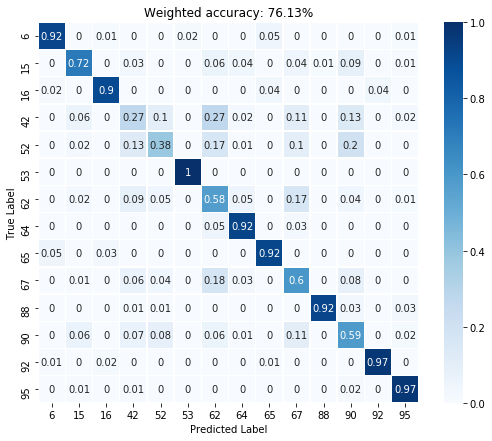

Training loss at epoch 1500: 0.701445043087


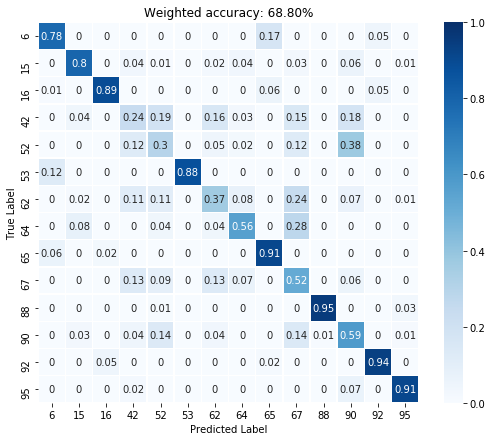

Dev loss at epoch 1500: 0.927423119545


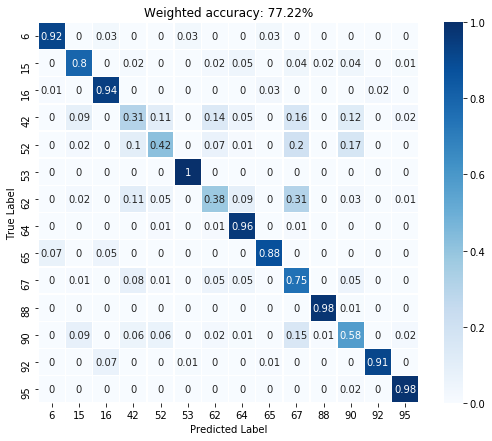

Training loss at epoch 1600: 0.684073805809


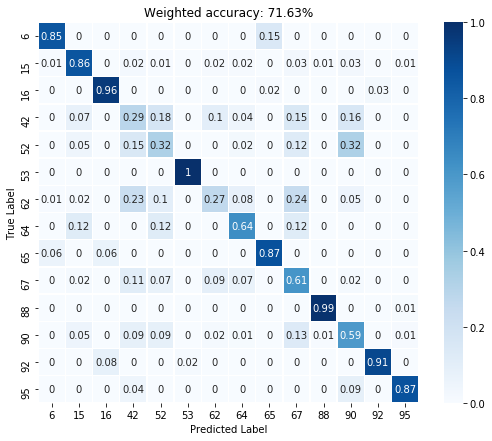

Dev loss at epoch 1600: 0.81071549654


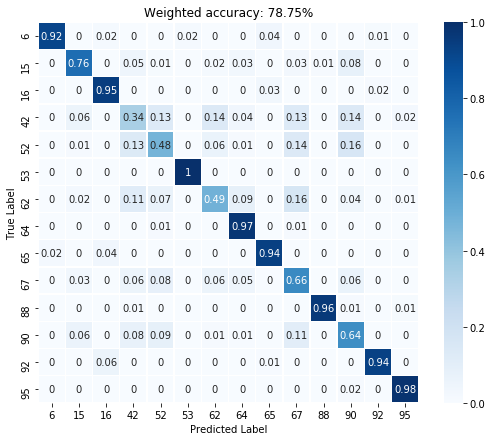

Training loss at epoch 1700: 0.616475999355


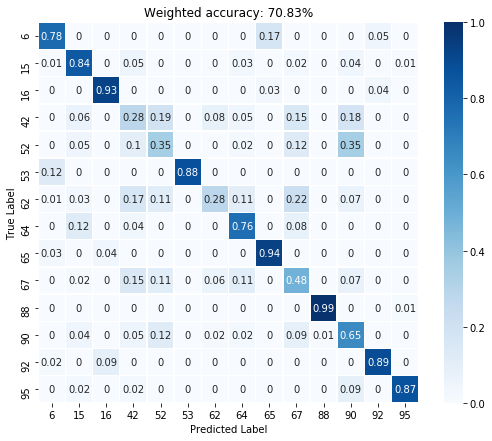

Dev loss at epoch 1700: 0.89172077179


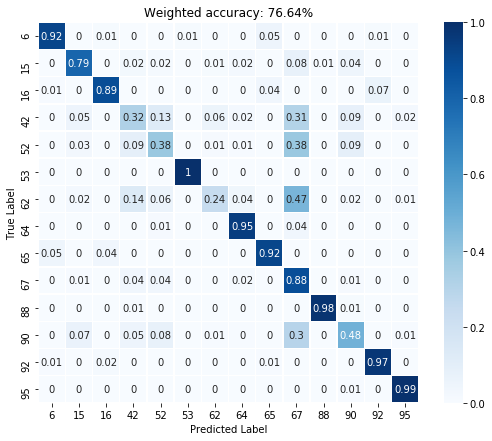

Training loss at epoch 1800: 0.650473773479


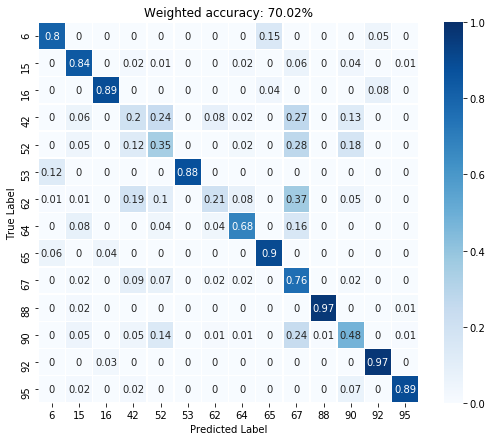

Dev loss at epoch 1800: 0.867806971073


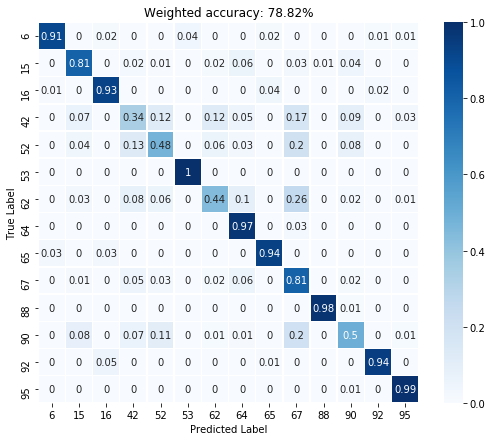

Training loss at epoch 1900: 0.605174124241


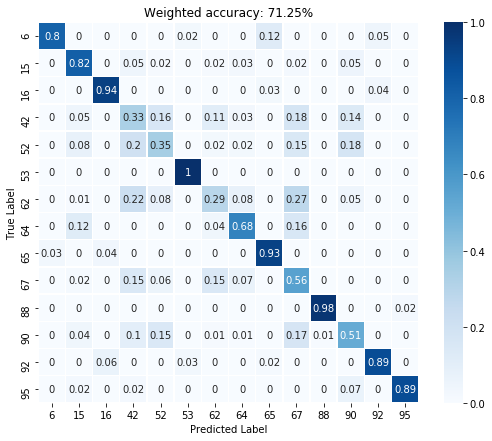

Dev loss at epoch 1900: 0.847640037537


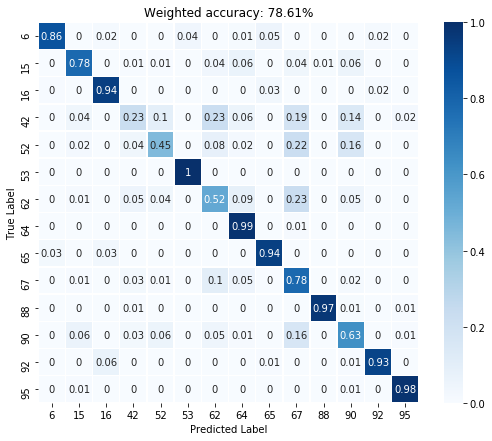

Training loss at epoch 2000: 0.61899715662


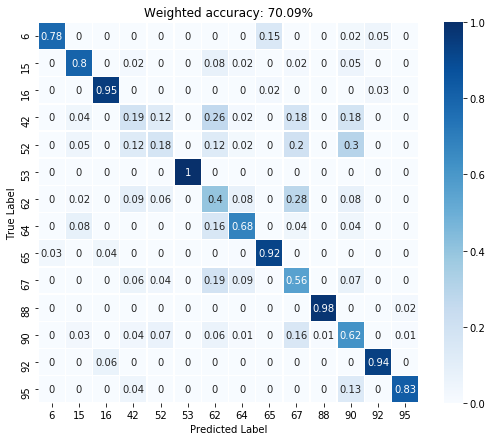

Dev loss at epoch 2000: 0.877544164658


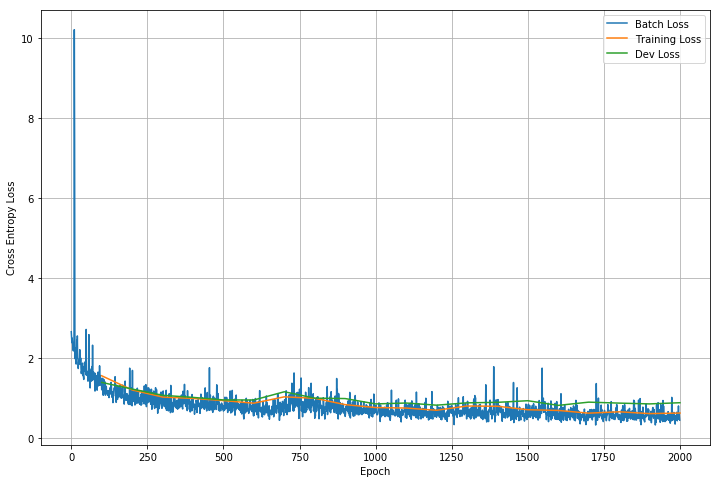

CPU times: user 13min 32s, sys: 1min 17s, total: 14min 50s
Wall time: 7min 30s


In [74]:
%%time
model = CNNWithMetadata(n_passbands, n_classes, X.shape[1])
train_model(model)

### Just LSTM

In [75]:
# https://pytorch.org/tutorials/beginner/nlp/sequence_models_tutorial.html#lstm-s-in-pytorch
class LSTM(nn.Module):
    def __init__(self, n_passbands, n_classes, n_hidden_nodes=32):
        super(LSTM, self).__init__()
        self.n_passbands = n_passbands
        self.n_classes = n_classes
        self.n_hidden_nodes = n_hidden_nodes
        
        self.lstm = nn.LSTM(input_size=n_passbands, hidden_size=self.n_hidden_nodes, bidirectional=False)

        self.hidden2class = nn.Linear(self.n_hidden_nodes, n_classes)

    def init_hidden(self, minibatch_size):
        # (h_n, c_n), each of shape (num_layers * num_directions, batch, hidden_size)
        return (torch.zeros(1, minibatch_size, self.n_hidden_nodes),
                torch.zeros(1, minibatch_size, self.n_hidden_nodes))

    def forward(self, x):
        x, _ = x
        
        # Clear hidden state of LSTM
        self.hidden = self.init_hidden(x.shape[0])

        # input shape (seq_len, batch, input_size)
        # output shape (seq_len, batch, num_directions * hidden_size)
        x, self.hidden = self.lstm(x.permute(2,0,1), self.hidden)
        
        # take only last time step of LSTM
        x = x[-1]
        
        x = self.hidden2class(x)
        
        return x


model = LSTM(n_passbands, n_classes)
print(model)
print('Number of trainable parameters:', count_parameters(model))

LSTM(
  (lstm): LSTM(6, 32)
  (hidden2class): Linear(in_features=32, out_features=14, bias=True)
)
Number of trainable parameters: 5582


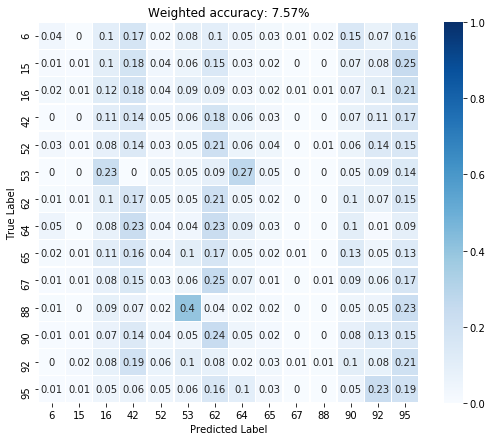

Training loss before training: 2.65626478195


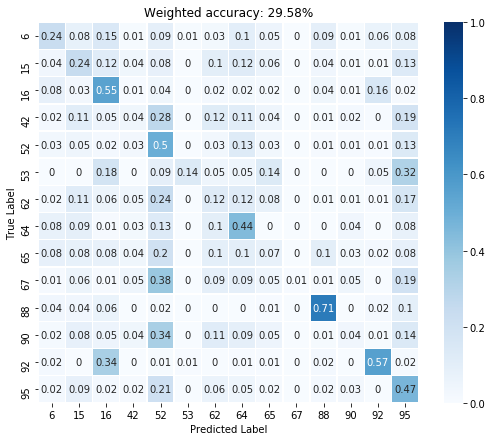

Training loss at epoch 100: 2.04435348511


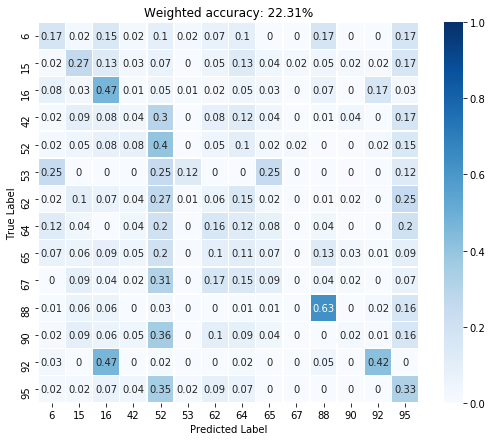

Dev loss at epoch 100: 2.20687365532


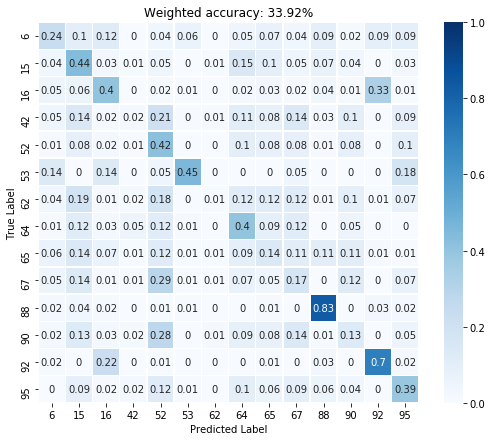

Training loss at epoch 200: 1.90434157848


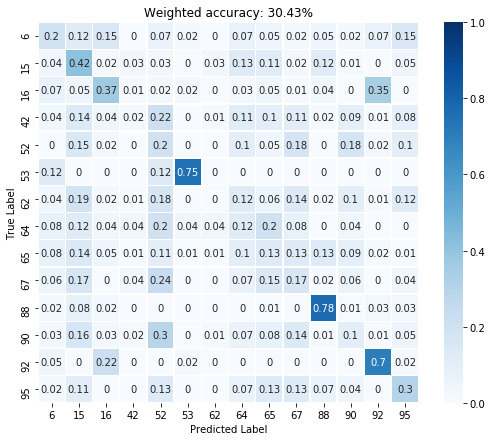

Dev loss at epoch 200: 2.03591132164


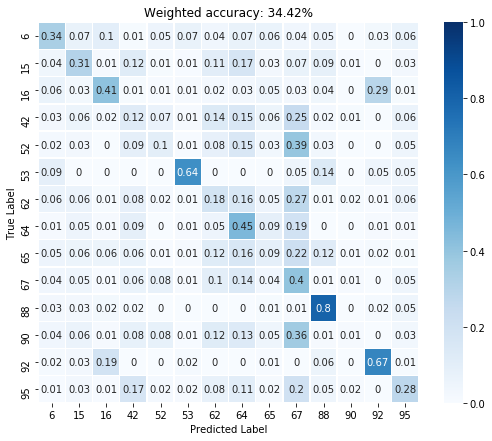

Training loss at epoch 300: 1.90886950493


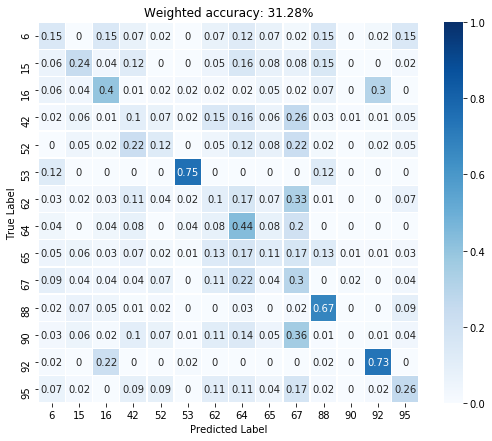

Dev loss at epoch 300: 2.0408205986


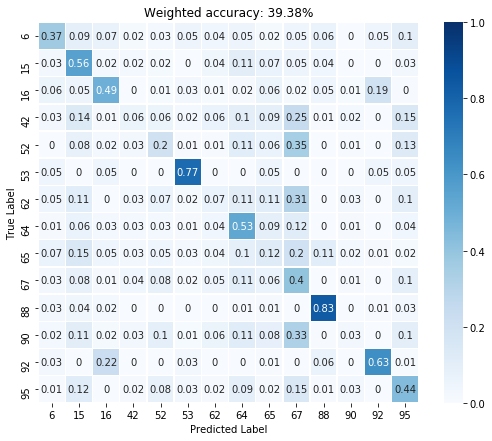

Training loss at epoch 400: 1.74618494511


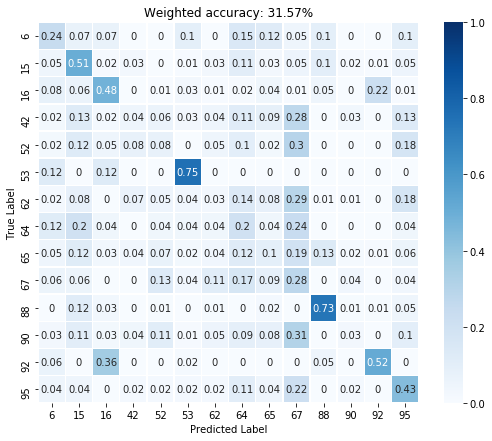

Dev loss at epoch 400: 1.97090411186


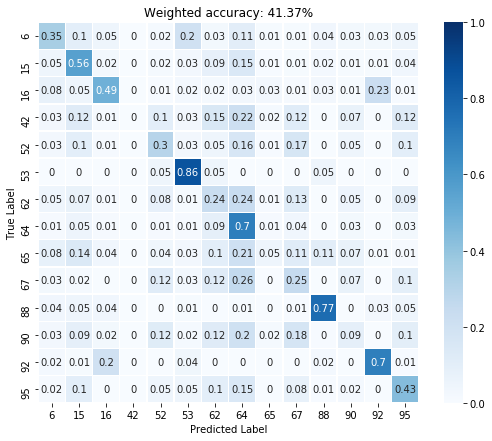

Training loss at epoch 500: 1.75002729893


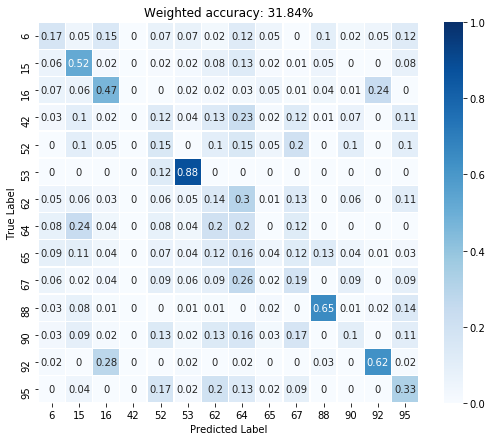

Dev loss at epoch 500: 1.99026465416


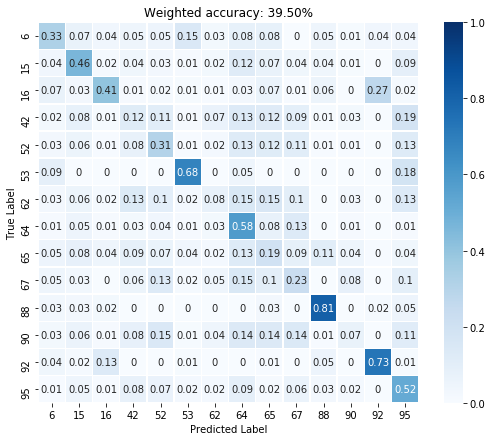

Training loss at epoch 600: 1.73556017876


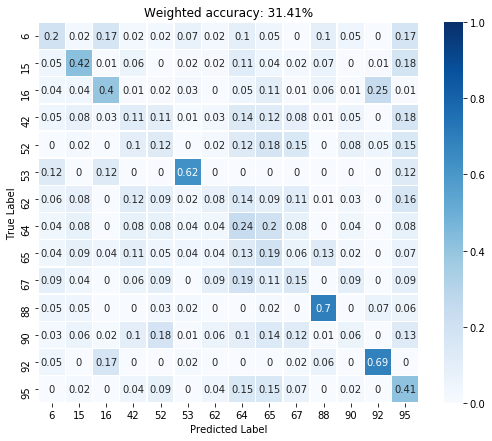

Dev loss at epoch 600: 1.98883163929


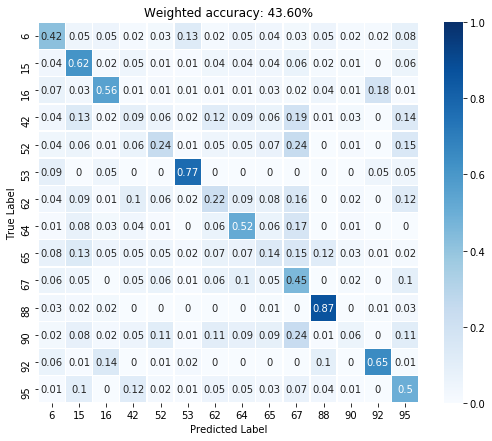

Training loss at epoch 700: 1.65253150463


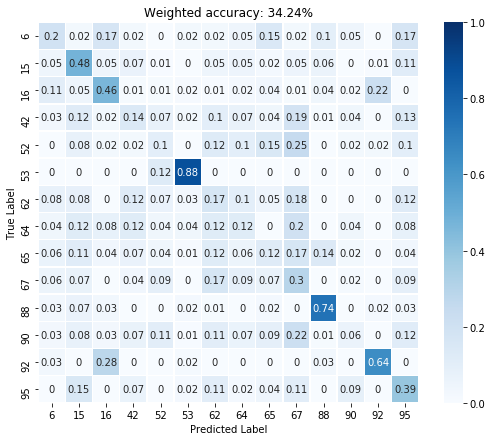

Dev loss at epoch 700: 1.91988623142


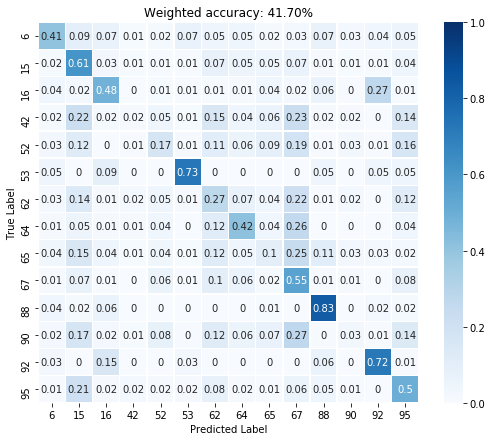

Training loss at epoch 800: 1.71229183674


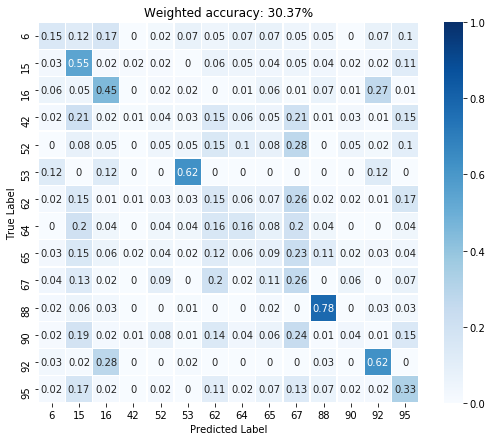

Dev loss at epoch 800: 2.07159805298


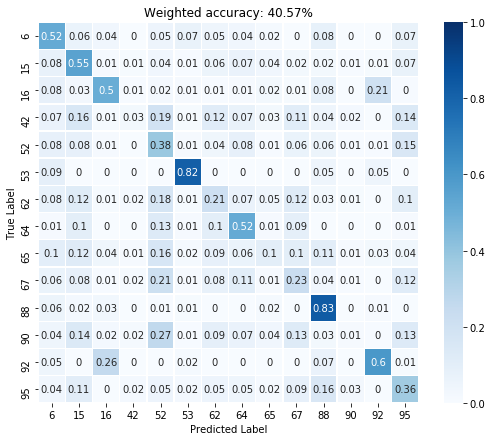

Training loss at epoch 900: 1.72945094109


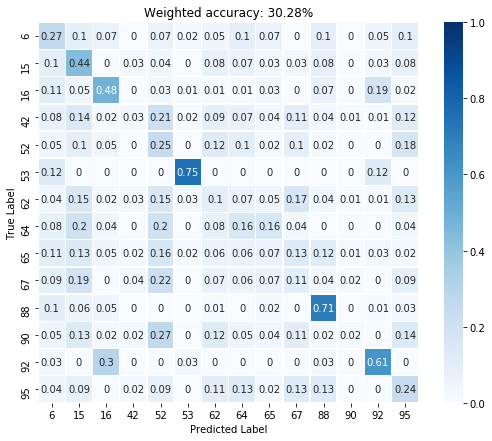

Dev loss at epoch 900: 2.06703710556


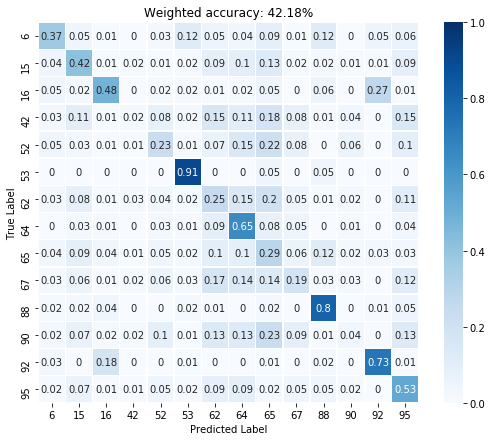

Training loss at epoch 1000: 1.68136942387


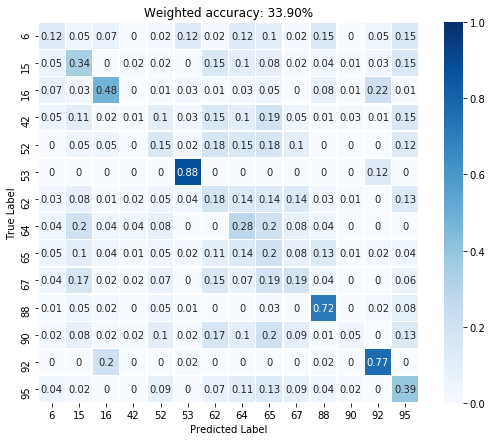

Dev loss at epoch 1000: 2.02853727341


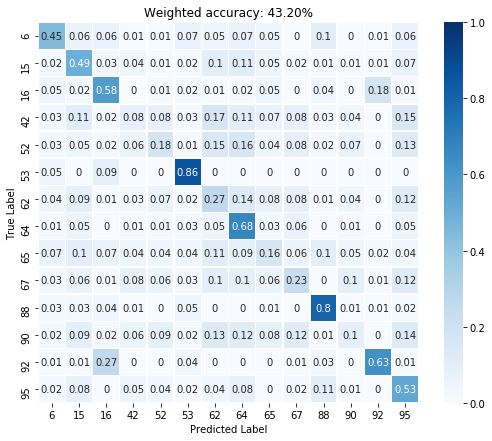

Training loss at epoch 1100: 1.68951237202


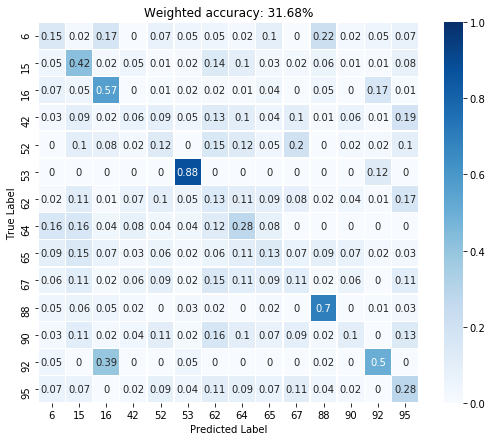

Dev loss at epoch 1100: 2.02265667915


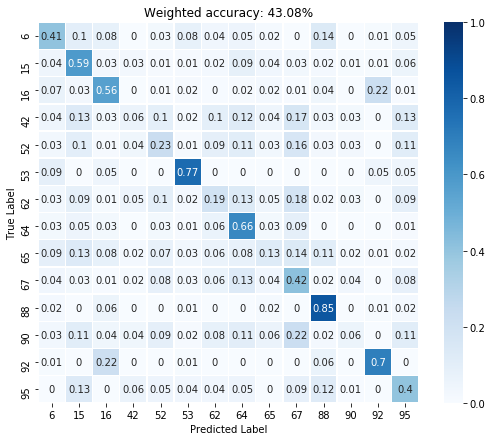

Training loss at epoch 1200: 1.64734137058


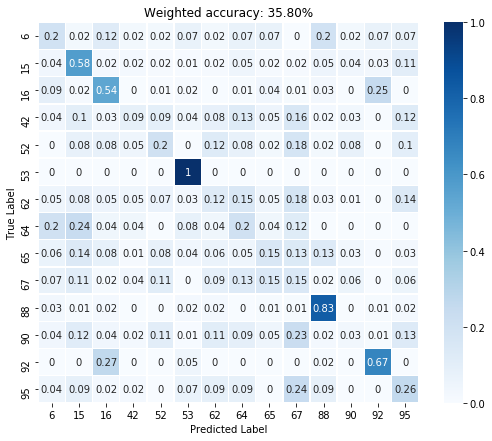

Dev loss at epoch 1200: 2.00779342651


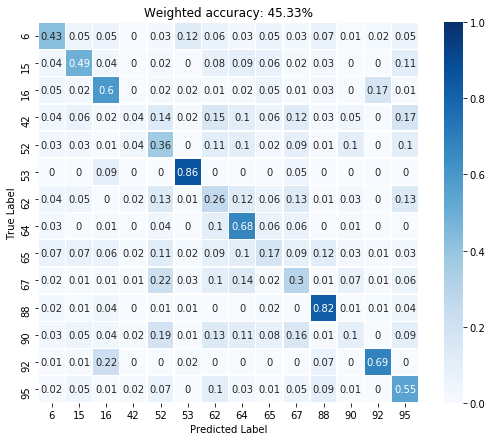

Training loss at epoch 1300: 1.61756873131


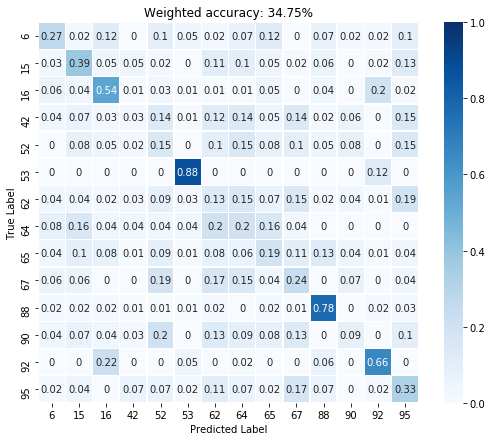

Dev loss at epoch 1300: 1.98165118694


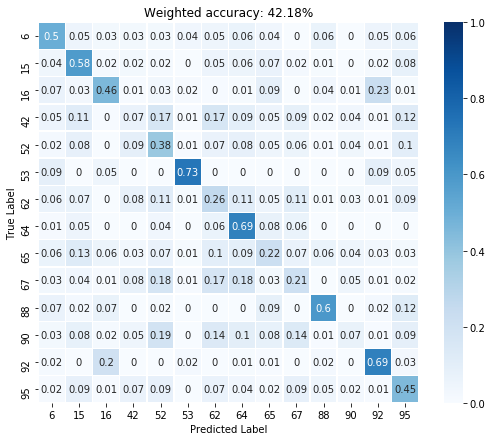

Training loss at epoch 1400: 1.64885354042


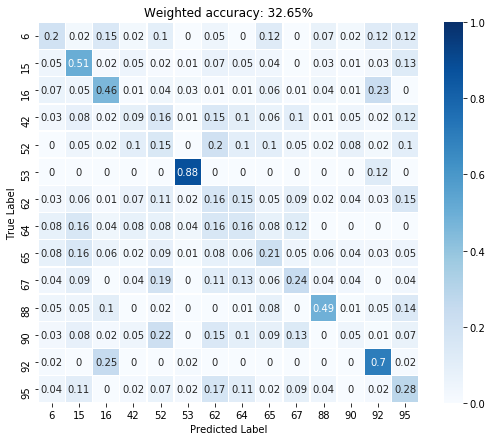

Dev loss at epoch 1400: 2.05562639236


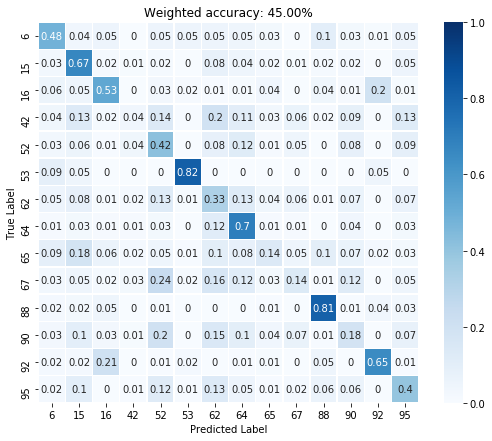

Training loss at epoch 1500: 1.62586200237


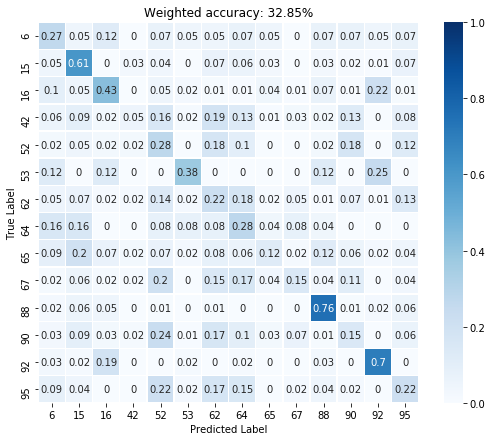

Dev loss at epoch 1500: 2.12119340897


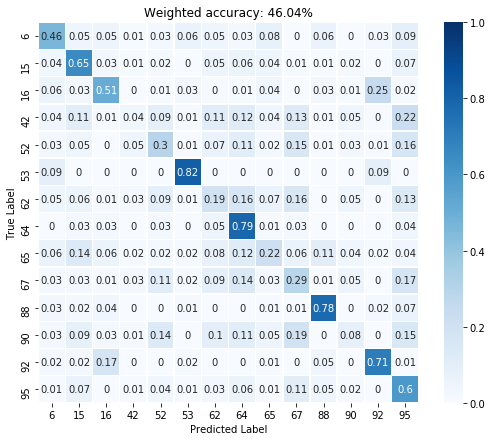

Training loss at epoch 1600: 1.56544029713


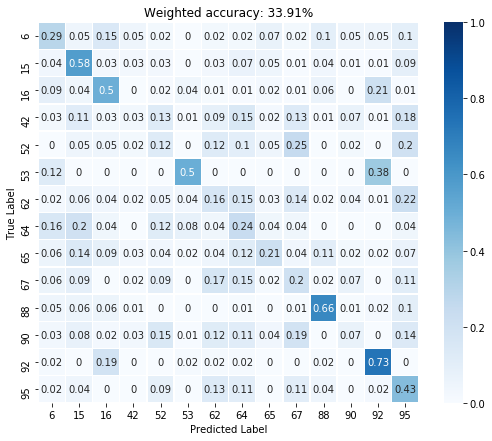

Dev loss at epoch 1600: 2.03574800491


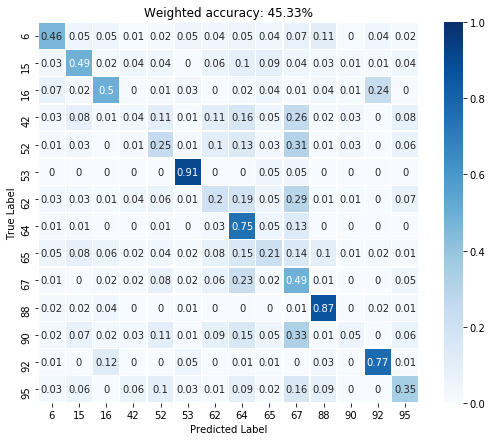

Training loss at epoch 1700: 1.60701811314


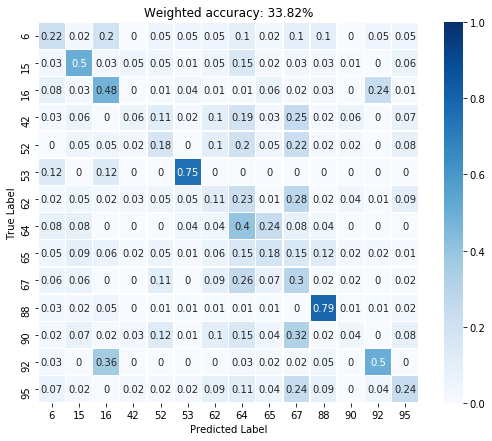

Dev loss at epoch 1700: 2.0659725666


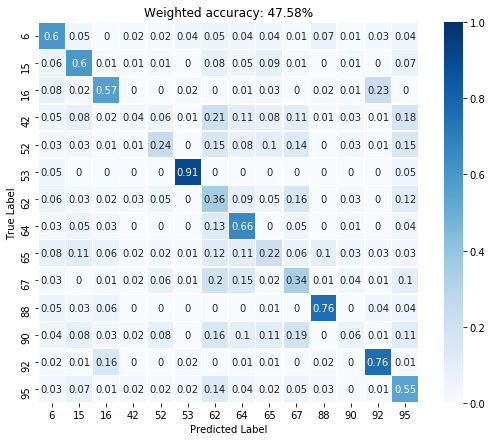

Training loss at epoch 1800: 1.54828190804


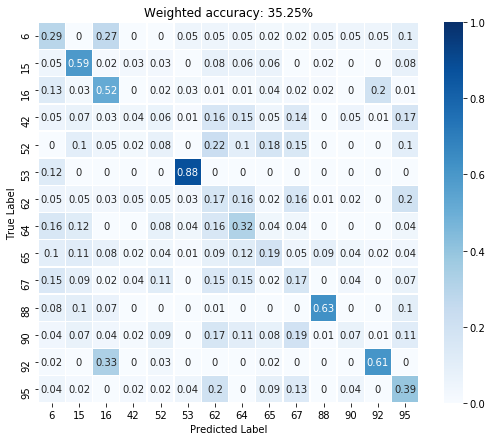

Dev loss at epoch 1800: 2.02673149109


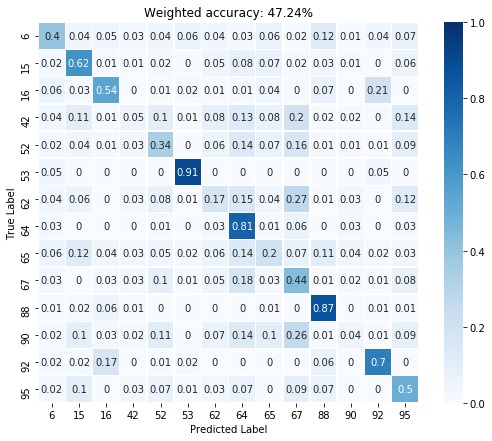

Training loss at epoch 1900: 1.54228401184


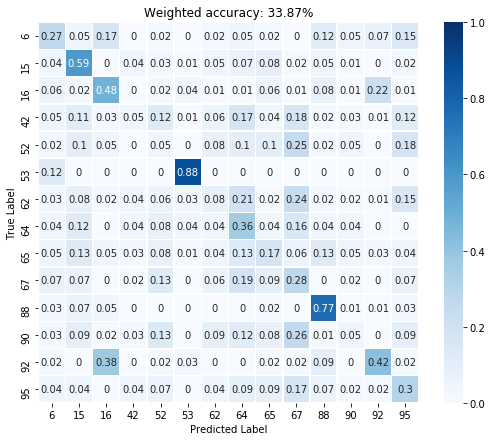

Dev loss at epoch 1900: 2.02261066437


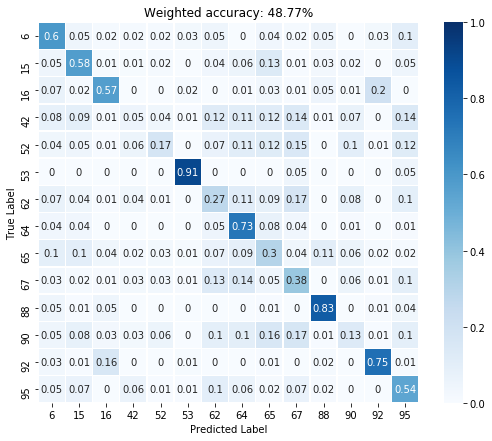

Training loss at epoch 2000: 1.49050533772


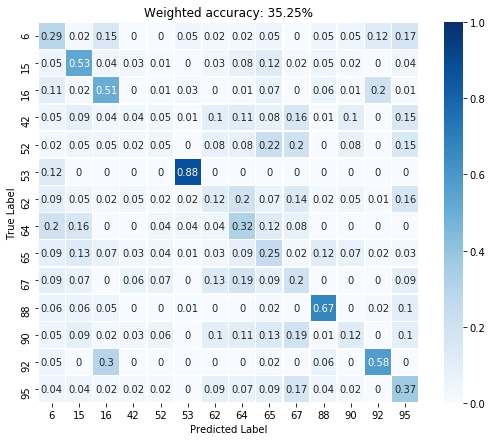

Dev loss at epoch 2000: 2.02383112907


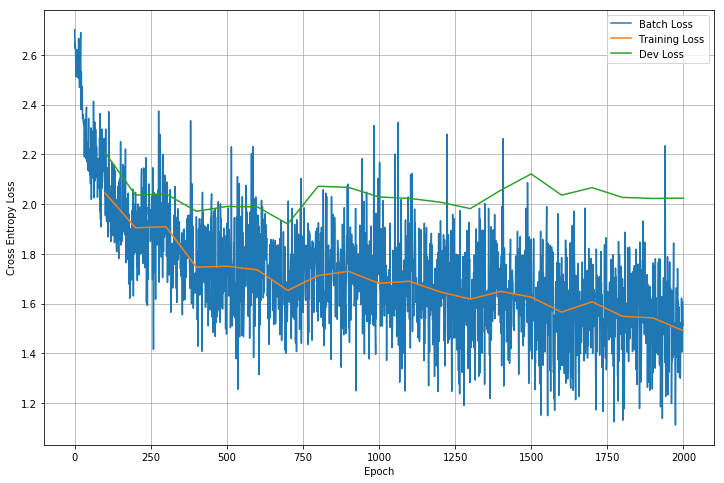

CPU times: user 43min 47s, sys: 1min 58s, total: 45min 45s
Wall time: 23min 33s


In [76]:
%%time
model = LSTM(n_passbands, n_classes)
train_model(model)

### LSTM with metadata

In [77]:
# https://pytorch.org/tutorials/beginner/nlp/sequence_models_tutorial.html#lstm-s-in-pytorch
class LSTMWithMetadata(nn.Module):
    def __init__(self, n_passbands, n_classes, n_metadata_features, n_hidden_nodes=32):
        super(LSTMWithMetadata, self).__init__()
        self.n_passbands = n_passbands
        self.n_classes = n_classes
        self.n_metadata_features = n_metadata_features
        self.n_hidden_nodes = n_hidden_nodes
        
        self.lstm = nn.LSTM(input_size=n_passbands, hidden_size=self.n_hidden_nodes, bidirectional=False)

        self.hidden2class = nn.Linear(self.n_hidden_nodes + n_metadata_features, n_classes)

    def init_hidden(self, minibatch_size):
        # (h_n, c_n), each of shape (num_layers * num_directions, batch, hidden_size)
        return (torch.zeros(1, minibatch_size, self.n_hidden_nodes),
                torch.zeros(1, minibatch_size, self.n_hidden_nodes))

    def forward(self, x):
        x, meta_x = x
        
        # Clear hidden state of LSTM
        self.hidden = self.init_hidden(x.shape[0])

        # input shape (seq_len, batch, input_size)
        # output shape (seq_len, batch, num_directions * hidden_size)
        x, self.hidden = self.lstm(x.permute(2,0,1), self.hidden)
        
        # take only last time step of LSTM
        x = x[-1]
        
        # concatenate with metadata features
        x = torch.cat((x, meta_x), 1)
        
        x = self.hidden2class(x)
        
        return x


model = LSTMWithMetadata(n_passbands, n_classes, X.shape[1])
print(model)
print('Number of trainable parameters:', count_parameters(model))

LSTMWithMetadata(
  (lstm): LSTM(6, 32)
  (hidden2class): Linear(in_features=48, out_features=14, bias=True)
)
Number of trainable parameters: 5806


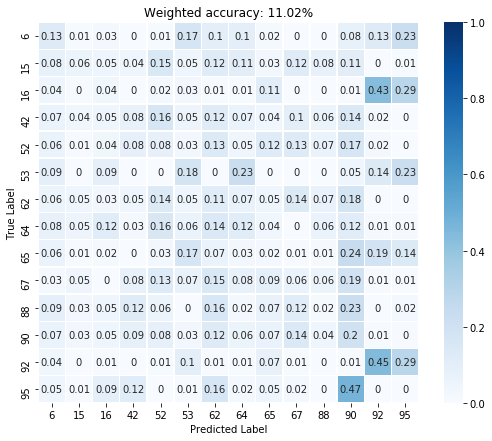

Training loss before training: 2.6400821209


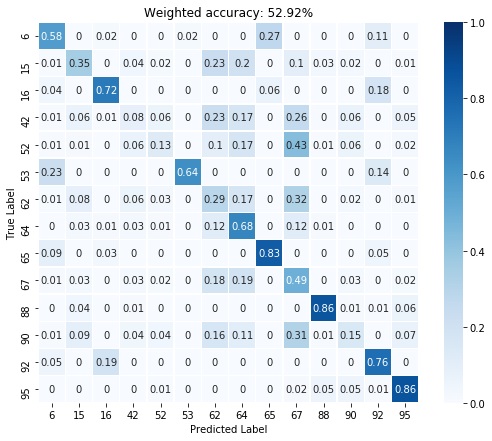

Training loss at epoch 100: 1.3721729517


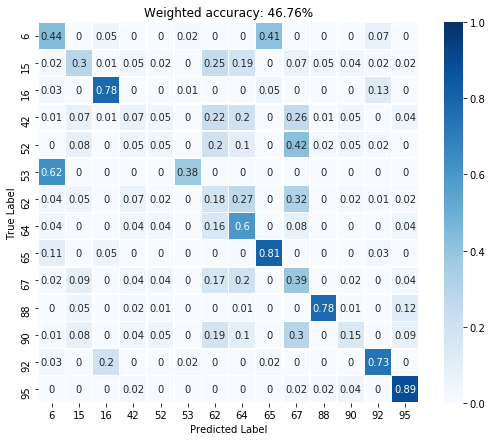

Dev loss at epoch 100: 1.48739612103


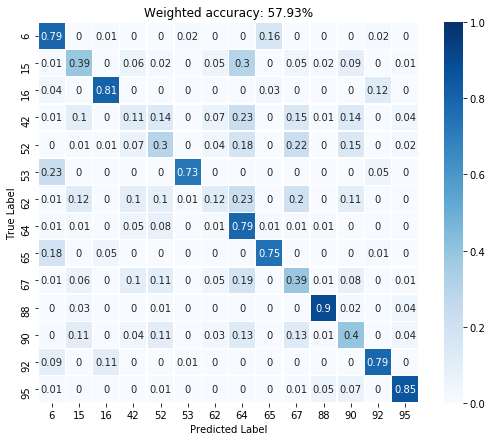

Training loss at epoch 200: 1.18647003174


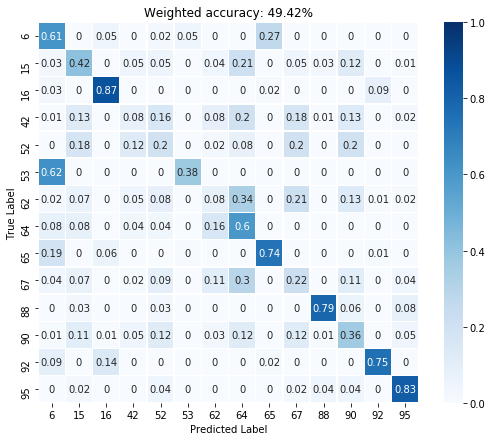

Dev loss at epoch 200: 1.33537244797


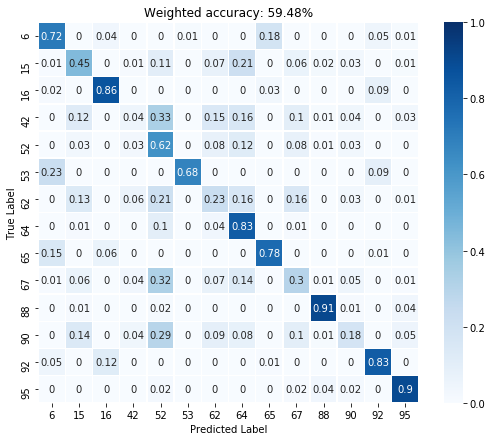

Training loss at epoch 300: 1.11397254467


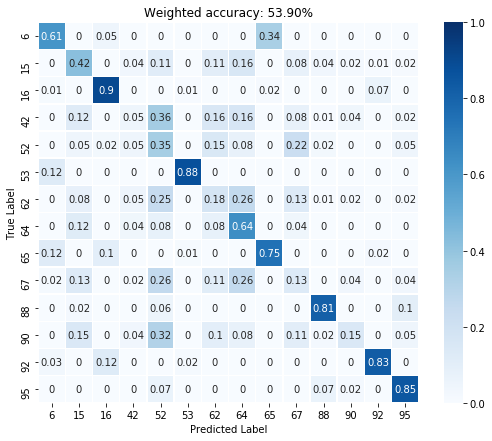

Dev loss at epoch 300: 1.29772150517


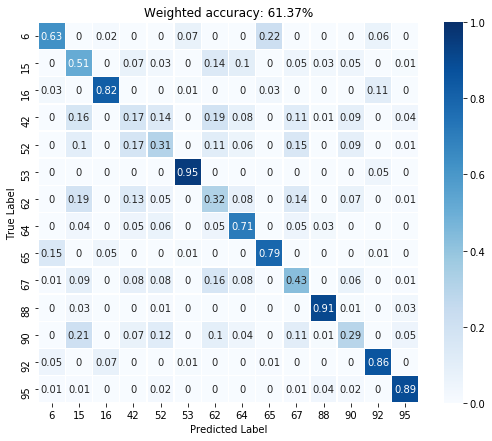

Training loss at epoch 400: 1.06726253033


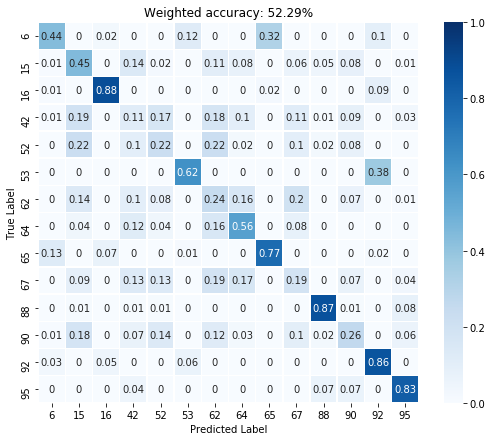

Dev loss at epoch 400: 1.28616666794


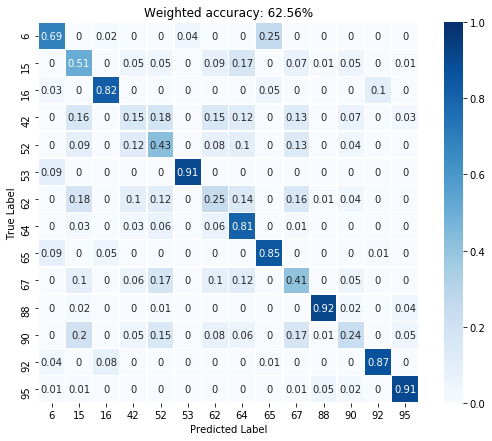

Training loss at epoch 500: 1.03330945969


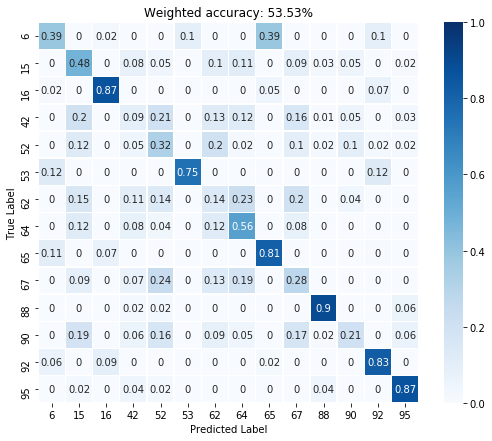

Dev loss at epoch 500: 1.24362742901


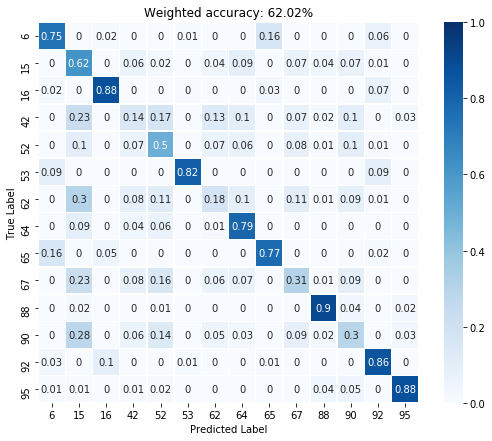

Training loss at epoch 600: 1.06242287159


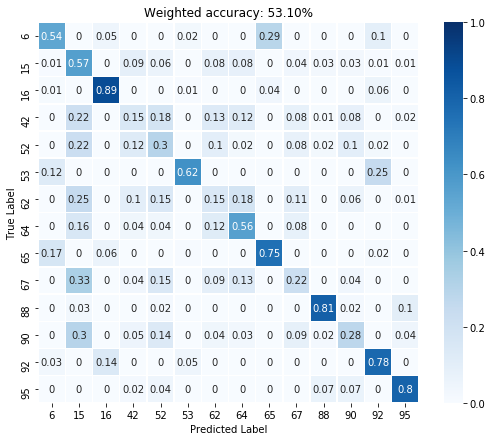

Dev loss at epoch 600: 1.27170813084


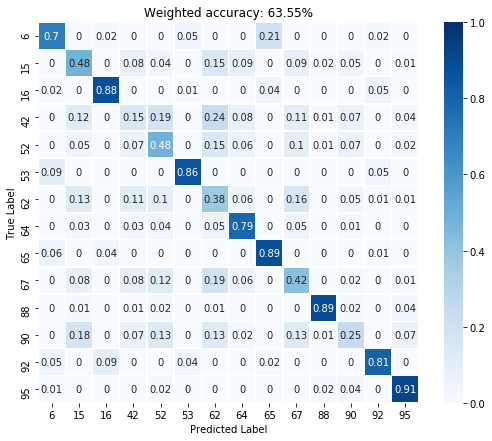

Training loss at epoch 700: 0.99417001009


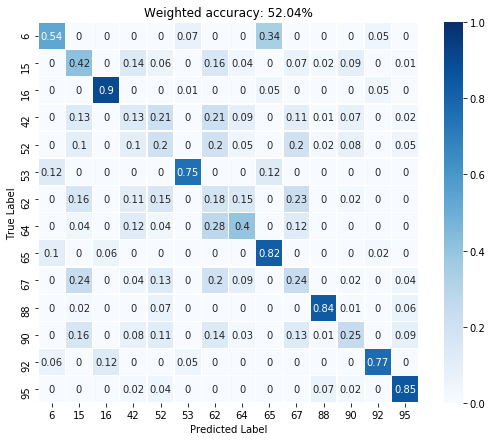

Dev loss at epoch 700: 1.27090549469


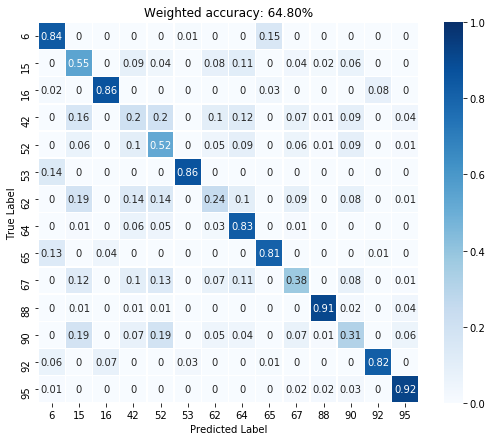

Training loss at epoch 800: 0.969377636909


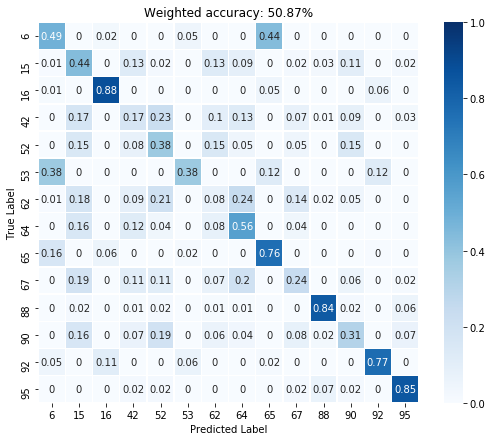

Dev loss at epoch 800: 1.32559323311


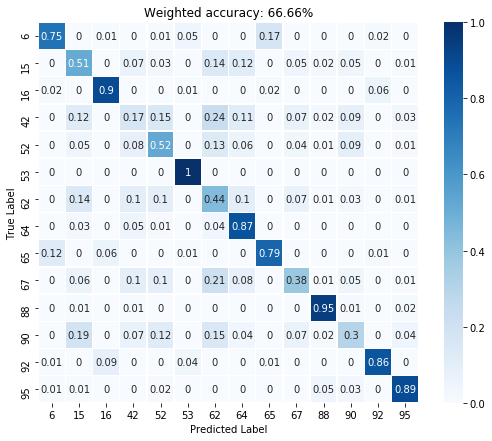

Training loss at epoch 900: 0.941055893898


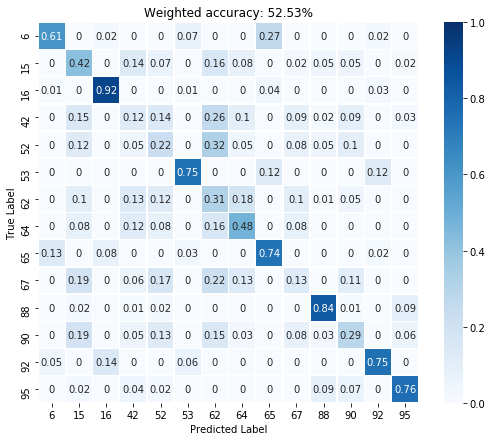

Dev loss at epoch 900: 1.2392526865


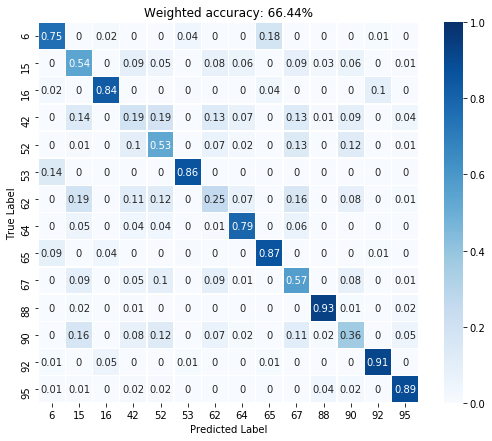

Training loss at epoch 1000: 0.934539854527


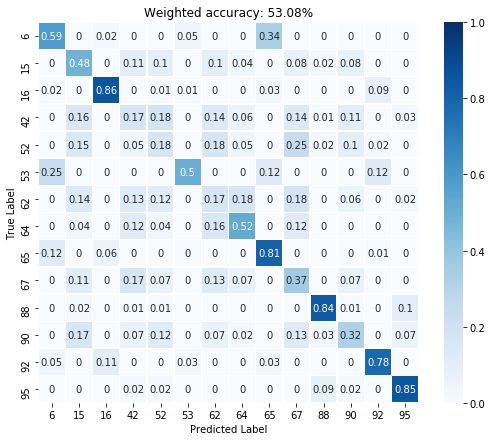

Dev loss at epoch 1000: 1.26767158508


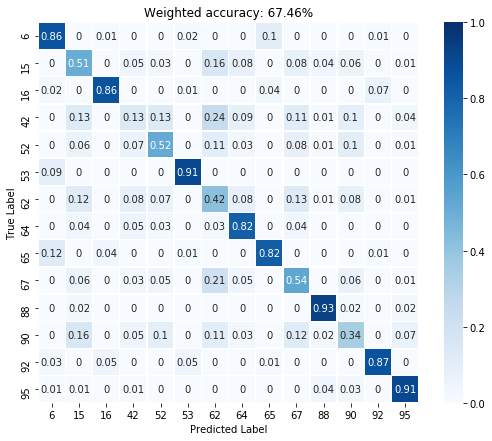

Training loss at epoch 1100: 0.922745049


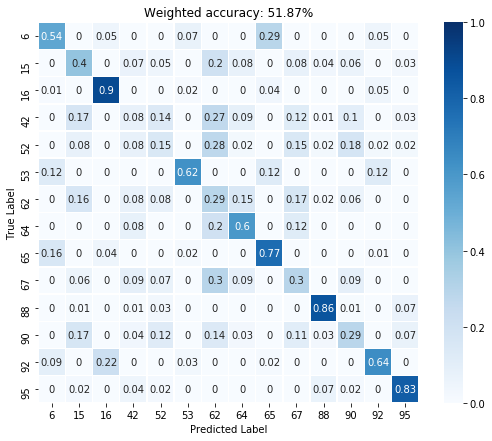

Dev loss at epoch 1100: 1.30861186981


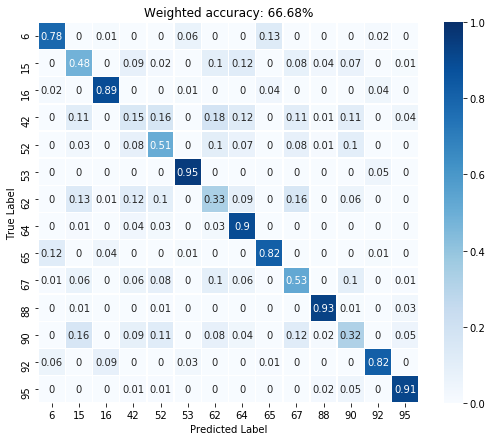

Training loss at epoch 1200: 0.923824727535


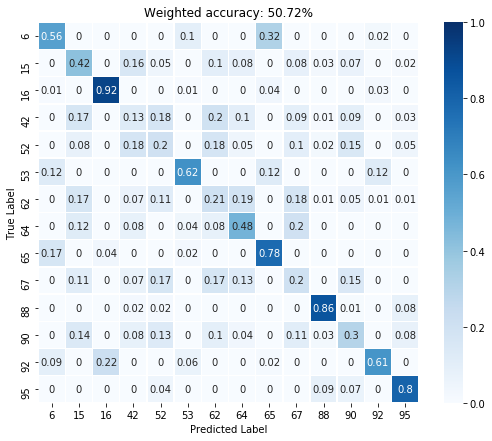

Dev loss at epoch 1200: 1.3356192112


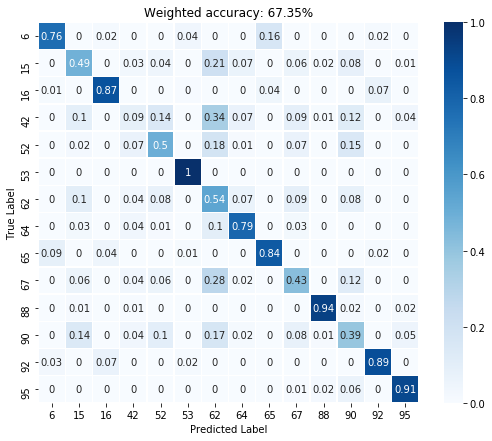

Training loss at epoch 1300: 0.906177222729


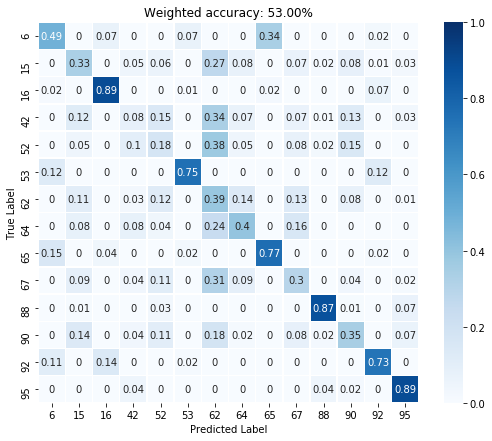

Dev loss at epoch 1300: 1.30427253246


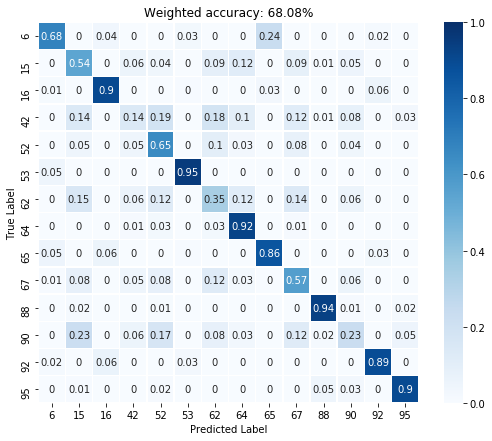

Training loss at epoch 1400: 0.887489080429


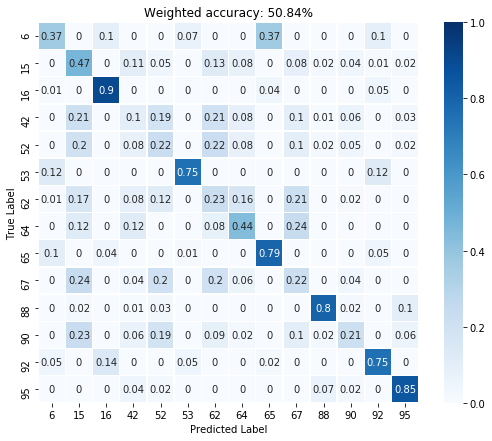

Dev loss at epoch 1400: 1.33255326748


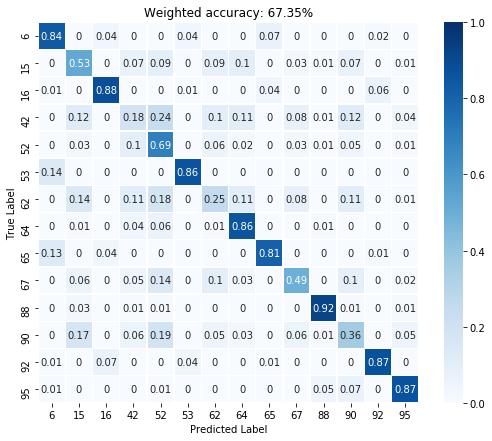

Training loss at epoch 1500: 0.889798343182


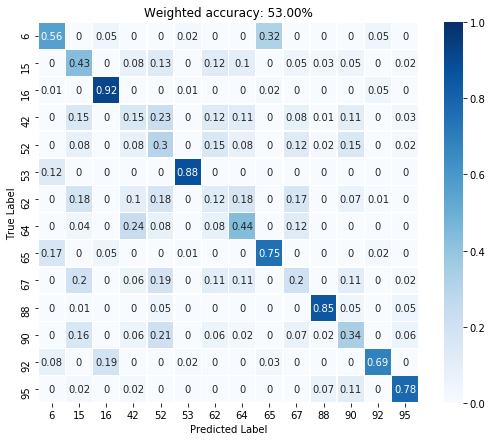

Dev loss at epoch 1500: 1.26623868942


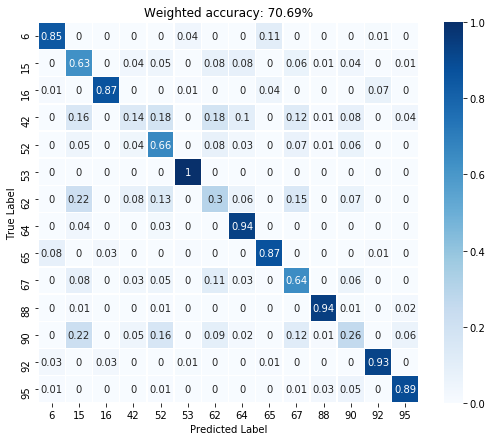

Training loss at epoch 1600: 0.840264320374


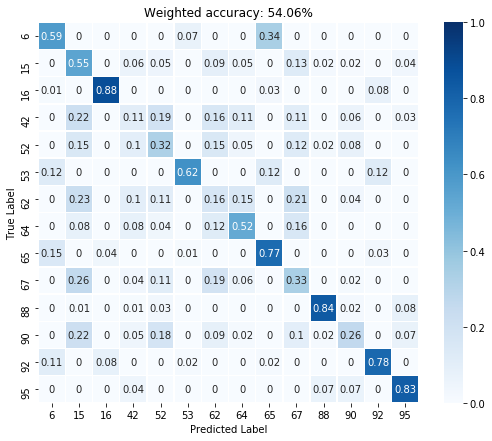

Dev loss at epoch 1600: 1.26002788544


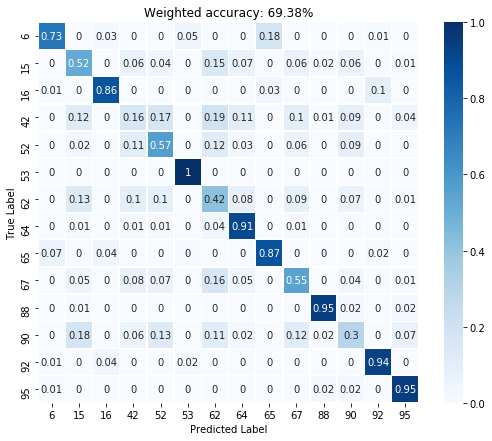

Training loss at epoch 1700: 0.847952485085


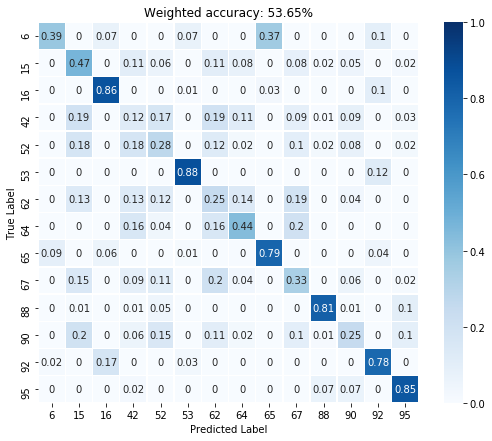

Dev loss at epoch 1700: 1.27124202251


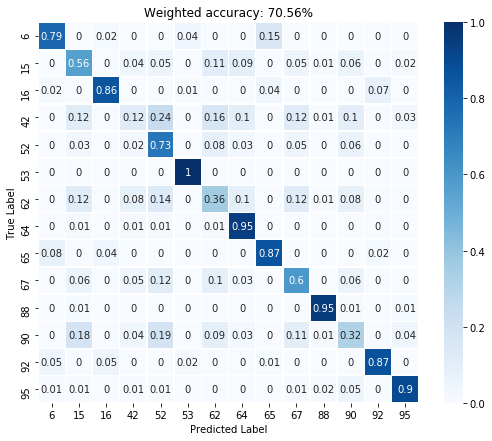

Training loss at epoch 1800: 0.832468569279


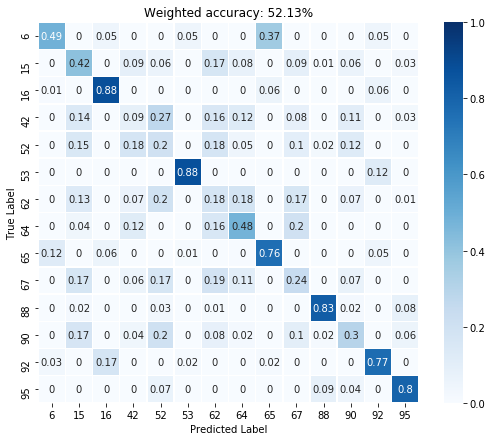

Dev loss at epoch 1800: 1.28501439095


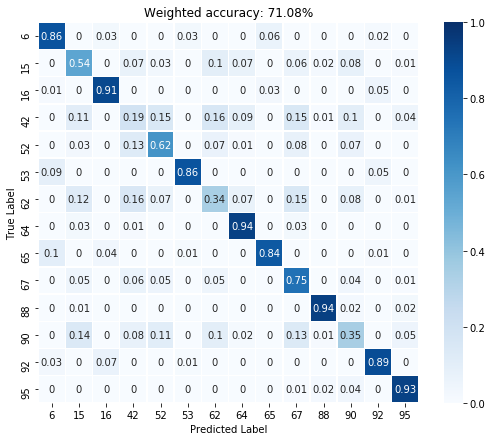

Training loss at epoch 1900: 0.812357842922


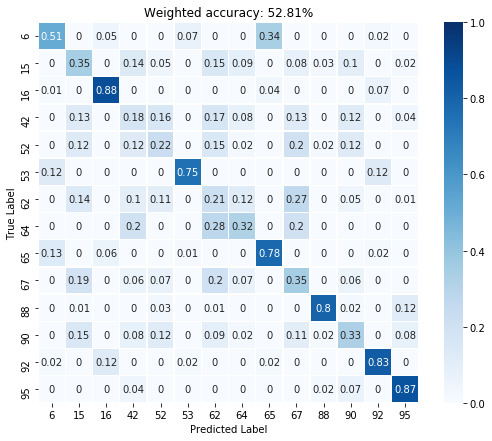

Dev loss at epoch 1900: 1.31381809711


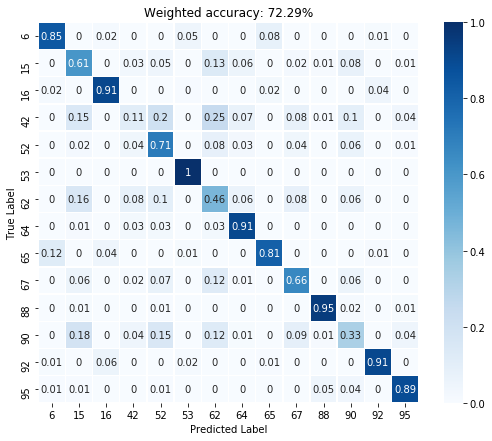

Training loss at epoch 2000: 0.794573903084


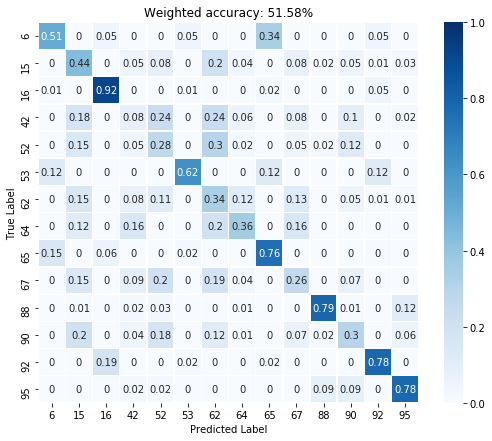

Dev loss at epoch 2000: 1.37962186337


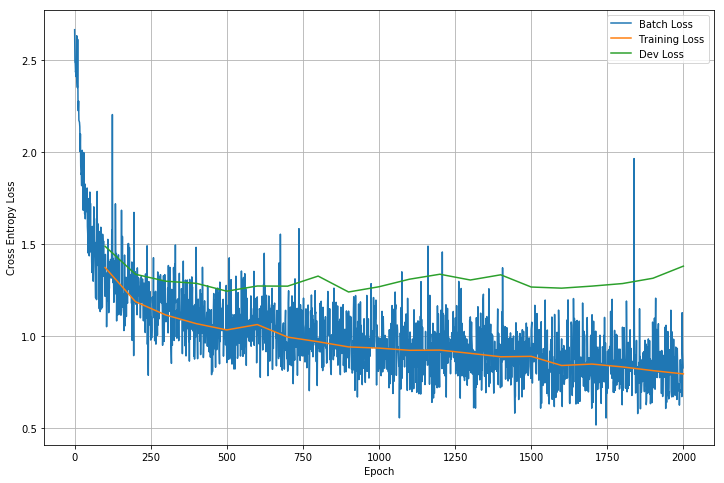

CPU times: user 43min 32s, sys: 1min 44s, total: 45min 16s
Wall time: 21min 12s


In [78]:
%%time
model = LSTMWithMetadata(n_passbands, n_classes, X.shape[1])
train_model(model)